In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Set paths

CONTENT_DIR = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content"
STYLE_IMAGE_PATH = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/Van-Gogh-Starry-Night.jpg" # single image
SAVE_DIR = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp"
checkpoint_path = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs/pspm_checkpoint_hyp.pth"

In [ ]:
import os
if os.path.exists(CONTENT_DIR):
    print("Directory exists.")
    #print("Files in folder:", os.listdir(CONTENT_DIR)[:5])  # show first 5 files
else:
    print("Directory does NOT exist.")

Directory exists.


In [ ]:
import csv

log_path = "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/pspm_hparam_log.csv"
os.makedirs(os.path.dirname(log_path), exist_ok=True)

if not os.path.exists(log_path):
    with open(log_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([
            "Run", "Content Weight", "Style Weight", "Learning Rate", "Optimizer",
            "Final Content Loss", "Final Content Loss", "Final Style Loss", "Final Total Loss",
            "Model Path"
        ])

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, datasets, models
from torchvision.datasets.folder import default_loader
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchvision.utils import save_image
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
from collections import namedtuple
import time
from tqdm import tqdm

# Gram Matrix for style loss
def gram_matrix(tensor):
    B, C, H, W = tensor.size()
    features = tensor.view(B, C, H * W)
    G = torch.bmm(features, features.transpose(1, 2))
    return G / (C * H * W)

In [ ]:
class FlatFolderDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.image_paths = [
            os.path.join(folder_path, fname)
            for fname in os.listdir(folder_path)
            if fname.lower().endswith(('.jpg', '.jpeg', '.png'))
        ]
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Try to open and process the image
        try:
            img = Image.open(self.image_paths[idx]).convert('RGB')
            if self.transform:
                img = self.transform(img)
            return img, 0 #dummy label
        except Exception as e:
            print(f"\nSkipping {self.image_paths[idx]} (Unopenable: {e})")
            return self.__getitem__((idx + 1) % len(self.image_paths))  # move to next image

In [ ]:
def load_content_image(img_path):
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(img_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image

In [ ]:
class VGGFeatures(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg19(pretrained=True).features.eval()
        self.required = {'relu1_2': 3, 'relu2_2': 8, 'relu3_3': 17, 'relu4_3': 22}
        self.slice = nn.Sequential()
        for i in range(max(self.required.values()) + 1):
            self.slice.add_module(str(i), vgg[i])
        for param in self.slice.parameters():
            param.requires_grad = False

    def forward(self, x):
        out = {}
        for name, layer in self.slice._modules.items():
            x = layer(x)
            for key, idx in self.required.items():
                if int(name) == idx:
                    out[key] = x
        return out

In [ ]:
class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super().__init__()
        padding = kernel_size // 2
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.norm = nn.InstanceNorm2d(out_channels, affine=True)
        self.relu = nn.ReLU()

    def forward(self, x):
        return self.relu(self.norm(self.conv(x)))

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvLayer(channels, channels, 3, 1),
            ConvLayer(channels, channels, 3, 1),
        )

    def forward(self, x):
        return x + self.block(x)

class UpsampleConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, scale_factor):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=scale_factor, mode='nearest')
        self.conv = ConvLayer(in_channels, out_channels, kernel_size, 1)

    def forward(self, x):
        x = self.upsample(x)
        return self.conv(x)

class TransformerNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            ConvLayer(3, 32, 9, 1),
            ConvLayer(32, 64, 3, 2),
            ConvLayer(64, 128, 3, 2),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            ResidualBlock(128),
            UpsampleConvLayer(128, 64, 3, 2),
            UpsampleConvLayer(64, 32, 3, 2),
            nn.Conv2d(32, 3, 9, 1, padding=4)
            # No tanh activation —> output stays unbounded
        )

    def forward(self, x):
        return self.model(x)  # Clamp later

In [ ]:
def total_variation_loss(x):
    return torch.sum(torch.abs(x[:, :, :, :-1] - x[:, :, :, 1:])) + \
           torch.sum(torch.abs(x[:, :, :-1, :] - x[:, :, 1:, :]))

def compute_losses(vgg, output, content, style_features, content_weight, style_weight, tv_weight):
    out_feats = vgg(output)
    content_feats = vgg(content)

    content_loss = F.mse_loss(out_feats['relu2_2'], content_feats['relu2_2'])

    style_loss = 0
    for layer in style_features:
        G_out = gram_matrix(out_feats[layer])
        G_style = style_features[layer]
        style_loss += F.mse_loss(G_out, G_style)

    tv_loss = total_variation_loss(output)

    total_loss = (content_weight * content_loss +
                  style_weight * style_loss +
                  tv_weight * tv_loss)
    return total_loss

In [ ]:
def load_style_image(style_path, transform):
    img = Image.open(style_path).convert('RGB')
    img = transform(img).unsqueeze(0)
    return img

In [ ]:
# Define experiment configuration format
RunConfig = namedtuple("RunConfig", ["run_id", "cw", "sw", "lr"])

# Define experiments
experiments = [
    RunConfig("A", 1.0, 5e4, 1e-3),
    RunConfig("B", 1.0, 1e5, 1e-3),
    RunConfig("C", 1.0, 2e5, 1e-3),
    RunConfig("D", 2.0, 5e4, 1e-3),
    RunConfig("E", 2.0, 1e5, 1e-3),
    RunConfig("F", 2.0, 2e5, 1e-3),
]

RunConfig_opt = namedtuple("RunConfig_opt", ["run_id", "cw", "sw", "lr", "optimizer"])

experiments_opt = [
    RunConfig_opt("G", 1.0, 5e4, 1e-3, "rmsprop"),
    RunConfig_opt("H", 1.0, 1e5, 1e-3, "rmsprop"),
    RunConfig_opt("I", 1.0, 2e5, 1e-3, "rmsprop"),
    RunConfig_opt("J", 2.0, 5e4, 1e-3, "rmsprop"),
    RunConfig_opt("K", 2.0, 1e5, 1e-3, "rmsprop"),
    RunConfig_opt("L", 2.0, 2e5, 1e-3, "rmsprop"),
]

In [ ]:
def run_experiment(run: RunConfig_opt, dataloader, style_img, save_dir, tv_weight=1e-6):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    print(f"\nRunning Experiment {run.run_id} | cw={run.cw}, sw={run.sw}, lr={run.lr}, optimizer={run.optimizer}")
    model_path = f"/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c{run.cw}_s{run.sw}_lr{run.lr}_{run.optimizer}.pth"
    checkpoint_path = model_path.replace(".pth", "_checkpoint.pth")

    transformer = TransformerNet().to(device)

    # Extract style features and precompute Gram matrices
    vgg = VGGFeatures().to(device).eval()
    style_feats = vgg(style_img.to(device))
    style_grams = {k: gram_matrix(v).detach() for k, v in style_feats.items()}

    content_losses, style_losses, total_losses = [], [], []

    start_epoch = 0
    start_batch = 0
    total_batches = len(dataloader)
    training_finished = False

    # Optimizer
    if run.optimizer.lower() == "adam":
        optimizer = torch.optim.Adam(transformer.parameters(), lr=run.lr)
    elif run.optimizer.lower() == "rmsprop":
        optimizer = torch.optim.RMSprop(transformer.parameters(), lr=run.lr)
    else:
        raise ValueError(f"Unsupported optimizer: {run.optimizer}")

    # Resume logic
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=device)
        transformer.load_state_dict(checkpoint['model'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        start_epoch = checkpoint.get('epoch', 0)
        start_batch = checkpoint.get('batch', 0)
        content_losses = checkpoint.get('content_losses', [])
        style_losses = checkpoint.get('style_losses', [])
        total_losses = checkpoint.get('total_losses', [])
        training_finished = checkpoint.get('finished', False)

        if training_finished:
            print("\nTraining already completed. Skipping...")
            return

        print(f"\nResuming from epoch {start_epoch}, batch {start_batch}...")

    transformer.train()

    for epoch in range(start_epoch, 2):
        print(f"\nEpoch {epoch + 1}/2")
        transformer.train()

        for batch_idx, (batch, _) in enumerate(
            tqdm(dataloader, desc=f"Epoch {epoch+1}", total=total_batches, initial=start_batch)
        ):
            if epoch == start_epoch and batch_idx < start_batch:
                continue  # Skip batches already processed before checkpoint

            content = batch.to(device)
            output = transformer(content)

            out_feats = vgg(output)
            content_feats = vgg(content)

            # Loss calculations
            content_loss = F.mse_loss(out_feats['relu2_2'], content_feats['relu2_2'])

            style_loss = 0
            for layer in style_grams:
                G_style = style_grams[layer]
                G_out_batch = gram_matrix(out_feats[layer])
                style_loss += F.mse_loss(G_out_batch, G_style.expand_as(G_out_batch))
            style_loss /= G_out_batch.size(0)

            tv_loss = total_variation_loss(output)
            total_loss = run.cw * content_loss + run.sw * style_loss + tv_weight * tv_loss

            # Backpropagation
            optimizer.zero_grad()
            total_loss.backward()
            optimizer.step()

            # Log losses
            content_losses.append(content_loss.item())
            style_losses.append(style_loss.item())
            total_losses.append(total_loss.item())

            # Print every 200 batches
            if batch_idx % 200 == 0:
                print(f"\n[Batch {batch_idx}] Content: {content_loss.item():.4f} | "
                      f"Style: {style_loss.item():.4f} | Total: {total_loss.item():.4f}")

            # Save stylized preview every 300 batches
            if batch_idx % 300 == 0 and save_dir:
                transformer.eval()
                with torch.no_grad():
                    out_img = transformer(content).cpu()[0]
                    out_np = deprocess(out_img)
                    os.makedirs(save_dir, exist_ok=True)
                    out_path = os.path.join(save_dir, f"{run.run_id}_batch{batch_idx}.jpg")
                    Image.fromarray(out_np).save(out_path)
                    print(f"\nSaved preview image to {out_path}")
                transformer.train()

            # Save checkpoint every batch
            torch.save({
                'model': transformer.state_dict(),
                'optimizer': optimizer.state_dict(),
                'epoch': epoch,
                'batch': batch_idx + 1,
                'content_losses': content_losses,
                'style_losses': style_losses,
                'total_losses': total_losses,
                'finished': False  # Mark as unfinished
            }, checkpoint_path)

    # Mark checkpoint as complete
    torch.save({
        'model': transformer.state_dict(),
        'optimizer': optimizer.state_dict(),
        'epoch': epoch + 1,
        'batch': 0,
        'content_losses': content_losses,
        'style_losses': style_losses,
        'total_losses': total_losses,
        'finished': True  # Mark as finished
    }, checkpoint_path)

    # Save final model
    torch.save(transformer.state_dict(), model_path)

    # Log to CSV
    with open(log_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([
            run.run_id, run.cw, run.sw, run.lr, run.optimizer,
            round(content_losses[-1], 4),
            round(style_losses[-1], 4),
            round(total_losses[-1], 4),
            model_path
        ])

In [ ]:
# Preprocessing
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def deprocess(tensor):
    tensor = tensor.clone().cpu()
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    tensor = tensor * std + mean  # Unnormalize
    tensor = tensor.clamp(0, 1)   # Clamp to [0, 1]
    tensor = tensor.permute(1, 2, 0)  # CHW → HWC
    return (tensor.numpy() * 255).astype('uint8') # Convert to [0, 255] for display

# Load flat folder of images
content_dataset = FlatFolderDataset(folder_path=CONTENT_DIR, transform=transform)
content_loader = DataLoader(content_dataset, batch_size=4, num_workers = 4, shuffle=True)

# Load and preprocess style image
style_img = load_style_image(STYLE_IMAGE_PATH, transform)

# Initialize model
transformer = TransformerNet()

In [ ]:
# Run all experiments
for run in experiments:
    run_experiment(
        run=run,
        dataloader=content_loader,
        style_img=style_img,
        save_dir=SAVE_DIR
    )


Running Experiment A | cw=1.0, sw=50000.0, lr=0.001

Epoch 1/2


Epoch 1:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 7.9125 | Style: 0.0001 | Total: 13.7143


Epoch 1:   0%|          | 1/12497 [00:01<3:45:32,  1.08s/it]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch0.jpg


Epoch 1:   2%|▏         | 202/12497 [05:21<28:39,  7.15it/s]


[Batch 200] Content: 3.4103 | Style: 0.0000 | Total: 5.1739


Epoch 1:   2%|▏         | 301/12497 [05:40<1:42:27,  1.98it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch300.jpg


Epoch 1:   3%|▎         | 359/12497 [05:50<26:49,  7.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:   3%|▎         | 402/12497 [05:58<27:32,  7.32it/s]


[Batch 400] Content: 3.0303 | Style: 0.0000 | Total: 4.6141


Epoch 1:   5%|▍         | 600/12497 [06:33<30:05,  6.59it/s]


[Batch 600] Content: 2.6562 | Style: 0.0000 | Total: 4.2621


Epoch 1:   5%|▍         | 601/12497 [06:34<1:18:11,  2.54it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch600.jpg


Epoch 1:   6%|▌         | 714/12497 [06:55<57:06,  3.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:   6%|▌         | 733/12497 [06:58<37:49,  5.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:   6%|▋         | 801/12497 [07:10<25:09,  7.75it/s]


[Batch 800] Content: 2.5726 | Style: 0.0000 | Total: 4.2456


Epoch 1:   7%|▋         | 828/12497 [07:15<39:16,  4.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:   7%|▋         | 901/12497 [07:29<1:20:28,  2.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch900.jpg


Epoch 1:   8%|▊         | 980/12497 [07:42<34:00,  5.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:   8%|▊         | 1000/12497 [07:46<26:04,  7.35it/s]


[Batch 1000] Content: 2.0002 | Style: 0.0000 | Total: 3.4167


Epoch 1:   8%|▊         | 1009/12497 [07:48<52:21,  3.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  10%|▉         | 1200/12497 [08:21<25:13,  7.47it/s]


[Batch 1200] Content: 2.1292 | Style: 0.0000 | Total: 3.6810


Epoch 1:  10%|▉         | 1201/12497 [08:23<1:42:07,  1.84it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch1200.jpg


Epoch 1:  11%|█         | 1402/12497 [08:59<32:56,  5.61it/s]


[Batch 1400] Content: 2.3234 | Style: 0.0000 | Total: 3.8323


Epoch 1:  12%|█▏        | 1501/12497 [09:17<1:16:21,  2.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch1500.jpg


Epoch 1:  12%|█▏        | 1515/12497 [09:19<30:21,  6.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  12%|█▏        | 1520/12497 [09:20<42:52,  4.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  13%|█▎        | 1602/12497 [09:35<31:58,  5.68it/s]


[Batch 1600] Content: 1.9712 | Style: 0.0000 | Total: 3.3882


Epoch 1:  14%|█▍        | 1724/12497 [09:57<26:47,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  14%|█▍        | 1800/12497 [10:11<40:52,  4.36it/s]


[Batch 1800] Content: 1.8999 | Style: 0.0000 | Total: 3.6010


Epoch 1:  14%|█▍        | 1801/12497 [10:12<1:20:58,  2.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch1800.jpg


Epoch 1:  16%|█▌        | 2002/12497 [10:47<25:56,  6.74it/s]


[Batch 2000] Content: 1.8738 | Style: 0.0000 | Total: 3.7161


Epoch 1:  17%|█▋        | 2100/12497 [11:04<24:24,  7.10it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch2100.jpg


Epoch 1:  17%|█▋        | 2119/12497 [11:08<35:03,  4.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  18%|█▊        | 2201/12497 [11:23<26:26,  6.49it/s]


[Batch 2200] Content: 1.7538 | Style: 0.0000 | Total: 3.3529


Epoch 1:  18%|█▊        | 2288/12497 [11:38<27:45,  6.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  19%|█▉        | 2401/12497 [11:58<26:20,  6.39it/s]


[Batch 2400] Content: 1.8528 | Style: 0.0000 | Total: 3.3735

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch2400.jpg


Epoch 1:  21%|██        | 2601/12497 [12:34<23:10,  7.12it/s]


[Batch 2600] Content: 1.8804 | Style: 0.0000 | Total: 3.5155


Epoch 1:  22%|██▏       | 2701/12497 [12:52<23:20,  7.00it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch2700.jpg


Epoch 1:  22%|██▏       | 2720/12497 [12:55<21:27,  7.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  22%|██▏       | 2800/12497 [13:10<22:43,  7.11it/s]


[Batch 2800] Content: 1.9393 | Style: 0.0000 | Total: 3.6833


Epoch 1:  23%|██▎       | 2902/12497 [13:28<24:22,  6.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  24%|██▍       | 3000/12497 [13:45<20:29,  7.72it/s]


[Batch 3000] Content: 1.6482 | Style: 0.0000 | Total: 3.4325


Epoch 1:  24%|██▍       | 3001/12497 [13:47<1:24:02,  1.88it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3000.jpg


Epoch 1:  24%|██▍       | 3054/12497 [13:56<22:46,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:  25%|██▌       | 3154/12497 [14:15<31:17,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  26%|██▌       | 3199/12497 [14:22<21:25,  7.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  26%|██▌       | 3201/12497 [14:23<35:58,  4.31it/s]


[Batch 3200] Content: 2.0514 | Style: 0.0000 | Total: 3.5105


Epoch 1:  26%|██▌       | 3211/12497 [14:25<24:54,  6.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  26%|██▌       | 3259/12497 [14:33<27:35,  5.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  26%|██▋       | 3301/12497 [14:41<55:28,  2.76it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3300.jpg


Epoch 1:  27%|██▋       | 3371/12497 [14:54<24:51,  6.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  27%|██▋       | 3401/12497 [15:00<22:13,  6.82it/s]


[Batch 3400] Content: 1.8113 | Style: 0.0000 | Total: 3.5307


Epoch 1:  28%|██▊       | 3452/12497 [15:09<23:03,  6.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  29%|██▉       | 3600/12497 [15:36<35:17,  4.20it/s]


[Batch 3600] Content: 1.9934 | Style: 0.0000 | Total: 3.6283


Epoch 1:  29%|██▉       | 3601/12497 [15:37<1:06:17,  2.24it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3600.jpg


Epoch 1:  30%|███       | 3801/12497 [16:13<26:13,  5.53it/s]


[Batch 3800] Content: 1.6206 | Style: 0.0000 | Total: 3.3380


Epoch 1:  31%|███       | 3896/12497 [16:30<23:07,  6.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  31%|███       | 3901/12497 [16:32<1:13:37,  1.95it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3900.jpg


Epoch 1:  32%|███▏      | 4001/12497 [16:50<23:17,  6.08it/s]


[Batch 4000] Content: 1.7941 | Style: 0.0000 | Total: 3.3511


Epoch 1:  33%|███▎      | 4114/12497 [17:11<20:51,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  33%|███▎      | 4171/12497 [17:21<19:37,  7.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  33%|███▎      | 4184/12497 [17:24<21:50,  6.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  34%|███▎      | 4200/12497 [17:27<19:49,  6.98it/s]


[Batch 4200] Content: 1.9176 | Style: 0.0000 | Total: 3.3411


Epoch 1:  34%|███▎      | 4201/12497 [17:28<57:57,  2.39it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch4200.jpg


Epoch 1:  35%|███▌      | 4401/12497 [18:04<19:02,  7.09it/s]


[Batch 4400] Content: 2.0292 | Style: 0.0000 | Total: 3.7283


Epoch 1:  36%|███▌      | 4501/12497 [18:24<56:09,  2.37it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch4500.jpg


Epoch 1:  37%|███▋      | 4600/12497 [18:42<18:35,  7.08it/s]


[Batch 4600] Content: 1.8277 | Style: 0.0000 | Total: 3.2057


Epoch 1:  37%|███▋      | 4615/12497 [18:45<19:26,  6.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  37%|███▋      | 4658/12497 [18:53<31:00,  4.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  38%|███▊      | 4780/12497 [19:15<24:11,  5.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  38%|███▊      | 4794/12497 [19:18<29:48,  4.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  38%|███▊      | 4800/12497 [19:19<35:09,  3.65it/s]


[Batch 4800] Content: 1.6823 | Style: 0.0000 | Total: 3.3072


Epoch 1:  38%|███▊      | 4801/12497 [19:21<1:04:00,  2.00it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch4800.jpg


Epoch 1:  40%|████      | 5001/12497 [19:57<25:29,  4.90it/s]


[Batch 5000] Content: 1.5299 | Style: 0.0000 | Total: 3.0562


Epoch 1:  41%|████      | 5100/12497 [20:14<18:19,  6.73it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch5100.jpg


Epoch 1:  42%|████▏     | 5201/12497 [20:34<19:23,  6.27it/s]


[Batch 5200] Content: 1.6771 | Style: 0.0000 | Total: 3.0329


Epoch 1:  43%|████▎     | 5378/12497 [21:06<17:34,  6.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:  43%|████▎     | 5400/12497 [21:10<19:46,  5.98it/s]


[Batch 5400] Content: 2.4339 | Style: 0.0000 | Total: 4.1276


Epoch 1:  43%|████▎     | 5401/12497 [21:11<47:38,  2.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch5400.jpg


Epoch 1:  45%|████▍     | 5600/12497 [21:48<17:07,  6.71it/s]


[Batch 5600] Content: 1.5947 | Style: 0.0000 | Total: 3.2458


Epoch 1:  46%|████▌     | 5701/12497 [22:08<45:48,  2.47it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch5700.jpg


Epoch 1:  46%|████▌     | 5723/12497 [22:12<21:02,  5.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  46%|████▋     | 5801/12497 [22:27<26:38,  4.19it/s]


[Batch 5800] Content: 1.7091 | Style: 0.0000 | Total: 3.2783


Epoch 1:  47%|████▋     | 5856/12497 [22:37<30:54,  3.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  47%|████▋     | 5899/12497 [22:45<17:11,  6.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  48%|████▊     | 5945/12497 [22:54<22:35,  4.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  48%|████▊     | 6000/12497 [23:04<23:04,  4.69it/s]


[Batch 6000] Content: 1.6859 | Style: 0.0000 | Total: 3.3161


Epoch 1:  48%|████▊     | 6001/12497 [23:05<47:33,  2.28it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6000.jpg


Epoch 1:  50%|████▉     | 6201/12497 [23:43<19:54,  5.27it/s]


[Batch 6200] Content: 1.4565 | Style: 0.0000 | Total: 2.7800


Epoch 1:  50%|█████     | 6301/12497 [24:03<52:52,  1.95it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6300.jpg


Epoch 1:  51%|█████     | 6401/12497 [24:21<14:16,  7.12it/s]


[Batch 6400] Content: 1.5985 | Style: 0.0000 | Total: 3.2183


Epoch 1:  53%|█████▎    | 6567/12497 [24:52<18:14,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  53%|█████▎    | 6600/12497 [24:58<16:43,  5.87it/s]


[Batch 6600] Content: 1.6522 | Style: 0.0000 | Total: 3.2378


Epoch 1:  53%|█████▎    | 6601/12497 [24:59<39:34,  2.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6600.jpg


Epoch 1:  54%|█████▍    | 6801/12497 [25:37<13:52,  6.84it/s]


[Batch 6800] Content: 1.7930 | Style: 0.0000 | Total: 3.1766


Epoch 1:  55%|█████▌    | 6901/12497 [25:57<37:45,  2.47it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6900.jpg


Epoch 1:  56%|█████▌    | 7001/12497 [26:16<15:58,  5.73it/s]


[Batch 7000] Content: 1.8116 | Style: 0.0000 | Total: 3.2144


Epoch 1:  57%|█████▋    | 7118/12497 [26:38<19:07,  4.69it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  57%|█████▋    | 7156/12497 [26:45<19:38,  4.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  57%|█████▋    | 7164/12497 [26:47<21:02,  4.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  58%|█████▊    | 7200/12497 [26:53<14:27,  6.11it/s]


[Batch 7200] Content: 1.7889 | Style: 0.0000 | Total: 3.2289


Epoch 1:  58%|█████▊    | 7201/12497 [26:55<37:16,  2.37it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch7200.jpg


Epoch 1:  58%|█████▊    | 7242/12497 [27:02<17:53,  4.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  59%|█████▉    | 7401/12497 [27:32<18:34,  4.57it/s]


[Batch 7400] Content: 1.6340 | Style: 0.0000 | Total: 3.0042


Epoch 1:  60%|█████▉    | 7456/12497 [27:42<16:50,  4.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  60%|█████▉    | 7471/12497 [27:45<20:19,  4.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:  60%|█████▉    | 7480/12497 [27:47<17:17,  4.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  60%|██████    | 7501/12497 [27:52<35:56,  2.32it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch7500.jpg


Epoch 1:  61%|██████    | 7577/12497 [28:06<12:25,  6.60it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  61%|██████    | 7601/12497 [28:10<12:27,  6.55it/s]


[Batch 7600] Content: 1.7043 | Style: 0.0000 | Total: 3.1073


Epoch 1:  62%|██████▏   | 7784/12497 [28:45<19:10,  4.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  62%|██████▏   | 7800/12497 [28:48<20:21,  3.84it/s]


[Batch 7800] Content: 1.5766 | Style: 0.0000 | Total: 3.0889


Epoch 1:  62%|██████▏   | 7801/12497 [28:49<37:13,  2.10it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch7800.jpg


Epoch 1:  63%|██████▎   | 7875/12497 [29:02<10:20,  7.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  64%|██████▍   | 8001/12497 [29:27<11:03,  6.78it/s]


[Batch 8000] Content: 1.7323 | Style: 0.0000 | Total: 3.2766


Epoch 1:  65%|██████▍   | 8079/12497 [29:41<11:14,  6.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  65%|██████▍   | 8101/12497 [29:46<30:11,  2.43it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch8100.jpg


Epoch 1:  66%|██████▌   | 8201/12497 [30:05<12:15,  5.84it/s]


[Batch 8200] Content: 1.5805 | Style: 0.0000 | Total: 3.0331


Epoch 1:  67%|██████▋   | 8323/12497 [30:29<11:56,  5.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  67%|██████▋   | 8400/12497 [30:43<10:25,  6.55it/s]


[Batch 8400] Content: 1.6605 | Style: 0.0000 | Total: 3.2212


Epoch 1:  67%|██████▋   | 8401/12497 [30:44<32:05,  2.13it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch8400.jpg


Epoch 1:  68%|██████▊   | 8476/12497 [30:58<11:53,  5.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  68%|██████▊   | 8497/12497 [31:02<12:17,  5.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  69%|██████▉   | 8601/12497 [31:22<11:07,  5.84it/s]


[Batch 8600] Content: 1.5720 | Style: 0.0000 | Total: 3.0552


Epoch 1:  70%|██████▉   | 8695/12497 [31:39<09:40,  6.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  70%|██████▉   | 8701/12497 [31:41<29:18,  2.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch8700.jpg


Epoch 1:  70%|███████   | 8800/12497 [32:00<09:00,  6.84it/s]


[Batch 8800] Content: 1.6867 | Style: 0.0000 | Total: 3.0366


Epoch 1:  72%|███████▏  | 8945/12497 [32:28<11:24,  5.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  72%|███████▏  | 9000/12497 [32:38<10:55,  5.33it/s]


[Batch 9000] Content: 1.4824 | Style: 0.0000 | Total: 2.7211


Epoch 1:  72%|███████▏  | 9001/12497 [32:39<23:55,  2.44it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9000.jpg


Epoch 1:  74%|███████▎  | 9201/12497 [33:18<13:31,  4.06it/s]


[Batch 9200] Content: 1.6626 | Style: 0.0000 | Total: 3.2098


Epoch 1:  74%|███████▍  | 9300/12497 [33:36<07:59,  6.67it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9300.jpg


Epoch 1:  75%|███████▌  | 9401/12497 [33:56<07:33,  6.82it/s]


[Batch 9400] Content: 1.5215 | Style: 0.0000 | Total: 3.1555


Epoch 1:  77%|███████▋  | 9600/12497 [34:33<11:53,  4.06it/s]


[Batch 9600] Content: 1.8262 | Style: 0.0000 | Total: 3.2823


Epoch 1:  77%|███████▋  | 9601/12497 [34:34<22:30,  2.14it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9600.jpg


Epoch 1:  77%|███████▋  | 9680/12497 [34:50<08:02,  5.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  78%|███████▊  | 9750/12497 [35:03<08:59,  5.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  78%|███████▊  | 9801/12497 [35:13<06:30,  6.91it/s]


[Batch 9800] Content: 1.5669 | Style: 0.0000 | Total: 3.0178


Epoch 1:  79%|███████▊  | 9812/12497 [35:15<09:28,  4.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  79%|███████▉  | 9901/12497 [35:33<16:27,  2.63it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9900.jpg


Epoch 1:  80%|███████▉  | 9943/12497 [35:41<12:10,  3.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  80%|████████  | 10001/12497 [35:52<06:02,  6.88it/s]


[Batch 10000] Content: 1.6129 | Style: 0.0000 | Total: 3.0868


Epoch 1:  80%|████████  | 10058/12497 [36:03<06:04,  6.69it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  82%|████████▏ | 10200/12497 [36:30<05:39,  6.76it/s]


[Batch 10200] Content: 1.5603 | Style: 0.0000 | Total: 3.1919


Epoch 1:  82%|████████▏ | 10201/12497 [36:31<20:59,  1.82it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch10200.jpg


Epoch 1:  83%|████████▎ | 10401/12497 [37:10<06:02,  5.78it/s]


[Batch 10400] Content: 1.6869 | Style: 0.0000 | Total: 3.1506


Epoch 1:  84%|████████▍ | 10501/12497 [37:30<14:04,  2.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch10500.jpg


Epoch 1:  85%|████████▍ | 10601/12497 [37:50<06:41,  4.73it/s]


[Batch 10600] Content: 1.5993 | Style: 0.0000 | Total: 3.1074


Epoch 1:  86%|████████▋ | 10800/12497 [38:28<04:59,  5.67it/s]


[Batch 10800] Content: 1.7169 | Style: 0.0000 | Total: 3.1870


Epoch 1:  86%|████████▋ | 10801/12497 [38:29<11:30,  2.46it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch10800.jpg


Epoch 1:  87%|████████▋ | 10866/12497 [38:41<07:56,  3.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  88%|████████▊ | 11001/12497 [39:07<04:49,  5.17it/s]


[Batch 11000] Content: 1.5746 | Style: 0.0000 | Total: 2.8008


Epoch 1:  88%|████████▊ | 11010/12497 [39:09<04:21,  5.69it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:  89%|████████▉ | 11101/12497 [39:27<10:46,  2.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch11100.jpg


Epoch 1:  89%|████████▉ | 11177/12497 [39:41<03:18,  6.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  90%|████████▉ | 11201/12497 [39:46<03:14,  6.67it/s]


[Batch 11200] Content: 1.7217 | Style: 0.0000 | Total: 3.2869


Epoch 1:  90%|████████▉ | 11229/12497 [39:52<03:53,  5.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  91%|█████████ | 11354/12497 [40:16<03:41,  5.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  91%|█████████ | 11400/12497 [40:25<03:48,  4.80it/s]


[Batch 11400] Content: 1.7294 | Style: 0.0000 | Total: 3.1767


Epoch 1:  91%|█████████ | 11401/12497 [40:26<08:07,  2.25it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch11400.jpg


Epoch 1:  92%|█████████▏| 11521/12497 [40:49<02:39,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  92%|█████████▏| 11550/12497 [40:55<02:45,  5.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  93%|█████████▎| 11600/12497 [41:04<02:18,  6.46it/s]


[Batch 11600] Content: 1.6728 | Style: 0.0000 | Total: 3.3261


Epoch 1:  94%|█████████▎| 11701/12497 [41:24<05:06,  2.60it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch11700.jpg


Epoch 1:  94%|█████████▍| 11761/12497 [41:35<02:07,  5.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  94%|█████████▍| 11801/12497 [41:43<01:54,  6.09it/s]


[Batch 11800] Content: 1.3890 | Style: 0.0000 | Total: 2.8644


Epoch 1:  95%|█████████▍| 11849/12497 [41:53<01:42,  6.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  96%|█████████▌| 12000/12497 [42:22<01:36,  5.13it/s]


[Batch 12000] Content: 1.4422 | Style: 0.0000 | Total: 2.9869


Epoch 1:  96%|█████████▌| 12001/12497 [42:23<03:30,  2.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch12000.jpg


Epoch 1:  97%|█████████▋| 12077/12497 [42:38<01:46,  3.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  97%|█████████▋| 12091/12497 [42:40<00:59,  6.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  97%|█████████▋| 12158/12497 [42:53<00:51,  6.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  98%|█████████▊| 12200/12497 [43:01<00:45,  6.46it/s]


[Batch 12200] Content: 1.4574 | Style: 0.0000 | Total: 2.8606


Epoch 1:  98%|█████████▊| 12301/12497 [43:22<01:17,  2.54it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch12300.jpg


Epoch 1:  99%|█████████▉| 12401/12497 [43:42<00:16,  5.96it/s]


[Batch 12400] Content: 1.3839 | Style: 0.0000 | Total: 3.0177


Epoch 1: 100%|██████████| 12497/12497 [44:00<00:00,  4.73it/s]



Epoch 2/2


Epoch 2:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 2.3783 | Style: 0.0000 | Total: 4.0242

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch0.jpg


Epoch 2:   1%|          | 139/12497 [00:27<40:03,  5.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:   1%|▏         | 165/12497 [00:32<30:39,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:   2%|▏         | 201/12497 [00:39<52:29,  3.90it/s]  


[Batch 200] Content: 1.4662 | Style: 0.0000 | Total: 2.8206


Epoch 2:   2%|▏         | 301/12497 [00:59<34:14,  5.94it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch300.jpg


Epoch 2:   3%|▎         | 401/12497 [01:19<43:58,  4.58it/s]


[Batch 400] Content: 1.3545 | Style: 0.0000 | Total: 2.7774


Epoch 2:   4%|▍         | 551/12497 [01:48<58:54,  3.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:   5%|▍         | 601/12497 [01:58<39:23,  5.03it/s]


[Batch 600] Content: 1.5834 | Style: 0.0000 | Total: 3.0862

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch600.jpg


Epoch 2:   6%|▋         | 801/12497 [02:37<35:20,  5.52it/s]


[Batch 800] Content: 1.5119 | Style: 0.0000 | Total: 2.8405


Epoch 2:   7%|▋         | 901/12497 [02:57<44:04,  4.38it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch900.jpg


Epoch 2:   8%|▊         | 1001/12497 [03:16<32:27,  5.90it/s]


[Batch 1000] Content: 1.4369 | Style: 0.0000 | Total: 2.7320


Epoch 2:  10%|▉         | 1201/12497 [03:56<34:46,  5.41it/s]


[Batch 1200] Content: 1.4605 | Style: 0.0000 | Total: 2.7566

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch1200.jpg


Epoch 2:  11%|█         | 1401/12497 [04:35<30:30,  6.06it/s]


[Batch 1400] Content: 1.4349 | Style: 0.0000 | Total: 2.8166


Epoch 2:  11%|█▏        | 1425/12497 [04:40<30:29,  6.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  12%|█▏        | 1501/12497 [04:55<38:13,  4.79it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch1500.jpg


Epoch 2:  13%|█▎        | 1601/12497 [05:14<28:53,  6.28it/s]


[Batch 1600] Content: 1.5075 | Style: 0.0000 | Total: 2.9835


Epoch 2:  14%|█▍        | 1801/12497 [05:54<27:59,  6.37it/s]


[Batch 1800] Content: 1.7981 | Style: 0.0000 | Total: 3.1878

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch1800.jpg


Epoch 2:  15%|█▍        | 1848/12497 [06:03<26:41,  6.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  16%|█▌        | 2000/12497 [06:33<26:04,  6.71it/s]


[Batch 2000] Content: 1.3792 | Style: 0.0000 | Total: 2.7827


Epoch 2:  16%|█▋        | 2051/12497 [06:43<37:46,  4.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  17%|█▋        | 2101/12497 [06:52<31:34,  5.49it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch2100.jpg


Epoch 2:  18%|█▊        | 2201/12497 [07:12<42:32,  4.03it/s]


[Batch 2200] Content: 1.4941 | Style: 0.0000 | Total: 3.1360


Epoch 2:  19%|█▉        | 2401/12497 [07:52<42:19,  3.98it/s]


[Batch 2400] Content: 1.5792 | Style: 0.0000 | Total: 3.4178

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch2400.jpg


Epoch 2:  19%|█▉        | 2410/12497 [07:54<31:39,  5.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  20%|██        | 2530/12497 [08:18<32:11,  5.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  21%|██        | 2601/12497 [08:32<27:30,  6.00it/s]


[Batch 2600] Content: 1.5920 | Style: 0.0000 | Total: 3.0461


Epoch 2:  22%|██▏       | 2700/12497 [08:51<26:42,  6.11it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch2700.jpg


Epoch 2:  22%|██▏       | 2757/12497 [09:03<49:27,  3.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  22%|██▏       | 2801/12497 [09:12<29:32,  5.47it/s]


[Batch 2800] Content: 1.4103 | Style: 0.0000 | Total: 2.8714


Epoch 2:  23%|██▎       | 2867/12497 [09:25<26:12,  6.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  24%|██▍       | 3001/12497 [09:53<40:22,  3.92it/s]


[Batch 3000] Content: 1.4176 | Style: 0.0000 | Total: 2.6175

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3000.jpg


Epoch 2:  25%|██▌       | 3161/12497 [10:25<48:31,  3.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  26%|██▌       | 3201/12497 [10:33<23:48,  6.51it/s]


[Batch 3200] Content: 1.3750 | Style: 0.0000 | Total: 2.6713


Epoch 2:  26%|██▌       | 3204/12497 [10:34<34:03,  4.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  26%|██▌       | 3210/12497 [10:35<46:58,  3.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:  26%|██▋       | 3301/12497 [10:54<39:41,  3.86it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3300.jpg


Epoch 2:  27%|██▋       | 3401/12497 [11:14<28:37,  5.30it/s]


[Batch 3400] Content: 1.4886 | Style: 0.0000 | Total: 2.7299


Epoch 2:  29%|██▉       | 3601/12497 [11:56<34:28,  4.30it/s]


[Batch 3600] Content: 1.4433 | Style: 0.0000 | Total: 2.8264

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3600.jpg


Epoch 2:  29%|██▉       | 3683/12497 [12:13<27:54,  5.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  30%|██▉       | 3696/12497 [12:16<46:40,  3.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  30%|██▉       | 3746/12497 [12:26<33:07,  4.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  30%|███       | 3800/12497 [12:37<23:14,  6.24it/s]


[Batch 3800] Content: 1.4892 | Style: 0.0000 | Total: 2.8454


Epoch 2:  30%|███       | 3804/12497 [12:38<29:33,  4.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  30%|███       | 3811/12497 [12:39<32:53,  4.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:  31%|███       | 3901/12497 [12:58<28:35,  5.01it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch3900.jpg


Epoch 2:  32%|███▏      | 4001/12497 [13:18<22:17,  6.35it/s]


[Batch 4000] Content: 1.4761 | Style: 0.0000 | Total: 2.9730


Epoch 2:  34%|███▎      | 4201/12497 [13:59<24:16,  5.70it/s]


[Batch 4200] Content: 1.5666 | Style: 0.0000 | Total: 3.0516

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch4200.jpg


Epoch 2:  34%|███▍      | 4260/12497 [14:12<41:21,  3.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  35%|███▌      | 4401/12497 [14:41<22:20,  6.04it/s]


[Batch 4400] Content: 1.5365 | Style: 0.0000 | Total: 2.7245


Epoch 2:  36%|███▌      | 4479/12497 [14:57<26:42,  5.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  36%|███▌      | 4501/12497 [15:01<25:15,  5.28it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch4500.jpg


Epoch 2:  37%|███▋      | 4601/12497 [15:22<21:39,  6.07it/s]


[Batch 4600] Content: 1.6107 | Style: 0.0000 | Total: 2.9817


Epoch 2:  38%|███▊      | 4776/12497 [15:57<20:49,  6.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:  38%|███▊      | 4800/12497 [16:02<20:27,  6.27it/s]


[Batch 4800] Content: 1.3880 | Style: 0.0000 | Total: 2.8120


Epoch 2:  38%|███▊      | 4801/12497 [16:03<40:34,  3.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch4800.jpg


Epoch 2:  40%|████      | 5001/12497 [16:43<25:31,  4.89it/s]


[Batch 5000] Content: 1.3200 | Style: 0.0000 | Total: 2.7250


Epoch 2:  40%|████      | 5015/12497 [16:46<32:01,  3.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:  41%|████      | 5101/12497 [17:03<32:26,  3.80it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch5100.jpg


Epoch 2:  42%|████▏     | 5201/12497 [17:24<21:49,  5.57it/s]


[Batch 5200] Content: 1.3304 | Style: 0.0000 | Total: 2.6956


Epoch 2:  43%|████▎     | 5401/12497 [18:03<27:09,  4.35it/s]


[Batch 5400] Content: 1.5689 | Style: 0.0000 | Total: 3.0115

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch5400.jpg


Epoch 2:  45%|████▍     | 5601/12497 [18:44<19:58,  5.75it/s]


[Batch 5600] Content: 1.4918 | Style: 0.0000 | Total: 3.2873


Epoch 2:  46%|████▌     | 5688/12497 [19:01<18:25,  6.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  46%|████▌     | 5701/12497 [19:04<19:39,  5.76it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch5700.jpg


Epoch 2:  46%|████▋     | 5801/12497 [19:25<28:27,  3.92it/s]


[Batch 5800] Content: 1.5648 | Style: 0.0000 | Total: 2.9106


Epoch 2:  47%|████▋     | 5929/12497 [19:52<21:28,  5.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [20:06<19:04,  5.67it/s]


[Batch 6000] Content: 1.7079 | Style: 0.0000 | Total: 3.0419

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6000.jpg


Epoch 2:  50%|████▉     | 6201/12497 [20:48<24:38,  4.26it/s]


[Batch 6200] Content: 1.5530 | Style: 0.0000 | Total: 3.1293


Epoch 2:  50%|████▉     | 6210/12497 [20:50<21:22,  4.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  50%|█████     | 6301/12497 [21:09<33:18,  3.10it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6300.jpg


Epoch 2:  50%|█████     | 6310/12497 [21:11<26:19,  3.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  51%|█████     | 6316/12497 [21:12<21:54,  4.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  51%|█████     | 6367/12497 [21:22<19:49,  5.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  51%|█████     | 6401/12497 [21:29<16:47,  6.05it/s]


[Batch 6400] Content: 1.5510 | Style: 0.0000 | Total: 3.1327


Epoch 2:  52%|█████▏    | 6498/12497 [21:48<26:00,  3.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  53%|█████▎    | 6601/12497 [22:09<17:00,  5.78it/s]


[Batch 6600] Content: 1.3851 | Style: 0.0000 | Total: 2.8547

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6600.jpg


Epoch 2:  54%|█████▍    | 6801/12497 [22:50<15:56,  5.96it/s]


[Batch 6800] Content: 1.3630 | Style: 0.0000 | Total: 2.8470


Epoch 2:  55%|█████▌    | 6889/12497 [23:08<19:59,  4.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  55%|█████▌    | 6900/12497 [23:10<19:17,  4.83it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch6900.jpg


Epoch 2:  56%|█████▌    | 7001/12497 [23:31<18:56,  4.84it/s]


[Batch 7000] Content: 1.5570 | Style: 0.0000 | Total: 3.0841


Epoch 2:  58%|█████▊    | 7201/12497 [24:13<16:07,  5.47it/s]


[Batch 7200] Content: 1.4463 | Style: 0.0000 | Total: 2.7099

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch7200.jpg


Epoch 2:  58%|█████▊    | 7277/12497 [24:29<16:03,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [24:55<17:29,  4.86it/s]


[Batch 7400] Content: 1.5102 | Style: 0.0000 | Total: 3.0318


Epoch 2:  60%|██████    | 7501/12497 [25:15<24:41,  3.37it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch7500.jpg


Epoch 2:  61%|██████    | 7601/12497 [25:36<13:53,  5.87it/s]


[Batch 7600] Content: 1.6305 | Style: 0.0000 | Total: 3.1209


Epoch 2:  62%|██████▏   | 7774/12497 [26:12<13:30,  5.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  62%|██████▏   | 7801/12497 [26:18<20:45,  3.77it/s]


[Batch 7800] Content: 1.5217 | Style: 0.0000 | Total: 3.2206

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch7800.jpg


Epoch 2:  63%|██████▎   | 7875/12497 [26:33<13:41,  5.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [26:59<12:44,  5.88it/s]


[Batch 8000] Content: 1.3849 | Style: 0.0000 | Total: 2.8026


Epoch 2:  65%|██████▍   | 8101/12497 [27:20<12:53,  5.68it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch8100.jpg


Epoch 2:  66%|██████▌   | 8201/12497 [27:40<15:02,  4.76it/s]


[Batch 8200] Content: 1.3652 | Style: 0.0000 | Total: 2.8691


Epoch 2:  67%|██████▋   | 8369/12497 [28:15<12:20,  5.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  67%|██████▋   | 8401/12497 [28:21<11:30,  5.93it/s]


[Batch 8400] Content: 1.4407 | Style: 0.0000 | Total: 2.7170

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch8400.jpg


Epoch 2:  69%|██████▉   | 8601/12497 [29:05<13:24,  4.84it/s]


[Batch 8600] Content: 1.3710 | Style: 0.0000 | Total: 2.9321


Epoch 2:  70%|██████▉   | 8701/12497 [29:27<19:39,  3.22it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch8700.jpg


Epoch 2:  70%|██████▉   | 8746/12497 [29:36<10:16,  6.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:  70%|███████   | 8801/12497 [29:47<10:03,  6.13it/s]


[Batch 8800] Content: 1.4317 | Style: 0.0000 | Total: 2.9842


Epoch 2:  71%|███████▏  | 8907/12497 [30:09<12:30,  4.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  72%|███████▏  | 9001/12497 [30:29<10:29,  5.55it/s]


[Batch 9000] Content: 1.4860 | Style: 0.0000 | Total: 2.8032

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9000.jpg


Epoch 2:  72%|███████▏  | 9019/12497 [30:33<09:33,  6.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  74%|███████▎  | 9200/12497 [31:09<08:38,  6.36it/s]


[Batch 9200] Content: 1.5233 | Style: 0.0000 | Total: 2.9413


Epoch 2:  74%|███████▎  | 9202/12497 [31:10<14:08,  3.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:  74%|███████▍  | 9277/12497 [31:25<08:48,  6.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  74%|███████▍  | 9301/12497 [31:30<08:50,  6.02it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9300.jpg


Epoch 2:  75%|███████▍  | 9364/12497 [31:43<08:55,  5.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  75%|███████▌  | 9373/12497 [31:45<13:10,  3.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  75%|███████▌  | 9401/12497 [31:51<09:17,  5.56it/s]


[Batch 9400] Content: 1.4785 | Style: 0.0000 | Total: 2.8294


Epoch 2:  76%|███████▌  | 9443/12497 [31:59<12:21,  4.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  76%|███████▌  | 9456/12497 [32:02<08:38,  5.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  76%|███████▌  | 9497/12497 [32:11<08:15,  6.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  76%|███████▌  | 9504/12497 [32:12<08:35,  5.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2:  76%|███████▌  | 9515/12497 [32:15<11:44,  4.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  77%|███████▋  | 9601/12497 [32:33<12:57,  3.72it/s]


[Batch 9600] Content: 1.4451 | Style: 0.0000 | Total: 3.0146

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9600.jpg


Epoch 2:  78%|███████▊  | 9801/12497 [33:15<07:12,  6.23it/s]


[Batch 9800] Content: 1.5554 | Style: 0.0000 | Total: 2.8653


Epoch 2:  79%|███████▉  | 9901/12497 [33:36<08:19,  5.19it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch9900.jpg


Epoch 2:  80%|████████  | 10001/12497 [33:57<08:42,  4.77it/s]


[Batch 10000] Content: 1.5736 | Style: 0.0000 | Total: 2.8656


Epoch 2:  81%|████████  | 10076/12497 [34:12<12:52,  3.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  82%|████████▏ | 10192/12497 [34:36<06:23,  6.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  82%|████████▏ | 10200/12497 [34:38<06:39,  5.74it/s]


[Batch 10200] Content: 1.4818 | Style: 0.0000 | Total: 2.9155

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch10200.jpg


Epoch 2:  83%|████████▎ | 10319/12497 [35:04<11:18,  3.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  83%|████████▎ | 10348/12497 [35:09<06:18,  5.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  83%|████████▎ | 10401/12497 [35:20<06:02,  5.78it/s]


[Batch 10400] Content: 1.4035 | Style: 0.0000 | Total: 2.7347


Epoch 2:  83%|████████▎ | 10420/12497 [35:24<05:48,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:  84%|████████▍ | 10501/12497 [35:42<07:05,  4.70it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch10500.jpg


Epoch 2:  84%|████████▍ | 10506/12497 [35:43<10:25,  3.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  84%|████████▍ | 10512/12497 [35:44<05:43,  5.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  85%|████████▍ | 10601/12497 [36:03<08:07,  3.89it/s]


[Batch 10600] Content: 1.5156 | Style: 0.0000 | Total: 2.9362


Epoch 2:  85%|████████▍ | 10606/12497 [36:04<05:23,  5.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  86%|████████▌ | 10745/12497 [36:33<05:23,  5.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  86%|████████▋ | 10801/12497 [36:45<05:24,  5.23it/s]


[Batch 10800] Content: 1.3760 | Style: 0.0000 | Total: 2.8670

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch10800.jpg


Epoch 2:  87%|████████▋ | 10852/12497 [36:56<07:17,  3.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  87%|████████▋ | 10861/12497 [36:58<06:12,  4.39it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  88%|████████▊ | 11001/12497 [37:28<05:38,  4.41it/s]


[Batch 11000] Content: 1.6106 | Style: 0.0000 | Total: 3.0512


Epoch 2:  88%|████████▊ | 11034/12497 [37:34<05:01,  4.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  89%|████████▉ | 11101/12497 [37:50<07:41,  3.03it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch11100.jpg


Epoch 2:  89%|████████▉ | 11111/12497 [37:52<04:49,  4.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  89%|████████▉ | 11117/12497 [37:53<06:08,  3.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  90%|████████▉ | 11201/12497 [38:11<03:47,  5.70it/s]


[Batch 11200] Content: 1.3957 | Style: 0.0000 | Total: 2.6939


Epoch 2:  91%|█████████ | 11388/12497 [38:52<03:23,  5.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  91%|█████████ | 11401/12497 [38:55<03:59,  4.58it/s]


[Batch 11400] Content: 1.3766 | Style: 0.0000 | Total: 2.6089

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch11400.jpg


Epoch 2:  92%|█████████▏| 11502/12497 [39:16<03:29,  4.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  93%|█████████▎| 11585/12497 [39:34<04:36,  3.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  93%|█████████▎| 11600/12497 [39:37<02:32,  5.89it/s]


[Batch 11600] Content: 1.7463 | Style: 0.0000 | Total: 3.0157


Epoch 2:  93%|█████████▎| 11657/12497 [39:50<03:12,  4.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  93%|█████████▎| 11678/12497 [39:54<02:26,  5.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  94%|█████████▎| 11701/12497 [39:59<02:22,  5.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch11700.jpg


Epoch 2:  94%|█████████▍| 11731/12497 [40:05<02:10,  5.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  94%|█████████▍| 11801/12497 [40:20<02:07,  5.48it/s]


[Batch 11800] Content: 1.5553 | Style: 0.0000 | Total: 3.0764


Epoch 2:  96%|█████████▌| 12001/12497 [41:04<01:59,  4.15it/s]


[Batch 12000] Content: 1.4387 | Style: 0.0000 | Total: 2.8495

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch12000.jpg


Epoch 2:  98%|█████████▊| 12201/12497 [41:48<00:52,  5.68it/s]


[Batch 12200] Content: 1.4697 | Style: 0.0000 | Total: 2.9257


Epoch 2:  98%|█████████▊| 12275/12497 [42:03<00:52,  4.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  98%|█████████▊| 12301/12497 [42:09<00:37,  5.20it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/A_batch12300.jpg


Epoch 2:  99%|█████████▉| 12358/12497 [42:22<00:41,  3.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  99%|█████████▉| 12401/12497 [42:31<00:18,  5.12it/s]


[Batch 12400] Content: 1.4710 | Style: 0.0000 | Total: 2.9135


Epoch 2: 100%|██████████| 12497/12497 [42:52<00:00,  4.86it/s]



Running Experiment B | cw=1.0, sw=100000.0, lr=0.001

Epoch 1/2


Epoch 1:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 10.3299 | Style: 0.0001 | Total: 23.3029


Epoch 1:   0%|          | 1/12497 [00:01<3:54:18,  1.13s/it]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch0.jpg


Epoch 1:   1%|          | 150/12497 [00:27<31:06,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:   2%|▏         | 202/12497 [00:37<33:59,  6.03it/s]


[Batch 200] Content: 4.5190 | Style: 0.0000 | Total: 6.4480


Epoch 1:   2%|▏         | 242/12497 [00:44<31:37,  6.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:   2%|▏         | 302/12497 [00:56<1:18:13,  2.60it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch300.jpg


Epoch 1:   3%|▎         | 401/12497 [01:13<35:37,  5.66it/s]


[Batch 400] Content: 4.5146 | Style: 0.0000 | Total: 6.2015


Epoch 1:   5%|▍         | 600/12497 [01:48<49:24,  4.01it/s]


[Batch 600] Content: 4.2440 | Style: 0.0000 | Total: 6.0962


Epoch 1:   5%|▍         | 601/12497 [01:49<1:33:01,  2.13it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch600.jpg


Epoch 1:   5%|▌         | 673/12497 [02:02<31:03,  6.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:   5%|▌         | 684/12497 [02:04<48:05,  4.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:   6%|▋         | 800/12497 [02:25<25:58,  7.51it/s]


[Batch 800] Content: 3.3891 | Style: 0.0000 | Total: 5.2975


Epoch 1:   7%|▋         | 901/12497 [02:44<2:05:13,  1.54it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch900.jpg


Epoch 1:   8%|▊         | 1002/12497 [03:02<37:08,  5.16it/s]


[Batch 1000] Content: 3.4585 | Style: 0.0000 | Total: 5.3510


Epoch 1:  10%|▉         | 1200/12497 [03:37<24:55,  7.55it/s]


[Batch 1200] Content: 2.9395 | Style: 0.0000 | Total: 4.7284


Epoch 1:  10%|▉         | 1201/12497 [03:39<1:33:41,  2.01it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch1200.jpg


Epoch 1:  10%|▉         | 1206/12497 [03:39<36:02,  5.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  10%|█         | 1286/12497 [03:54<44:57,  4.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  10%|█         | 1308/12497 [03:58<53:07,  3.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  11%|█         | 1376/12497 [04:09<26:03,  7.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  11%|█         | 1400/12497 [04:14<26:09,  7.07it/s]


[Batch 1400] Content: 3.0793 | Style: 0.0000 | Total: 4.7209


Epoch 1:  12%|█▏        | 1502/12497 [04:33<1:18:03,  2.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch1500.jpg


Epoch 1:  13%|█▎        | 1600/12497 [04:51<24:57,  7.27it/s]


[Batch 1600] Content: 2.7622 | Style: 0.0000 | Total: 4.2433


Epoch 1:  13%|█▎        | 1677/12497 [05:05<25:12,  7.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  14%|█▍        | 1800/12497 [05:27<25:08,  7.09it/s]


[Batch 1800] Content: 2.8158 | Style: 0.0000 | Total: 4.3230

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch1800.jpg


Epoch 1:  15%|█▌        | 1917/12497 [05:49<50:48,  3.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  16%|█▌        | 1967/12497 [05:58<24:49,  7.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  16%|█▌        | 2000/12497 [06:04<23:56,  7.31it/s]


[Batch 2000] Content: 3.0478 | Style: 0.0000 | Total: 4.7480


Epoch 1:  17%|█▋        | 2101/12497 [06:23<1:09:10,  2.51it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch2100.jpg


Epoch 1:  18%|█▊        | 2201/12497 [06:41<24:12,  7.09it/s]


[Batch 2200] Content: 2.6873 | Style: 0.0000 | Total: 4.4504


Epoch 1:  19%|█▉        | 2400/12497 [07:18<25:54,  6.50it/s]


[Batch 2400] Content: 2.5172 | Style: 0.0000 | Total: 3.9800


Epoch 1:  19%|█▉        | 2401/12497 [07:19<1:05:07,  2.58it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch2400.jpg


Epoch 1:  21%|██        | 2601/12497 [07:54<22:24,  7.36it/s]


[Batch 2600] Content: 2.5268 | Style: 0.0000 | Total: 4.3585


Epoch 1:  22%|██▏       | 2701/12497 [08:13<1:09:04,  2.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch2700.jpg


Epoch 1:  22%|██▏       | 2731/12497 [08:19<24:51,  6.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  22%|██▏       | 2801/12497 [08:31<23:32,  6.86it/s]


[Batch 2800] Content: 2.7111 | Style: 0.0000 | Total: 4.2823


Epoch 1:  24%|██▍       | 3000/12497 [09:07<22:30,  7.03it/s]


[Batch 3000] Content: 2.7021 | Style: 0.0000 | Total: 4.3164


Epoch 1:  24%|██▍       | 3001/12497 [09:08<1:03:38,  2.49it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3000.jpg


Epoch 1:  26%|██▌       | 3199/12497 [09:44<25:21,  6.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  26%|██▌       | 3201/12497 [09:44<22:27,  6.90it/s]


[Batch 3200] Content: 2.8547 | Style: 0.0000 | Total: 4.5630


Epoch 1:  26%|██▋       | 3300/12497 [10:02<23:22,  6.56it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3300.jpg


Epoch 1:  27%|██▋       | 3400/12497 [10:20<20:08,  7.53it/s]


[Batch 3400] Content: 2.7399 | Style: 0.0000 | Total: 4.3586


Epoch 1:  28%|██▊       | 3443/12497 [10:29<26:39,  5.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  29%|██▊       | 3571/12497 [10:52<29:53,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:  29%|██▉       | 3600/12497 [10:57<40:41,  3.64it/s]


[Batch 3600] Content: 2.9239 | Style: 0.0000 | Total: 4.5480


Epoch 1:  29%|██▉       | 3601/12497 [10:58<1:08:21,  2.17it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3600.jpg


Epoch 1:  29%|██▉       | 3624/12497 [11:02<30:53,  4.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  30%|███       | 3801/12497 [11:34<25:19,  5.72it/s]


[Batch 3800] Content: 2.7027 | Style: 0.0000 | Total: 4.1820


Epoch 1:  31%|███       | 3901/12497 [11:54<58:33,  2.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3900.jpg


Epoch 1:  32%|███▏      | 4001/12497 [12:12<22:42,  6.24it/s]


[Batch 4000] Content: 2.7568 | Style: 0.0000 | Total: 4.4247


Epoch 1:  34%|███▎      | 4200/12497 [12:48<22:52,  6.05it/s]


[Batch 4200] Content: 2.6185 | Style: 0.0000 | Total: 4.1574


Epoch 1:  34%|███▎      | 4201/12497 [12:49<50:53,  2.72it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch4200.jpg


Epoch 1:  35%|███▌      | 4375/12497 [13:21<24:17,  5.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  35%|███▌      | 4401/12497 [13:25<19:26,  6.94it/s]


[Batch 4400] Content: 2.4673 | Style: 0.0000 | Total: 4.4280


Epoch 1:  36%|███▌      | 4501/12497 [13:45<1:11:54,  1.85it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch4500.jpg


Epoch 1:  37%|███▋      | 4601/12497 [14:04<21:49,  6.03it/s]


[Batch 4600] Content: 2.3719 | Style: 0.0000 | Total: 3.7044


Epoch 1:  38%|███▊      | 4689/12497 [14:20<19:10,  6.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  38%|███▊      | 4731/12497 [14:28<26:01,  4.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  38%|███▊      | 4800/12497 [14:40<23:50,  5.38it/s]


[Batch 4800] Content: 2.3995 | Style: 0.0000 | Total: 3.8927


Epoch 1:  38%|███▊      | 4801/12497 [14:41<54:17,  2.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch4800.jpg


Epoch 1:  38%|███▊      | 4805/12497 [14:42<30:09,  4.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  40%|███▉      | 4972/12497 [15:13<27:24,  4.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  40%|████      | 5000/12497 [15:18<17:03,  7.32it/s]


[Batch 5000] Content: 2.4840 | Style: 0.0000 | Total: 3.9787


Epoch 1:  41%|████      | 5101/12497 [15:38<59:09,  2.08it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch5100.jpg


Epoch 1:  42%|████▏     | 5201/12497 [15:57<18:59,  6.40it/s]


[Batch 5200] Content: 2.2631 | Style: 0.0000 | Total: 3.6833


Epoch 1:  43%|████▎     | 5362/12497 [16:26<33:26,  3.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  43%|████▎     | 5400/12497 [16:33<24:49,  4.76it/s]


[Batch 5400] Content: 2.3387 | Style: 0.0000 | Total: 3.9708


Epoch 1:  43%|████▎     | 5401/12497 [16:34<53:50,  2.20it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch5400.jpg


Epoch 1:  44%|████▎     | 5450/12497 [16:43<17:13,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  45%|████▍     | 5575/12497 [17:06<20:08,  5.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  45%|████▍     | 5601/12497 [17:11<16:21,  7.03it/s]


[Batch 5600] Content: 2.6389 | Style: 0.0000 | Total: 4.2632


Epoch 1:  46%|████▌     | 5701/12497 [17:31<59:22,  1.91it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch5700.jpg


Epoch 1:  46%|████▌     | 5773/12497 [17:44<15:09,  7.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:  46%|████▋     | 5801/12497 [17:49<19:49,  5.63it/s]


[Batch 5800] Content: 2.4099 | Style: 0.0000 | Total: 3.8611


Epoch 1:  48%|████▊     | 6000/12497 [18:26<16:15,  6.66it/s]


[Batch 6000] Content: 2.3239 | Style: 0.0000 | Total: 3.9402


Epoch 1:  48%|████▊     | 6001/12497 [18:28<56:12,  1.93it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6000.jpg


Epoch 1:  49%|████▉     | 6159/12497 [18:57<24:40,  4.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  50%|████▉     | 6201/12497 [19:05<14:39,  7.16it/s]


[Batch 6200] Content: 2.4567 | Style: 0.0000 | Total: 4.0350


Epoch 1:  50%|█████     | 6301/12497 [19:24<48:43,  2.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6300.jpg


Epoch 1:  51%|█████     | 6389/12497 [19:40<14:15,  7.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  51%|█████     | 6401/12497 [19:43<18:42,  5.43it/s]


[Batch 6400] Content: 2.3910 | Style: 0.0000 | Total: 3.8712


Epoch 1:  52%|█████▏    | 6497/12497 [20:01<20:35,  4.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  52%|█████▏    | 6537/12497 [20:08<16:51,  5.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  53%|█████▎    | 6600/12497 [20:20<25:13,  3.90it/s]


[Batch 6600] Content: 2.5860 | Style: 0.0000 | Total: 4.2004


Epoch 1:  53%|█████▎    | 6601/12497 [20:21<49:40,  1.98it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6600.jpg


Epoch 1:  54%|█████▍    | 6801/12497 [20:59<14:11,  6.69it/s]


[Batch 6800] Content: 2.4918 | Style: 0.0000 | Total: 3.9861


Epoch 1:  55%|█████▍    | 6871/12497 [21:12<26:22,  3.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  55%|█████▌    | 6901/12497 [21:18<50:47,  1.84it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6900.jpg


Epoch 1:  56%|█████▌    | 6944/12497 [21:26<13:19,  6.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  56%|█████▌    | 7001/12497 [21:37<17:45,  5.16it/s]


[Batch 7000] Content: 2.8990 | Style: 0.0000 | Total: 4.4491


Epoch 1:  58%|█████▊    | 7200/12497 [22:15<14:02,  6.28it/s]


[Batch 7200] Content: 2.5836 | Style: 0.0000 | Total: 4.1929


Epoch 1:  58%|█████▊    | 7201/12497 [22:15<34:06,  2.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch7200.jpg


Epoch 1:  58%|█████▊    | 7280/12497 [22:31<20:40,  4.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  58%|█████▊    | 7306/12497 [22:36<18:44,  4.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  59%|█████▉    | 7401/12497 [22:54<17:22,  4.89it/s]


[Batch 7400] Content: 2.7909 | Style: 0.0000 | Total: 4.3247


Epoch 1:  60%|██████    | 7501/12497 [23:13<34:00,  2.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch7500.jpg


Epoch 1:  60%|██████    | 7510/12497 [23:14<13:13,  6.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  61%|██████    | 7571/12497 [23:26<11:46,  6.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  61%|██████    | 7575/12497 [23:27<12:36,  6.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  61%|██████    | 7584/12497 [23:28<13:16,  6.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  61%|██████    | 7601/12497 [23:31<12:27,  6.55it/s]


[Batch 7600] Content: 2.5423 | Style: 0.0000 | Total: 4.0288


Epoch 1:  62%|██████▏   | 7710/12497 [23:52<12:18,  6.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  62%|██████▏   | 7800/12497 [24:09<14:49,  5.28it/s]


[Batch 7800] Content: 2.3820 | Style: 0.0000 | Total: 3.7669


Epoch 1:  62%|██████▏   | 7801/12497 [24:10<34:13,  2.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch7800.jpg


Epoch 1:  63%|██████▎   | 7914/12497 [24:32<11:37,  6.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  64%|██████▍   | 8001/12497 [24:48<12:39,  5.92it/s]


[Batch 8000] Content: 2.4604 | Style: 0.0000 | Total: 3.7943


Epoch 1:  64%|██████▍   | 8059/12497 [24:59<15:32,  4.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  65%|██████▍   | 8101/12497 [25:07<30:28,  2.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch8100.jpg


Epoch 1:  65%|██████▌   | 8179/12497 [25:23<17:26,  4.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:  66%|██████▌   | 8201/12497 [25:27<13:59,  5.12it/s]


[Batch 8200] Content: 2.4320 | Style: 0.0000 | Total: 4.0229


Epoch 1:  66%|██████▌   | 8248/12497 [25:36<12:55,  5.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  67%|██████▋   | 8346/12497 [25:54<14:27,  4.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  67%|██████▋   | 8400/12497 [26:04<12:01,  5.68it/s]


[Batch 8400] Content: 2.0862 | Style: 0.0000 | Total: 3.4925


Epoch 1:  67%|██████▋   | 8401/12497 [26:05<32:44,  2.08it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch8400.jpg


Epoch 1:  69%|██████▊   | 8569/12497 [26:36<12:51,  5.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  69%|██████▊   | 8573/12497 [26:37<09:55,  6.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:  69%|██████▉   | 8593/12497 [26:41<11:57,  5.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  69%|██████▉   | 8601/12497 [26:42<11:29,  5.65it/s]


[Batch 8600] Content: 2.6877 | Style: 0.0000 | Total: 4.4192


Epoch 1:  70%|██████▉   | 8701/12497 [27:03<42:19,  1.49it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch8700.jpg


Epoch 1:  70%|███████   | 8778/12497 [27:17<14:00,  4.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  70%|███████   | 8801/12497 [27:22<14:50,  4.15it/s]


[Batch 8800] Content: 2.2269 | Style: 0.0000 | Total: 3.5603


Epoch 1:  71%|███████   | 8899/12497 [27:40<14:31,  4.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  72%|███████▏  | 8982/12497 [27:56<11:52,  4.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  72%|███████▏  | 9000/12497 [27:59<09:13,  6.32it/s]


[Batch 9000] Content: 2.2044 | Style: 0.0000 | Total: 3.6241


Epoch 1:  72%|███████▏  | 9001/12497 [28:00<22:46,  2.56it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9000.jpg


Epoch 1:  73%|███████▎  | 9114/12497 [28:22<08:16,  6.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:  74%|███████▎  | 9201/12497 [28:39<09:49,  5.59it/s]


[Batch 9200] Content: 2.4994 | Style: 0.0000 | Total: 4.0626


Epoch 1:  74%|███████▍  | 9301/12497 [28:59<21:35,  2.47it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9300.jpg


Epoch 1:  75%|███████▍  | 9360/12497 [29:10<07:58,  6.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  75%|███████▌  | 9401/12497 [29:18<10:39,  4.84it/s]


[Batch 9400] Content: 2.5247 | Style: 0.0000 | Total: 3.9484


Epoch 1:  77%|███████▋  | 9600/12497 [29:56<06:50,  7.07it/s]


[Batch 9600] Content: 2.4820 | Style: 0.0000 | Total: 4.0669


Epoch 1:  77%|███████▋  | 9601/12497 [29:57<24:41,  1.96it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9600.jpg


Epoch 1:  77%|███████▋  | 9663/12497 [30:09<08:47,  5.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  78%|███████▊  | 9760/12497 [30:27<08:24,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  78%|███████▊  | 9780/12497 [30:31<12:46,  3.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:  78%|███████▊  | 9801/12497 [30:35<06:46,  6.64it/s]


[Batch 9800] Content: 2.2196 | Style: 0.0000 | Total: 3.8408


Epoch 1:  79%|███████▉  | 9861/12497 [30:47<06:55,  6.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  79%|███████▉  | 9901/12497 [30:56<32:14,  1.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9900.jpg


Epoch 1:  79%|███████▉  | 9918/12497 [30:59<06:47,  6.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  80%|████████  | 10001/12497 [31:15<07:17,  5.71it/s]


[Batch 10000] Content: 2.6098 | Style: 0.0000 | Total: 4.2489


Epoch 1:  82%|████████▏ | 10200/12497 [31:53<09:16,  4.13it/s]


[Batch 10200] Content: 2.2671 | Style: 0.0000 | Total: 3.7659


Epoch 1:  82%|████████▏ | 10201/12497 [31:54<16:41,  2.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch10200.jpg


Epoch 1:  82%|████████▏ | 10296/12497 [32:13<08:36,  4.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  83%|████████▎ | 10401/12497 [32:33<08:22,  4.17it/s]


[Batch 10400] Content: 2.2164 | Style: 0.0000 | Total: 3.5713


Epoch 1:  84%|████████▍ | 10501/12497 [32:53<13:46,  2.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch10500.jpg


Epoch 1:  85%|████████▍ | 10601/12497 [33:12<04:57,  6.38it/s]


[Batch 10600] Content: 2.4239 | Style: 0.0000 | Total: 3.7968


Epoch 1:  85%|████████▌ | 10626/12497 [33:17<05:38,  5.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  86%|████████▋ | 10800/12497 [33:51<06:11,  4.57it/s]


[Batch 10800] Content: 2.6556 | Style: 0.0000 | Total: 4.3640


Epoch 1:  86%|████████▋ | 10801/12497 [33:52<12:28,  2.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch10800.jpg


Epoch 1:  88%|████████▊ | 11000/12497 [34:30<03:39,  6.82it/s]


[Batch 11000] Content: 2.9719 | Style: 0.0000 | Total: 4.6354


Epoch 1:  89%|████████▉ | 11101/12497 [34:50<09:13,  2.52it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch11100.jpg


Epoch 1:  90%|████████▉ | 11201/12497 [35:09<03:21,  6.45it/s]


[Batch 11200] Content: 2.5787 | Style: 0.0000 | Total: 3.9549


Epoch 1:  90%|████████▉ | 11214/12497 [35:11<03:28,  6.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  90%|████████▉ | 11228/12497 [35:14<03:06,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  91%|█████████ | 11368/12497 [35:42<05:32,  3.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  91%|█████████ | 11400/12497 [35:48<03:29,  5.25it/s]


[Batch 11400] Content: 2.3435 | Style: 0.0000 | Total: 3.8659


Epoch 1:  91%|█████████ | 11401/12497 [35:49<07:27,  2.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch11400.jpg


Epoch 1:  93%|█████████▎| 11579/12497 [36:24<03:13,  4.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  93%|█████████▎| 11601/12497 [36:28<03:37,  4.12it/s]


[Batch 11600] Content: 2.6025 | Style: 0.0000 | Total: 4.2304


Epoch 1:  94%|█████████▎| 11701/12497 [36:48<05:39,  2.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch11700.jpg


Epoch 1:  94%|█████████▍| 11777/12497 [37:02<01:57,  6.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  94%|█████████▍| 11782/12497 [37:03<02:16,  5.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  94%|█████████▍| 11800/12497 [37:07<01:40,  6.91it/s]


[Batch 11800] Content: 2.3636 | Style: 0.0000 | Total: 3.6028


Epoch 1:  96%|█████████▌| 11937/12497 [37:33<02:22,  3.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  96%|█████████▌| 12000/12497 [37:45<01:31,  5.43it/s]


[Batch 12000] Content: 2.3087 | Style: 0.0000 | Total: 3.6193


Epoch 1:  96%|█████████▌| 12001/12497 [37:46<03:50,  2.15it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch12000.jpg


Epoch 1:  96%|█████████▌| 12015/12497 [37:49<01:32,  5.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  98%|█████████▊| 12201/12497 [38:25<01:16,  3.89it/s]


[Batch 12200] Content: 2.3799 | Style: 0.0000 | Total: 3.9571


Epoch 1:  98%|█████████▊| 12301/12497 [38:46<01:26,  2.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch12300.jpg


Epoch 1:  98%|█████████▊| 12302/12497 [38:46<01:08,  2.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  99%|█████████▉| 12400/12497 [39:04<00:14,  6.93it/s]


[Batch 12400] Content: 2.3256 | Style: 0.0000 | Total: 3.6988


Epoch 1:  99%|█████████▉| 12405/12497 [39:05<00:15,  5.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1: 100%|██████████| 12497/12497 [39:24<00:00,  5.29it/s]



Epoch 2/2


Epoch 2:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 2.7837 | Style: 0.0000 | Total: 4.3375

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch0.jpg


Epoch 2:   1%|          | 126/12497 [00:24<34:51,  5.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:   2%|▏         | 201/12497 [00:39<52:14,  3.92it/s]  


[Batch 200] Content: 2.3070 | Style: 0.0000 | Total: 3.6888


Epoch 2:   2%|▏         | 259/12497 [00:50<33:45,  6.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:   2%|▏         | 274/12497 [00:53<33:43,  6.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:   2%|▏         | 301/12497 [00:59<49:20,  4.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch300.jpg


Epoch 2:   3%|▎         | 401/12497 [01:18<43:37,  4.62it/s]


[Batch 400] Content: 2.5938 | Style: 0.0000 | Total: 3.9753


Epoch 2:   5%|▍         | 601/12497 [01:57<31:10,  6.36it/s]


[Batch 600] Content: 2.0683 | Style: 0.0000 | Total: 3.2419

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch600.jpg


Epoch 2:   5%|▌         | 634/12497 [02:04<30:58,  6.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:   6%|▋         | 801/12497 [02:36<33:29,  5.82it/s]


[Batch 800] Content: 2.6375 | Style: 0.0000 | Total: 4.1544


Epoch 2:   7%|▋         | 898/12497 [02:56<41:50,  4.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:   7%|▋         | 901/12497 [02:56<33:11,  5.82it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch900.jpg


Epoch 2:   8%|▊         | 1001/12497 [03:16<30:15,  6.33it/s]


[Batch 1000] Content: 2.5441 | Style: 0.0000 | Total: 3.9035


Epoch 2:  10%|▉         | 1200/12497 [03:55<28:52,  6.52it/s]


[Batch 1200] Content: 2.4453 | Style: 0.0000 | Total: 3.7875


Epoch 2:  10%|▉         | 1201/12497 [03:56<56:31,  3.33it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch1200.jpg


Epoch 2:  11%|█         | 1401/12497 [04:35<34:41,  5.33it/s]


[Batch 1400] Content: 2.1211 | Style: 0.0000 | Total: 3.5928


Epoch 2:  12%|█▏        | 1501/12497 [04:55<38:21,  4.78it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch1500.jpg


Epoch 2:  13%|█▎        | 1585/12497 [05:11<35:08,  5.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  13%|█▎        | 1589/12497 [05:12<43:48,  4.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  13%|█▎        | 1601/12497 [05:15<32:58,  5.51it/s]


[Batch 1600] Content: 2.0969 | Style: 0.0000 | Total: 3.4160


Epoch 2:  14%|█▍        | 1801/12497 [05:54<30:37,  5.82it/s]


[Batch 1800] Content: 2.1804 | Style: 0.0000 | Total: 3.6575

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch1800.jpg


Epoch 2:  16%|█▌        | 1970/12497 [06:27<52:19,  3.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  16%|█▌        | 2001/12497 [06:33<43:17,  4.04it/s]


[Batch 2000] Content: 2.2049 | Style: 0.0000 | Total: 3.6190


Epoch 2:  17%|█▋        | 2101/12497 [06:52<43:11,  4.01it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch2100.jpg


Epoch 2:  18%|█▊        | 2201/12497 [07:11<33:16,  5.16it/s]


[Batch 2200] Content: 2.3744 | Style: 0.0000 | Total: 3.8189


Epoch 2:  19%|█▉        | 2401/12497 [07:50<29:38,  5.68it/s]


[Batch 2400] Content: 2.5121 | Style: 0.0000 | Total: 3.9077

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch2400.jpg


Epoch 2:  21%|██        | 2601/12497 [08:30<25:31,  6.46it/s]


[Batch 2600] Content: 2.1208 | Style: 0.0000 | Total: 3.4963


Epoch 2:  22%|██▏       | 2701/12497 [08:50<52:19,  3.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch2700.jpg


Epoch 2:  22%|██▏       | 2714/12497 [08:52<26:19,  6.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  22%|██▏       | 2783/12497 [09:06<23:44,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  22%|██▏       | 2801/12497 [09:10<35:53,  4.50it/s]


[Batch 2800] Content: 2.2328 | Style: 0.0000 | Total: 3.7483


Epoch 2:  24%|██▍       | 3001/12497 [09:49<29:23,  5.38it/s]


[Batch 3000] Content: 2.1922 | Style: 0.0000 | Total: 3.6420

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3000.jpg


Epoch 2:  25%|██▌       | 3125/12497 [10:14<24:49,  6.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  26%|██▌       | 3201/12497 [10:29<24:06,  6.43it/s]


[Batch 3200] Content: 2.1477 | Style: 0.0000 | Total: 3.4377


Epoch 2:  26%|██▋       | 3301/12497 [10:48<46:24,  3.30it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3300.jpg


Epoch 2:  27%|██▋       | 3401/12497 [11:08<33:18,  4.55it/s]


[Batch 3400] Content: 2.3879 | Style: 0.0000 | Total: 3.8052


Epoch 2:  29%|██▉       | 3601/12497 [11:48<24:31,  6.05it/s]


[Batch 3600] Content: 2.0974 | Style: 0.0000 | Total: 3.5126

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3600.jpg


Epoch 2:  30%|███       | 3801/12497 [12:27<23:09,  6.26it/s]


[Batch 3800] Content: 2.2902 | Style: 0.0000 | Total: 3.7154


Epoch 2:  31%|███       | 3815/12497 [12:30<24:43,  5.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  31%|███       | 3901/12497 [12:48<24:17,  5.90it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch3900.jpg


Epoch 2:  32%|███▏      | 4001/12497 [13:08<23:59,  5.90it/s]


[Batch 4000] Content: 2.1760 | Style: 0.0000 | Total: 3.6545


Epoch 2:  32%|███▏      | 4012/12497 [13:11<35:45,  3.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  34%|███▎      | 4201/12497 [13:50<24:06,  5.73it/s]


[Batch 4200] Content: 2.0395 | Style: 0.0000 | Total: 3.3244

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch4200.jpg


Epoch 2:  34%|███▍      | 4225/12497 [13:55<40:38,  3.39it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  35%|███▌      | 4401/12497 [14:30<35:03,  3.85it/s]


[Batch 4400] Content: 1.9906 | Style: 0.0000 | Total: 3.3790


Epoch 2:  36%|███▌      | 4467/12497 [14:43<21:13,  6.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  36%|███▌      | 4501/12497 [14:50<28:46,  4.63it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch4500.jpg


Epoch 2:  37%|███▋      | 4562/12497 [15:02<34:41,  3.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  37%|███▋      | 4589/12497 [15:08<23:48,  5.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  37%|███▋      | 4601/12497 [15:10<29:32,  4.46it/s]


[Batch 4600] Content: 2.4940 | Style: 0.0000 | Total: 4.1074


Epoch 2:  38%|███▊      | 4715/12497 [15:33<38:58,  3.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  38%|███▊      | 4789/12497 [15:48<21:10,  6.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  38%|███▊      | 4801/12497 [15:50<25:59,  4.94it/s]


[Batch 4800] Content: 2.3905 | Style: 0.0000 | Total: 3.8126

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch4800.jpg


Epoch 2:  39%|███▊      | 4832/12497 [15:57<21:59,  5.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  39%|███▉      | 4880/12497 [16:06<38:28,  3.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  40%|████      | 5000/12497 [16:30<20:52,  5.99it/s]


[Batch 5000] Content: 2.1578 | Style: 0.0000 | Total: 3.6563


Epoch 2:  41%|████      | 5101/12497 [16:51<27:30,  4.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch5100.jpg


Epoch 2:  42%|████▏     | 5199/12497 [17:11<27:05,  4.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  42%|████▏     | 5201/12497 [17:11<22:20,  5.44it/s]


[Batch 5200] Content: 2.4269 | Style: 0.0000 | Total: 3.9915


Epoch 2:  43%|████▎     | 5316/12497 [17:34<19:29,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  43%|████▎     | 5398/12497 [17:51<19:15,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  43%|████▎     | 5401/12497 [17:52<26:27,  4.47it/s]


[Batch 5400] Content: 2.6866 | Style: 0.0000 | Total: 4.1023

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch5400.jpg


Epoch 2:  45%|████▍     | 5601/12497 [18:32<18:24,  6.24it/s]


[Batch 5600] Content: 2.1926 | Style: 0.0000 | Total: 3.5949


Epoch 2:  45%|████▌     | 5644/12497 [18:40<17:20,  6.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  46%|████▌     | 5701/12497 [18:53<29:30,  3.84it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch5700.jpg


Epoch 2:  46%|████▌     | 5741/12497 [19:01<20:50,  5.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  46%|████▋     | 5801/12497 [19:12<19:07,  5.84it/s]


[Batch 5800] Content: 2.3996 | Style: 0.0000 | Total: 3.8285


Epoch 2:  48%|████▊     | 5995/12497 [19:52<24:20,  4.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [19:54<27:45,  3.90it/s]


[Batch 6000] Content: 2.3179 | Style: 0.0000 | Total: 3.6663

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6000.jpg


Epoch 2:  49%|████▉     | 6128/12497 [20:19<26:52,  3.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  50%|████▉     | 6201/12497 [20:34<18:19,  5.72it/s]


[Batch 6200] Content: 2.4086 | Style: 0.0000 | Total: 3.9329


Epoch 2:  50%|█████     | 6272/12497 [20:49<26:34,  3.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:  50%|█████     | 6300/12497 [20:54<16:23,  6.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  50%|█████     | 6301/12497 [20:55<31:40,  3.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6300.jpg


Epoch 2:  51%|█████     | 6379/12497 [21:10<16:58,  6.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:  51%|█████     | 6401/12497 [21:15<20:23,  4.98it/s]


[Batch 6400] Content: 2.3541 | Style: 0.0000 | Total: 3.9434


Epoch 2:  51%|█████▏    | 6425/12497 [21:20<18:22,  5.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  51%|█████▏    | 6433/12497 [21:22<18:58,  5.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  53%|█████▎    | 6567/12497 [21:49<18:35,  5.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  53%|█████▎    | 6600/12497 [21:56<16:00,  6.14it/s]


[Batch 6600] Content: 1.9812 | Style: 0.0000 | Total: 3.4040


Epoch 2:  53%|█████▎    | 6601/12497 [21:57<30:21,  3.24it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6600.jpg


Epoch 2:  54%|█████▍    | 6746/12497 [22:27<19:38,  4.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  54%|█████▍    | 6801/12497 [22:38<16:55,  5.61it/s]


[Batch 6800] Content: 2.1659 | Style: 0.0000 | Total: 3.7354


Epoch 2:  55%|█████▌    | 6901/12497 [22:59<29:21,  3.18it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch6900.jpg


Epoch 2:  55%|█████▌    | 6925/12497 [23:04<18:38,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:  56%|█████▌    | 7001/12497 [23:19<18:06,  5.06it/s]


[Batch 7000] Content: 1.9833 | Style: 0.0000 | Total: 3.3648


Epoch 2:  58%|█████▊    | 7200/12497 [24:00<14:43,  5.99it/s]


[Batch 7200] Content: 2.7826 | Style: 0.0000 | Total: 4.3697


Epoch 2:  58%|█████▊    | 7201/12497 [24:01<26:47,  3.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch7200.jpg


Epoch 2:  58%|█████▊    | 7285/12497 [24:17<21:45,  3.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  59%|█████▊    | 7331/12497 [24:27<19:34,  4.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:  59%|█████▉    | 7378/12497 [24:37<15:46,  5.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [24:41<16:01,  5.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')

[Batch 7400] Content: 2.4391 | Style: 0.0000 | Total: 3.9514


Epoch 2:  60%|█████▉    | 7487/12497 [24:59<14:11,  5.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  60%|██████    | 7501/12497 [25:02<14:20,  5.81it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch7500.jpg


Epoch 2:  61%|██████    | 7601/12497 [25:23<21:13,  3.85it/s]


[Batch 7600] Content: 2.5552 | Style: 0.0000 | Total: 3.9232


Epoch 2:  61%|██████    | 7609/12497 [25:25<21:16,  3.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  62%|██████▏   | 7715/12497 [25:47<14:23,  5.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  62%|██████▏   | 7801/12497 [26:04<14:08,  5.53it/s]


[Batch 7800] Content: 2.5396 | Style: 0.0000 | Total: 4.0097

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch7800.jpg


Epoch 2:  64%|██████▍   | 8001/12497 [26:45<14:21,  5.22it/s]


[Batch 8000] Content: 2.1782 | Style: 0.0000 | Total: 3.5489


Epoch 2:  65%|██████▍   | 8100/12497 [27:05<12:39,  5.79it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch8100.jpg


Epoch 2:  66%|██████▌   | 8201/12497 [27:27<16:41,  4.29it/s]


[Batch 8200] Content: 2.4441 | Style: 0.0000 | Total: 4.0528


Epoch 2:  67%|██████▋   | 8401/12497 [28:08<11:26,  5.96it/s]


[Batch 8400] Content: 2.1247 | Style: 0.0000 | Total: 3.4617

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch8400.jpg


Epoch 2:  68%|██████▊   | 8484/12497 [28:25<10:50,  6.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  69%|██████▉   | 8601/12497 [28:49<13:37,  4.77it/s]


[Batch 8600] Content: 2.0043 | Style: 0.0000 | Total: 3.2666


Epoch 2:  69%|██████▉   | 8656/12497 [29:01<10:51,  5.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:  70%|██████▉   | 8701/12497 [29:10<10:54,  5.80it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch8700.jpg


Epoch 2:  70%|███████   | 8801/12497 [29:31<15:54,  3.87it/s]


[Batch 8800] Content: 2.3298 | Style: 0.0000 | Total: 3.6928


Epoch 2:  71%|███████   | 8873/12497 [29:45<10:29,  5.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  72%|███████▏  | 8986/12497 [30:09<10:32,  5.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  72%|███████▏  | 9001/12497 [30:12<10:07,  5.75it/s]


[Batch 9000] Content: 2.3554 | Style: 0.0000 | Total: 3.8295

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9000.jpg


Epoch 2:  72%|███████▏  | 9017/12497 [30:15<17:48,  3.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  74%|███████▎  | 9201/12497 [30:54<10:19,  5.32it/s]


[Batch 9200] Content: 2.4412 | Style: 0.0000 | Total: 3.7264


Epoch 2:  74%|███████▍  | 9223/12497 [30:59<10:28,  5.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:  74%|███████▍  | 9261/12497 [31:07<10:29,  5.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  74%|███████▍  | 9300/12497 [31:15<09:29,  5.61it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9300.jpg


Epoch 2:  75%|███████▌  | 9401/12497 [31:36<11:40,  4.42it/s]


[Batch 9400] Content: 2.4113 | Style: 0.0000 | Total: 3.8519


Epoch 2:  77%|███████▋  | 9601/12497 [32:18<08:25,  5.73it/s]


[Batch 9600] Content: 2.0205 | Style: 0.0000 | Total: 3.2817

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9600.jpg


Epoch 2:  77%|███████▋  | 9610/12497 [32:20<12:08,  3.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  77%|███████▋  | 9638/12497 [32:26<07:54,  6.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  78%|███████▊  | 9732/12497 [32:46<09:44,  4.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  78%|███████▊  | 9780/12497 [32:56<07:53,  5.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  78%|███████▊  | 9801/12497 [33:00<07:56,  5.65it/s]


[Batch 9800] Content: 2.1736 | Style: 0.0000 | Total: 3.7411


Epoch 2:  79%|███████▉  | 9863/12497 [33:13<12:44,  3.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  79%|███████▉  | 9888/12497 [33:18<09:53,  4.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  79%|███████▉  | 9901/12497 [33:21<13:19,  3.25it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch9900.jpg


Epoch 2:  80%|████████  | 10001/12497 [33:42<09:04,  4.59it/s]


[Batch 10000] Content: 2.1758 | Style: 0.0000 | Total: 3.7676


Epoch 2:  81%|████████  | 10091/12497 [34:01<08:10,  4.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  82%|████████▏ | 10201/12497 [34:23<10:02,  3.81it/s]


[Batch 10200] Content: 2.1241 | Style: 0.0000 | Total: 3.3736

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch10200.jpg


Epoch 2:  83%|████████▎ | 10401/12497 [35:05<06:18,  5.54it/s]


[Batch 10400] Content: 2.2812 | Style: 0.0000 | Total: 3.5775


Epoch 2:  83%|████████▎ | 10424/12497 [35:10<05:56,  5.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  84%|████████▎ | 10443/12497 [35:14<07:49,  4.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:  84%|████████▍ | 10501/12497 [35:27<10:31,  3.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch10500.jpg


Epoch 2:  85%|████████▍ | 10601/12497 [35:48<06:38,  4.76it/s]


[Batch 10600] Content: 2.0819 | Style: 0.0000 | Total: 3.4253


Epoch 2:  86%|████████▋ | 10800/12497 [36:29<04:45,  5.95it/s]


[Batch 10800] Content: 2.1154 | Style: 0.0000 | Total: 3.5235


Epoch 2:  86%|████████▋ | 10801/12497 [36:30<08:42,  3.24it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch10800.jpg


Epoch 2:  87%|████████▋ | 10839/12497 [36:38<07:38,  3.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:  88%|████████▊ | 10991/12497 [37:10<04:37,  5.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  88%|████████▊ | 11001/12497 [37:12<04:24,  5.66it/s]


[Batch 11000] Content: 2.3473 | Style: 0.0000 | Total: 3.8400


Epoch 2:  89%|████████▊ | 11086/12497 [37:30<03:56,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:  89%|████████▉ | 11101/12497 [37:34<07:14,  3.21it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch11100.jpg


Epoch 2:  89%|████████▉ | 11122/12497 [37:38<04:10,  5.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  90%|████████▉ | 11201/12497 [37:55<04:38,  4.65it/s]


[Batch 11200] Content: 2.1308 | Style: 0.0000 | Total: 3.6906


Epoch 2:  90%|████████▉ | 11242/12497 [38:03<03:28,  6.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  91%|█████████ | 11400/12497 [38:37<02:58,  6.13it/s]


[Batch 11400] Content: 2.1385 | Style: 0.0000 | Total: 3.5899


Epoch 2:  91%|█████████ | 11401/12497 [38:38<05:37,  3.25it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch11400.jpg


Epoch 2:  92%|█████████▏| 11437/12497 [38:45<03:53,  4.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  93%|█████████▎| 11601/12497 [39:18<02:32,  5.87it/s]


[Batch 11600] Content: 2.1041 | Style: 0.0000 | Total: 3.4198


Epoch 2:  94%|█████████▎| 11701/12497 [39:40<02:40,  4.96it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch11700.jpg


Epoch 2:  94%|█████████▍| 11801/12497 [40:01<02:07,  5.45it/s]


[Batch 11800] Content: 2.4228 | Style: 0.0000 | Total: 3.8174


Epoch 2:  95%|█████████▌| 11917/12497 [40:25<03:01,  3.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  96%|█████████▌| 12001/12497 [40:43<01:58,  4.17it/s]


[Batch 12000] Content: 1.9917 | Style: 0.0000 | Total: 3.7440

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch12000.jpg


Epoch 2:  97%|█████████▋| 12124/12497 [41:09<01:09,  5.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2:  98%|█████████▊| 12200/12497 [41:25<00:51,  5.78it/s]


[Batch 12200] Content: 2.2370 | Style: 0.0000 | Total: 3.7503


Epoch 2:  98%|█████████▊| 12301/12497 [41:46<00:39,  4.91it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/B_batch12300.jpg


Epoch 2:  99%|█████████▉| 12379/12497 [42:03<00:36,  3.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  99%|█████████▉| 12401/12497 [42:07<00:16,  5.73it/s]


[Batch 12400] Content: 2.3166 | Style: 0.0000 | Total: 3.6964


Epoch 2: 100%|██████████| 12497/12497 [42:28<00:00,  4.90it/s]



Running Experiment C | cw=1.0, sw=200000.0, lr=0.001

Epoch 1/2


Epoch 1:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 7.8673 | Style: 0.0001 | Total: 29.0071


Epoch 1:   0%|          | 1/12497 [00:02<7:35:12,  2.19s/it]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch0.jpg


Epoch 1:   0%|          | 36/12497 [00:08<31:37,  6.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:   2%|▏         | 202/12497 [00:38<36:12,  5.66it/s]


[Batch 200] Content: 6.7953 | Style: 0.0000 | Total: 11.4434


Epoch 1:   2%|▏         | 301/12497 [00:56<1:30:08,  2.25it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch300.jpg


Epoch 1:   3%|▎         | 402/12497 [01:13<30:02,  6.71it/s]


[Batch 400] Content: 7.2039 | Style: 0.0000 | Total: 9.6240


Epoch 1:   5%|▍         | 600/12497 [01:49<29:52,  6.64it/s]


[Batch 600] Content: 5.4583 | Style: 0.0000 | Total: 7.7623

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch600.jpg


Epoch 1:   6%|▋         | 801/12497 [02:27<44:40,  4.36it/s]


[Batch 800] Content: 5.3857 | Style: 0.0000 | Total: 7.5815


Epoch 1:   7%|▋         | 902/12497 [02:45<1:04:48,  2.98it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch900.jpg


Epoch 1:   7%|▋         | 904/12497 [02:45<43:58,  4.39it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:   8%|▊         | 970/12497 [02:57<38:23,  5.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:   8%|▊         | 1002/12497 [03:03<30:32,  6.27it/s]


[Batch 1000] Content: 4.8353 | Style: 0.0000 | Total: 6.9230


Epoch 1:  10%|▉         | 1190/12497 [03:37<36:50,  5.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  10%|▉         | 1200/12497 [03:39<30:59,  6.08it/s]


[Batch 1200] Content: 5.1831 | Style: 0.0000 | Total: 7.7938


Epoch 1:  10%|▉         | 1201/12497 [03:40<1:12:57,  2.58it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch1200.jpg


Epoch 1:  11%|█         | 1346/12497 [04:05<27:03,  6.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:  11%|█         | 1401/12497 [04:15<25:23,  7.28it/s]


[Batch 1400] Content: 4.7767 | Style: 0.0000 | Total: 6.6366


Epoch 1:  12%|█▏        | 1501/12497 [04:34<1:35:36,  1.92it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch1500.jpg


Epoch 1:  12%|█▏        | 1513/12497 [04:36<26:39,  6.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  13%|█▎        | 1601/12497 [04:52<41:26,  4.38it/s]


[Batch 1600] Content: 4.5993 | Style: 0.0000 | Total: 6.3489


Epoch 1:  13%|█▎        | 1656/12497 [05:02<32:36,  5.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  14%|█▍        | 1800/12497 [05:28<40:15,  4.43it/s]


[Batch 1800] Content: 4.9928 | Style: 0.0000 | Total: 6.9515


Epoch 1:  14%|█▍        | 1801/12497 [05:29<1:18:09,  2.28it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch1800.jpg


Epoch 1:  16%|█▌        | 2002/12497 [06:06<28:08,  6.22it/s]


[Batch 2000] Content: 4.5092 | Style: 0.0000 | Total: 6.8673


Epoch 1:  17%|█▋        | 2101/12497 [06:24<1:10:39,  2.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch2100.jpg


Epoch 1:  18%|█▊        | 2202/12497 [06:42<23:11,  7.40it/s]


[Batch 2200] Content: 4.3659 | Style: 0.0000 | Total: 6.2834


Epoch 1:  19%|█▉        | 2400/12497 [07:18<23:19,  7.21it/s]


[Batch 2400] Content: 4.1077 | Style: 0.0000 | Total: 6.0541


Epoch 1:  19%|█▉        | 2401/12497 [07:20<2:00:12,  1.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch2400.jpg


Epoch 1:  20%|██        | 2513/12497 [07:40<25:11,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:  21%|██        | 2600/12497 [07:56<23:25,  7.04it/s]


[Batch 2600] Content: 4.3060 | Style: 0.0000 | Total: 6.2030


Epoch 1:  22%|██▏       | 2701/12497 [08:16<1:24:09,  1.94it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch2700.jpg


Epoch 1:  22%|██▏       | 2801/12497 [08:34<28:30,  5.67it/s]


[Batch 2800] Content: 3.7919 | Style: 0.0000 | Total: 5.4241


Epoch 1:  22%|██▏       | 2810/12497 [08:36<26:35,  6.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  23%|██▎       | 2854/12497 [08:44<32:49,  4.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  24%|██▍       | 3000/12497 [09:11<28:49,  5.49it/s]


[Batch 3000] Content: 4.6695 | Style: 0.0000 | Total: 6.4971


Epoch 1:  24%|██▍       | 3001/12497 [09:12<1:06:14,  2.39it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3000.jpg


Epoch 1:  26%|██▌       | 3200/12497 [09:48<20:34,  7.53it/s]


[Batch 3200] Content: 3.9377 | Style: 0.0000 | Total: 5.7924


Epoch 1:  26%|██▋       | 3301/12497 [10:08<1:10:54,  2.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3300.jpg


Epoch 1:  27%|██▋       | 3318/12497 [10:11<27:43,  5.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  27%|██▋       | 3334/12497 [10:13<20:21,  7.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  27%|██▋       | 3401/12497 [10:26<27:48,  5.45it/s]


[Batch 3400] Content: 4.2125 | Style: 0.0000 | Total: 5.9485


Epoch 1:  29%|██▉       | 3600/12497 [11:02<22:42,  6.53it/s]


[Batch 3600] Content: 3.8014 | Style: 0.0000 | Total: 5.7681


Epoch 1:  29%|██▉       | 3601/12497 [11:03<59:31,  2.49it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3600.jpg


Epoch 1:  30%|███       | 3801/12497 [11:40<28:49,  5.03it/s]


[Batch 3800] Content: 4.5180 | Style: 0.0000 | Total: 7.3602


Epoch 1:  31%|███       | 3826/12497 [11:44<21:22,  6.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  31%|███       | 3901/12497 [11:59<1:06:23,  2.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3900.jpg


Epoch 1:  32%|███▏      | 4001/12497 [12:18<20:59,  6.75it/s]


[Batch 4000] Content: 3.7595 | Style: 0.0000 | Total: 5.5109


Epoch 1:  33%|███▎      | 4160/12497 [12:47<19:40,  7.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  34%|███▎      | 4189/12497 [12:52<22:53,  6.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  34%|███▎      | 4200/12497 [12:55<38:54,  3.55it/s]


[Batch 4200] Content: 3.6858 | Style: 0.0000 | Total: 5.4053


Epoch 1:  34%|███▎      | 4201/12497 [12:56<1:10:55,  1.95it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch4200.jpg


Epoch 1:  35%|███▍      | 4319/12497 [13:17<17:57,  7.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:  35%|███▌      | 4374/12497 [13:27<30:11,  4.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  35%|███▌      | 4400/12497 [13:32<20:41,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:  35%|███▌      | 4401/12497 [13:32<19:48,  6.81it/s]


[Batch 4400] Content: 3.5055 | Style: 0.0000 | Total: 5.2979


Epoch 1:  36%|███▌      | 4501/12497 [13:52<51:59,  2.56it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch4500.jpg


Epoch 1:  37%|███▋      | 4600/12497 [14:10<18:46,  7.01it/s]


[Batch 4600] Content: 3.4634 | Style: 0.0000 | Total: 5.1814


Epoch 1:  38%|███▊      | 4776/12497 [14:42<23:21,  5.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:  38%|███▊      | 4800/12497 [14:47<21:13,  6.04it/s]


[Batch 4800] Content: 3.5444 | Style: 0.0000 | Total: 5.3264


Epoch 1:  38%|███▊      | 4801/12497 [14:48<53:19,  2.41it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch4800.jpg


Epoch 1:  40%|████      | 5001/12497 [15:25<29:16,  4.27it/s]


[Batch 5000] Content: 3.7781 | Style: 0.0000 | Total: 5.8060


Epoch 1:  41%|████      | 5101/12497 [15:45<1:10:12,  1.76it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch5100.jpg


Epoch 1:  41%|████▏     | 5169/12497 [15:58<21:13,  5.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  42%|████▏     | 5201/12497 [16:03<18:56,  6.42it/s]


[Batch 5200] Content: 3.4203 | Style: 0.0000 | Total: 5.2636


Epoch 1:  42%|████▏     | 5300/12497 [16:22<17:26,  6.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  43%|████▎     | 5333/12497 [16:29<27:21,  4.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  43%|████▎     | 5400/12497 [16:41<24:04,  4.91it/s]


[Batch 5400] Content: 3.5486 | Style: 0.0000 | Total: 5.0201


Epoch 1:  43%|████▎     | 5401/12497 [16:42<53:14,  2.22it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch5400.jpg


Epoch 1:  45%|████▍     | 5601/12497 [17:19<17:53,  6.43it/s]


[Batch 5600] Content: 3.4784 | Style: 0.0000 | Total: 5.1177


Epoch 1:  45%|████▌     | 5678/12497 [17:33<16:10,  7.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  46%|████▌     | 5701/12497 [17:39<1:03:43,  1.78it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch5700.jpg


Epoch 1:  46%|████▌     | 5729/12497 [17:44<16:35,  6.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  46%|████▋     | 5801/12497 [17:58<20:08,  5.54it/s]


[Batch 5800] Content: 3.3636 | Style: 0.0000 | Total: 4.9854


Epoch 1:  47%|████▋     | 5814/12497 [18:00<16:01,  6.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  48%|████▊     | 6000/12497 [18:35<26:27,  4.09it/s]


[Batch 6000] Content: 3.2126 | Style: 0.0000 | Total: 4.9001


Epoch 1:  48%|████▊     | 6001/12497 [18:36<48:49,  2.22it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6000.jpg


Epoch 1:  49%|████▉     | 6153/12497 [19:04<21:13,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  50%|████▉     | 6200/12497 [19:13<17:33,  5.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  50%|████▉     | 6201/12497 [19:13<16:27,  6.37it/s]


[Batch 6200] Content: 3.7209 | Style: 0.0000 | Total: 5.5100


Epoch 1:  50%|████▉     | 6246/12497 [19:22<16:07,  6.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  50%|█████     | 6301/12497 [19:34<53:35,  1.93it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6300.jpg


Epoch 1:  51%|█████     | 6401/12497 [19:52<19:24,  5.24it/s]


[Batch 6400] Content: 3.5186 | Style: 0.0000 | Total: 5.1123


Epoch 1:  53%|█████▎    | 6583/12497 [20:26<15:52,  6.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  53%|█████▎    | 6600/12497 [20:30<22:36,  4.35it/s]


[Batch 6600] Content: 3.5020 | Style: 0.0000 | Total: 5.2558


Epoch 1:  53%|█████▎    | 6601/12497 [20:31<46:52,  2.10it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6600.jpg


Epoch 1:  54%|█████▍    | 6752/12497 [20:59<17:43,  5.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  54%|█████▍    | 6800/12497 [21:08<14:04,  6.74it/s]


[Batch 6800] Content: 3.3088 | Style: 0.0000 | Total: 5.1193


Epoch 1:  55%|█████▍    | 6830/12497 [21:14<14:08,  6.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  55%|█████▌    | 6901/12497 [21:28<45:34,  2.05it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6900.jpg


Epoch 1:  56%|█████▌    | 7001/12497 [21:46<15:21,  5.96it/s]


[Batch 7000] Content: 3.4085 | Style: 0.0000 | Total: 5.1752


Epoch 1:  58%|█████▊    | 7200/12497 [22:24<24:40,  3.58it/s]


[Batch 7200] Content: 3.6451 | Style: 0.0000 | Total: 5.2950


Epoch 1:  58%|█████▊    | 7201/12497 [22:25<41:42,  2.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch7200.jpg


Epoch 1:  58%|█████▊    | 7246/12497 [22:34<21:05,  4.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  59%|█████▉    | 7401/12497 [23:02<13:24,  6.33it/s]


[Batch 7400] Content: 3.4185 | Style: 0.0000 | Total: 4.9686


Epoch 1:  60%|█████▉    | 7493/12497 [23:19<12:43,  6.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  60%|██████    | 7500/12497 [23:21<12:42,  6.55it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch7500.jpg


Epoch 1:  61%|██████    | 7601/12497 [23:41<15:27,  5.28it/s]


[Batch 7600] Content: 3.6596 | Style: 0.0000 | Total: 5.2900


Epoch 1:  62%|██████▏   | 7800/12497 [24:18<12:29,  6.27it/s]


[Batch 7800] Content: 3.2006 | Style: 0.0000 | Total: 4.7611


Epoch 1:  62%|██████▏   | 7801/12497 [24:20<47:27,  1.65it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch7800.jpg


Epoch 1:  63%|██████▎   | 7891/12497 [24:37<11:31,  6.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:  63%|██████▎   | 7918/12497 [24:43<12:39,  6.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  64%|██████▍   | 7998/12497 [24:58<21:16,  3.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  64%|██████▍   | 8001/12497 [24:58<13:53,  5.39it/s]


[Batch 8000] Content: 3.1417 | Style: 0.0000 | Total: 4.8794


Epoch 1:  65%|██████▍   | 8100/12497 [25:17<11:24,  6.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch8100.jpg


Epoch 1:  66%|██████▌   | 8201/12497 [25:37<10:43,  6.67it/s]


[Batch 8200] Content: 3.3117 | Style: 0.0000 | Total: 4.9719


Epoch 1:  66%|██████▌   | 8268/12497 [25:50<14:49,  4.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  66%|██████▌   | 8269/12497 [25:50<13:22,  5.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  66%|██████▋   | 8309/12497 [25:57<09:59,  6.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  67%|██████▋   | 8400/12497 [26:15<10:23,  6.57it/s]


[Batch 8400] Content: 3.0982 | Style: 0.0000 | Total: 4.8492

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch8400.jpg


Epoch 1:  69%|██████▊   | 8589/12497 [26:53<18:23,  3.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  69%|██████▉   | 8601/12497 [26:55<11:18,  5.74it/s]


[Batch 8600] Content: 3.6702 | Style: 0.0000 | Total: 5.3101


Epoch 1:  70%|██████▉   | 8700/12497 [27:13<08:56,  7.08it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch8700.jpg


Epoch 1:  70%|███████   | 8801/12497 [27:33<12:14,  5.03it/s]


[Batch 8800] Content: 3.4715 | Style: 0.0000 | Total: 5.1895


Epoch 1:  71%|███████   | 8868/12497 [27:46<14:46,  4.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  71%|███████▏  | 8918/12497 [27:55<09:04,  6.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  72%|███████▏  | 9000/12497 [28:11<09:16,  6.28it/s]


[Batch 9000] Content: 3.0091 | Style: 0.0000 | Total: 4.6629


Epoch 1:  72%|███████▏  | 9001/12497 [28:12<27:14,  2.14it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9000.jpg


Epoch 1:  73%|███████▎  | 9067/12497 [28:24<08:42,  6.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  73%|███████▎  | 9099/12497 [28:31<13:54,  4.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  74%|███████▎  | 9201/12497 [28:49<08:29,  6.46it/s]


[Batch 9200] Content: 3.3872 | Style: 0.0000 | Total: 5.3748


Epoch 1:  74%|███████▍  | 9301/12497 [29:10<27:54,  1.91it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9300.jpg


Epoch 1:  75%|███████▍  | 9314/12497 [29:12<14:54,  3.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  75%|███████▌  | 9401/12497 [29:29<08:07,  6.34it/s]


[Batch 9400] Content: 3.4651 | Style: 0.0000 | Total: 5.1539


Epoch 1:  76%|███████▌  | 9442/12497 [29:37<14:03,  3.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  76%|███████▌  | 9489/12497 [29:46<10:29,  4.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  77%|███████▋  | 9600/12497 [30:07<13:45,  3.51it/s]


[Batch 9600] Content: 3.3640 | Style: 0.0000 | Total: 5.2240


Epoch 1:  77%|███████▋  | 9601/12497 [30:08<23:47,  2.03it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9600.jpg


Epoch 1:  77%|███████▋  | 9665/12497 [30:20<07:14,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  78%|███████▊  | 9702/12497 [30:27<06:49,  6.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  78%|███████▊  | 9801/12497 [30:46<07:03,  6.36it/s]


[Batch 9800] Content: 3.3417 | Style: 0.0000 | Total: 4.9362


Epoch 1:  79%|███████▊  | 9814/12497 [30:49<07:16,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  79%|███████▉  | 9901/12497 [31:06<21:05,  2.05it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9900.jpg


Epoch 1:  79%|███████▉  | 9934/12497 [31:12<06:20,  6.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  80%|███████▉  | 9952/12497 [31:16<10:07,  4.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  80%|████████  | 10001/12497 [31:25<06:09,  6.75it/s]


[Batch 10000] Content: 3.0116 | Style: 0.0000 | Total: 4.5846


Epoch 1:  81%|████████▏ | 10171/12497 [31:58<07:22,  5.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  82%|████████▏ | 10197/12497 [32:03<06:02,  6.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:  82%|████████▏ | 10200/12497 [32:04<08:13,  4.65it/s]


[Batch 10200] Content: 2.9857 | Style: 0.0000 | Total: 4.4443


Epoch 1:  82%|████████▏ | 10201/12497 [32:05<16:43,  2.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch10200.jpg


Epoch 1:  82%|████████▏ | 10244/12497 [32:13<09:04,  4.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  83%|████████▎ | 10401/12497 [32:43<05:20,  6.53it/s]


[Batch 10400] Content: 3.3889 | Style: 0.0000 | Total: 5.1325


Epoch 1:  84%|████████▎ | 10438/12497 [32:50<05:34,  6.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  84%|████████▍ | 10475/12497 [32:58<05:28,  6.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  84%|████████▍ | 10501/12497 [33:04<15:43,  2.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch10500.jpg


Epoch 1:  85%|████████▍ | 10601/12497 [33:22<04:53,  6.45it/s]


[Batch 10600] Content: 2.8086 | Style: 0.0000 | Total: 4.3688


Epoch 1:  86%|████████▌ | 10742/12497 [33:50<04:47,  6.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  86%|████████▌ | 10754/12497 [33:52<06:15,  4.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  86%|████████▋ | 10800/12497 [34:01<04:53,  5.77it/s]


[Batch 10800] Content: 3.3539 | Style: 0.0000 | Total: 5.0472


Epoch 1:  86%|████████▋ | 10801/12497 [34:02<11:18,  2.50it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch10800.jpg


Epoch 1:  88%|████████▊ | 10998/12497 [34:41<07:17,  3.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  88%|████████▊ | 11001/12497 [34:41<04:45,  5.24it/s]


[Batch 11000] Content: 3.1473 | Style: 0.0000 | Total: 4.6568


Epoch 1:  89%|████████▉ | 11101/12497 [35:01<09:22,  2.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch11100.jpg


Epoch 1:  90%|████████▉ | 11201/12497 [35:20<04:36,  4.69it/s]


[Batch 11200] Content: 3.5145 | Style: 0.0000 | Total: 5.0930


Epoch 1:  90%|█████████ | 11303/12497 [35:39<03:02,  6.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  91%|█████████ | 11339/12497 [35:46<03:10,  6.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:  91%|█████████ | 11350/12497 [35:49<04:46,  4.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  91%|█████████ | 11400/12497 [35:58<02:41,  6.81it/s]


[Batch 11400] Content: 3.5462 | Style: 0.0000 | Total: 5.2374

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch11400.jpg


Epoch 1:  91%|█████████▏| 11413/12497 [36:02<03:16,  5.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  93%|█████████▎| 11601/12497 [36:38<02:18,  6.48it/s]


[Batch 11600] Content: 2.8614 | Style: 0.0000 | Total: 4.3090


Epoch 1:  94%|█████████▎| 11691/12497 [36:55<02:11,  6.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:  94%|█████████▎| 11701/12497 [36:58<05:51,  2.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch11700.jpg


Epoch 1:  94%|█████████▍| 11801/12497 [37:17<02:11,  5.30it/s]


[Batch 11800] Content: 3.2399 | Style: 0.0000 | Total: 4.9574


Epoch 1:  95%|█████████▍| 11849/12497 [37:27<01:42,  6.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  96%|█████████▌| 11967/12497 [37:49<01:24,  6.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  96%|█████████▌| 12000/12497 [37:56<01:15,  6.61it/s]


[Batch 12000] Content: 3.3816 | Style: 0.0000 | Total: 4.9916


Epoch 1:  96%|█████████▌| 12001/12497 [37:57<04:29,  1.84it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch12000.jpg


Epoch 1:  97%|█████████▋| 12061/12497 [38:09<01:12,  6.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  98%|█████████▊| 12201/12497 [38:36<00:44,  6.58it/s]


[Batch 12200] Content: 3.1105 | Style: 0.0000 | Total: 4.5573


Epoch 1:  98%|█████████▊| 12301/12497 [38:56<01:38,  2.00it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch12300.jpg


Epoch 1:  99%|█████████▉| 12401/12497 [39:16<00:16,  5.91it/s]


[Batch 12400] Content: 3.5625 | Style: 0.0000 | Total: 5.2400


Epoch 1: 100%|██████████| 12497/12497 [39:35<00:00,  5.26it/s]



Epoch 2/2


Epoch 2:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 3.6010 | Style: 0.0000 | Total: 5.1401

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch0.jpg


Epoch 2:   2%|▏         | 201/12497 [00:39<32:10,  6.37it/s]


[Batch 200] Content: 3.1103 | Style: 0.0000 | Total: 4.4709


Epoch 2:   2%|▏         | 235/12497 [00:45<32:28,  6.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:   2%|▏         | 300/12497 [00:58<32:07,  6.33it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch300.jpg


Epoch 2:   3%|▎         | 401/12497 [01:18<48:21,  4.17it/s]


[Batch 400] Content: 3.1478 | Style: 0.0000 | Total: 4.7499


Epoch 2:   4%|▎         | 447/12497 [01:27<49:40,  4.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:   5%|▍         | 593/12497 [01:55<42:57,  4.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:   5%|▍         | 601/12497 [01:57<39:40,  5.00it/s]


[Batch 600] Content: 3.0789 | Style: 0.0000 | Total: 4.5356

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch600.jpg


Epoch 2:   6%|▌         | 743/12497 [02:25<57:30,  3.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:   6%|▋         | 801/12497 [02:36<32:20,  6.03it/s]


[Batch 800] Content: 3.1739 | Style: 0.0000 | Total: 4.7213


Epoch 2:   7%|▋         | 901/12497 [02:55<33:08,  5.83it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch900.jpg


Epoch 2:   7%|▋         | 916/12497 [02:58<32:15,  5.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:   8%|▊         | 949/12497 [03:05<57:14,  3.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:   8%|▊         | 1001/12497 [03:15<29:15,  6.55it/s]


[Batch 1000] Content: 3.0659 | Style: 0.0000 | Total: 4.4662


Epoch 2:  10%|▉         | 1200/12497 [03:54<29:07,  6.46it/s]


[Batch 1200] Content: 3.0270 | Style: 0.0000 | Total: 4.5104


Epoch 2:  10%|▉         | 1201/12497 [03:54<56:01,  3.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch1200.jpg


Epoch 2:  11%|█         | 1325/12497 [04:19<34:06,  5.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  11%|█         | 1401/12497 [04:34<34:19,  5.39it/s]


[Batch 1400] Content: 3.1896 | Style: 0.0000 | Total: 4.7295


Epoch 2:  12%|█▏        | 1501/12497 [04:54<33:36,  5.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch1500.jpg


Epoch 2:  13%|█▎        | 1601/12497 [05:13<29:15,  6.21it/s]


[Batch 1600] Content: 3.2806 | Style: 0.0000 | Total: 4.9071


Epoch 2:  13%|█▎        | 1624/12497 [05:18<28:40,  6.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  13%|█▎        | 1628/12497 [05:19<34:52,  5.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  14%|█▍        | 1728/12497 [05:38<35:13,  5.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  14%|█▍        | 1800/12497 [05:52<27:40,  6.44it/s]


[Batch 1800] Content: 2.9900 | Style: 0.0000 | Total: 4.4803

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch1800.jpg


Epoch 2:  14%|█▍        | 1804/12497 [05:53<35:06,  5.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  16%|█▌        | 1960/12497 [06:24<28:31,  6.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  16%|█▌        | 2000/12497 [06:32<27:11,  6.43it/s]


[Batch 2000] Content: 3.1779 | Style: 0.0000 | Total: 4.6163


Epoch 2:  16%|█▋        | 2039/12497 [06:40<51:41,  3.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  17%|█▋        | 2101/12497 [06:52<31:09,  5.56it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch2100.jpg


Epoch 2:  18%|█▊        | 2201/12497 [07:12<29:13,  5.87it/s]


[Batch 2200] Content: 2.9481 | Style: 0.0000 | Total: 4.4973


Epoch 2:  18%|█▊        | 2245/12497 [07:21<33:58,  5.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:  18%|█▊        | 2289/12497 [07:29<43:23,  3.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  19%|█▉        | 2399/12497 [07:51<29:59,  5.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  19%|█▉        | 2401/12497 [07:51<27:47,  6.05it/s]


[Batch 2400] Content: 3.1148 | Style: 0.0000 | Total: 4.7369

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch2400.jpg


Epoch 2:  21%|██        | 2601/12497 [08:31<40:22,  4.09it/s]


[Batch 2600] Content: 3.0064 | Style: 0.0000 | Total: 4.6925


Epoch 2:  22%|██▏       | 2701/12497 [08:50<38:07,  4.28it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch2700.jpg


Epoch 2:  22%|██▏       | 2767/12497 [09:04<46:27,  3.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  22%|██▏       | 2783/12497 [09:07<30:54,  5.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  22%|██▏       | 2801/12497 [09:10<29:39,  5.45it/s]


[Batch 2800] Content: 2.8617 | Style: 0.0000 | Total: 4.2657


Epoch 2:  22%|██▏       | 2806/12497 [09:11<34:49,  4.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  23%|██▎       | 2873/12497 [09:25<46:46,  3.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  24%|██▍       | 3001/12497 [09:50<26:53,  5.88it/s]


[Batch 3000] Content: 3.4544 | Style: 0.0000 | Total: 5.1067

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3000.jpg


Epoch 2:  24%|██▍       | 3017/12497 [09:53<34:28,  4.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:  26%|██▌       | 3201/12497 [10:30<32:22,  4.79it/s]


[Batch 3200] Content: 3.3133 | Style: 0.0000 | Total: 4.9756


Epoch 2:  26%|██▌       | 3246/12497 [10:38<32:16,  4.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  26%|██▋       | 3301/12497 [10:50<34:19,  4.46it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3300.jpg


Epoch 2:  26%|██▋       | 3307/12497 [10:51<38:09,  4.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  27%|██▋       | 3401/12497 [11:09<23:51,  6.35it/s]


[Batch 3400] Content: 2.6879 | Style: 0.0000 | Total: 4.2467


Epoch 2:  27%|██▋       | 3418/12497 [11:12<26:11,  5.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:  29%|██▉       | 3601/12497 [11:49<25:46,  5.75it/s]


[Batch 3600] Content: 3.3630 | Style: 0.0000 | Total: 5.0172

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3600.jpg


Epoch 2:  30%|███       | 3800/12497 [12:29<22:52,  6.34it/s]


[Batch 3800] Content: 2.8426 | Style: 0.0000 | Total: 4.3957


Epoch 2:  31%|███       | 3901/12497 [12:49<31:10,  4.60it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch3900.jpg


Epoch 2:  32%|███▏      | 3985/12497 [13:05<23:07,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  32%|███▏      | 3999/12497 [13:08<27:17,  5.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  32%|███▏      | 4001/12497 [13:08<24:04,  5.88it/s]


[Batch 4000] Content: 3.0060 | Style: 0.0000 | Total: 4.5472


Epoch 2:  33%|███▎      | 4111/12497 [13:31<25:46,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  33%|███▎      | 4172/12497 [13:43<30:34,  4.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  34%|███▎      | 4200/12497 [13:48<21:37,  6.40it/s]


[Batch 4200] Content: 2.8557 | Style: 0.0000 | Total: 4.1816


Epoch 2:  34%|███▎      | 4201/12497 [13:49<41:49,  3.31it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch4200.jpg


Epoch 2:  35%|███▌      | 4401/12497 [14:30<23:29,  5.74it/s]


[Batch 4400] Content: 2.7648 | Style: 0.0000 | Total: 4.1971


Epoch 2:  36%|███▌      | 4501/12497 [14:50<24:50,  5.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch4500.jpg


Epoch 2:  37%|███▋      | 4601/12497 [15:10<22:05,  5.96it/s]


[Batch 4600] Content: 3.0285 | Style: 0.0000 | Total: 4.5129


Epoch 2:  38%|███▊      | 4801/12497 [15:51<32:40,  3.92it/s]


[Batch 4800] Content: 2.9066 | Style: 0.0000 | Total: 4.3322

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch4800.jpg


Epoch 2:  39%|███▉      | 4877/12497 [16:06<31:34,  4.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  40%|████      | 5001/12497 [16:31<21:22,  5.85it/s]


[Batch 5000] Content: 3.0898 | Style: 0.0000 | Total: 4.6293


Epoch 2:  41%|████      | 5100/12497 [16:51<20:28,  6.02it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch5100.jpg


Epoch 2:  42%|████▏     | 5201/12497 [17:12<27:14,  4.46it/s]


[Batch 5200] Content: 3.2492 | Style: 0.0000 | Total: 4.7451


Epoch 2:  42%|████▏     | 5247/12497 [17:21<25:03,  4.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  42%|████▏     | 5251/12497 [17:21<19:37,  6.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:  43%|████▎     | 5401/12497 [17:51<20:20,  5.81it/s]


[Batch 5400] Content: 3.1052 | Style: 0.0000 | Total: 4.5547

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch5400.jpg


Epoch 2:  44%|████▍     | 5500/12497 [18:11<35:07,  3.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  45%|████▍     | 5601/12497 [18:32<22:44,  5.05it/s]


[Batch 5600] Content: 3.2048 | Style: 0.0000 | Total: 4.8892


Epoch 2:  46%|████▌     | 5701/12497 [18:52<21:38,  5.23it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch5700.jpg


Epoch 2:  46%|████▋     | 5800/12497 [19:12<18:45,  5.95it/s]


[Batch 5800] Content: 3.1157 | Style: 0.0000 | Total: 4.6274


Epoch 2:  47%|████▋     | 5813/12497 [19:15<21:24,  5.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [19:54<22:19,  4.85it/s]


[Batch 6000] Content: 3.1449 | Style: 0.0000 | Total: 4.5277

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6000.jpg


Epoch 2:  50%|████▉     | 6200/12497 [20:33<17:16,  6.07it/s]


[Batch 6200] Content: 3.1077 | Style: 0.0000 | Total: 4.7826


Epoch 2:  50%|█████     | 6301/12497 [20:54<21:34,  4.79it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6300.jpg


Epoch 2:  51%|█████     | 6359/12497 [21:06<27:00,  3.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  51%|█████     | 6401/12497 [21:14<17:51,  5.69it/s]


[Batch 6400] Content: 3.0976 | Style: 0.0000 | Total: 4.5491


Epoch 2:  53%|█████▎    | 6601/12497 [21:55<23:01,  4.27it/s]


[Batch 6600] Content: 3.0805 | Style: 0.0000 | Total: 4.6564

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6600.jpg


Epoch 2:  53%|█████▎    | 6642/12497 [22:03<15:04,  6.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  53%|█████▎    | 6643/12497 [22:03<28:11,  3.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  54%|█████▎    | 6707/12497 [22:17<20:26,  4.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  54%|█████▍    | 6762/12497 [22:28<15:08,  6.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  54%|█████▍    | 6800/12497 [22:36<16:00,  5.93it/s]


[Batch 6800] Content: 3.0245 | Style: 0.0000 | Total: 4.6682


Epoch 2:  55%|█████▌    | 6901/12497 [22:57<21:25,  4.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch6900.jpg


Epoch 2:  56%|█████▌    | 6948/12497 [23:06<17:23,  5.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:  56%|█████▌    | 7001/12497 [23:17<16:56,  5.41it/s]


[Batch 7000] Content: 2.8611 | Style: 0.0000 | Total: 4.2846


Epoch 2:  58%|█████▊    | 7201/12497 [23:58<20:59,  4.20it/s]


[Batch 7200] Content: 3.1630 | Style: 0.0000 | Total: 4.6678

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch7200.jpg


Epoch 2:  58%|█████▊    | 7219/12497 [24:02<17:10,  5.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [24:39<13:53,  6.11it/s]


[Batch 7400] Content: 3.0030 | Style: 0.0000 | Total: 4.5007


Epoch 2:  59%|█████▉    | 7420/12497 [24:43<16:58,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  60%|█████▉    | 7469/12497 [24:54<25:36,  3.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  60%|██████    | 7501/12497 [25:01<22:32,  3.69it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch7500.jpg


Epoch 2:  60%|██████    | 7525/12497 [25:06<16:57,  4.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  61%|██████    | 7600/12497 [25:21<18:28,  4.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  61%|██████    | 7601/12497 [25:22<16:39,  4.90it/s]


[Batch 7600] Content: 2.7853 | Style: 0.0000 | Total: 4.3437


Epoch 2:  61%|██████    | 7608/12497 [25:23<16:40,  4.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  62%|██████▏   | 7801/12497 [26:03<16:24,  4.77it/s]


[Batch 7800] Content: 2.9683 | Style: 0.0000 | Total: 4.3018

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch7800.jpg


Epoch 2:  64%|██████▍   | 7984/12497 [26:40<12:44,  5.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [26:44<18:36,  4.03it/s]


[Batch 8000] Content: 3.1158 | Style: 0.0000 | Total: 4.8366


Epoch 2:  65%|██████▍   | 8101/12497 [27:05<14:26,  5.08it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch8100.jpg


Epoch 2:  66%|██████▌   | 8201/12497 [27:26<12:00,  5.96it/s]


[Batch 8200] Content: 3.0184 | Style: 0.0000 | Total: 4.5432


Epoch 2:  67%|██████▋   | 8374/12497 [28:02<11:44,  5.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  67%|██████▋   | 8401/12497 [28:07<12:14,  5.58it/s]


[Batch 8400] Content: 2.8728 | Style: 0.0000 | Total: 4.4693

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch8400.jpg


Epoch 2:  69%|██████▊   | 8567/12497 [28:41<12:25,  5.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  69%|██████▉   | 8601/12497 [28:49<16:50,  3.86it/s]


[Batch 8600] Content: 3.3469 | Style: 0.0000 | Total: 5.0535


Epoch 2:  70%|██████▉   | 8701/12497 [29:10<14:35,  4.33it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch8700.jpg


Epoch 2:  70%|███████   | 8801/12497 [29:30<10:03,  6.12it/s]


[Batch 8800] Content: 2.7276 | Style: 0.0000 | Total: 4.1537


Epoch 2:  71%|███████   | 8822/12497 [29:34<10:25,  5.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:  72%|███████▏  | 9001/12497 [30:12<12:21,  4.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')

[Batch 9000] Content: 2.7310 | Style: 0.0000 | Total: 4.2487

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9000.jpg


Epoch 2:  72%|███████▏  | 9008/12497 [30:13<11:39,  4.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  72%|███████▏  | 9009/12497 [30:13<10:49,  5.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  72%|███████▏  | 9049/12497 [30:21<08:54,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  73%|███████▎  | 9138/12497 [30:40<09:23,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  73%|███████▎  | 9163/12497 [30:45<14:03,  3.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  74%|███████▎  | 9201/12497 [30:53<14:24,  3.81it/s]


[Batch 9200] Content: 2.8834 | Style: 0.0000 | Total: 4.3350


Epoch 2:  74%|███████▍  | 9301/12497 [31:14<11:28,  4.64it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9300.jpg


Epoch 2:  75%|███████▍  | 9341/12497 [31:22<08:25,  6.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  75%|███████▌  | 9401/12497 [31:35<09:35,  5.38it/s]


[Batch 9400] Content: 2.9320 | Style: 0.0000 | Total: 4.4800


Epoch 2:  76%|███████▌  | 9479/12497 [31:51<11:42,  4.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  76%|███████▌  | 9491/12497 [31:54<08:33,  5.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  76%|███████▋  | 9552/12497 [32:07<11:16,  4.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  77%|███████▋  | 9601/12497 [32:17<09:28,  5.10it/s]


[Batch 9600] Content: 2.8062 | Style: 0.0000 | Total: 4.3253

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9600.jpg


Epoch 2:  77%|███████▋  | 9653/12497 [32:28<08:57,  5.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  78%|███████▊  | 9801/12497 [32:59<08:31,  5.27it/s]


[Batch 9800] Content: 2.8992 | Style: 0.0000 | Total: 4.4083


Epoch 2:  79%|███████▊  | 9831/12497 [33:05<11:25,  3.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  79%|███████▉  | 9901/12497 [33:20<09:20,  4.63it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch9900.jpg


Epoch 2:  80%|████████  | 10001/12497 [33:41<07:01,  5.93it/s]


[Batch 10000] Content: 2.7783 | Style: 0.0000 | Total: 4.2395


Epoch 2:  80%|████████  | 10055/12497 [33:52<12:44,  3.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  82%|████████▏ | 10201/12497 [34:23<07:23,  5.18it/s]


[Batch 10200] Content: 2.7957 | Style: 0.0000 | Total: 4.2024

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch10200.jpg


Epoch 2:  83%|████████▎ | 10401/12497 [35:04<05:54,  5.92it/s]


[Batch 10400] Content: 2.7261 | Style: 0.0000 | Total: 4.0719


Epoch 2:  84%|████████▍ | 10501/12497 [35:26<10:12,  3.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch10500.jpg


Epoch 2:  84%|████████▍ | 10543/12497 [35:34<05:41,  5.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:  84%|████████▍ | 10550/12497 [35:36<06:46,  4.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  85%|████████▍ | 10560/12497 [35:38<05:25,  5.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  85%|████████▍ | 10601/12497 [35:47<07:01,  4.50it/s]


[Batch 10600] Content: 3.0053 | Style: 0.0000 | Total: 4.4762


Epoch 2:  86%|████████▌ | 10739/12497 [36:16<05:38,  5.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  86%|████████▋ | 10801/12497 [36:29<05:12,  5.43it/s]


[Batch 10800] Content: 2.8187 | Style: 0.0000 | Total: 4.3261

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch10800.jpg


Epoch 2:  88%|████████▊ | 11001/12497 [37:12<04:52,  5.12it/s]


[Batch 11000] Content: 2.9708 | Style: 0.0000 | Total: 4.4662


Epoch 2:  89%|████████▉ | 11100/12497 [37:32<04:07,  5.64it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch11100.jpg


Epoch 2:  90%|████████▉ | 11189/12497 [37:52<04:01,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  90%|████████▉ | 11201/12497 [37:55<04:26,  4.86it/s]


[Batch 11200] Content: 2.8487 | Style: 0.0000 | Total: 4.2823


Epoch 2:  91%|█████████ | 11335/12497 [38:23<05:10,  3.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  91%|█████████ | 11400/12497 [38:36<03:10,  5.76it/s]


[Batch 11400] Content: 3.2406 | Style: 0.0000 | Total: 4.9329


Epoch 2:  91%|█████████ | 11401/12497 [38:37<04:31,  4.04it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch11400.jpg


Epoch 2:  93%|█████████▎| 11601/12497 [39:19<02:39,  5.62it/s]


[Batch 11600] Content: 3.1555 | Style: 0.0000 | Total: 4.6281


Epoch 2:  94%|█████████▎| 11701/12497 [39:41<03:35,  3.70it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch11700.jpg


Epoch 2:  94%|█████████▍| 11801/12497 [40:02<02:09,  5.38it/s]


[Batch 11800] Content: 2.9205 | Style: 0.0000 | Total: 4.3998


Epoch 2:  96%|█████████▌| 12001/12497 [40:44<01:57,  4.24it/s]


[Batch 12000] Content: 3.2105 | Style: 0.0000 | Total: 4.9219

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch12000.jpg


Epoch 2:  98%|█████████▊| 12201/12497 [41:27<01:17,  3.83it/s]


[Batch 12200] Content: 2.8198 | Style: 0.0000 | Total: 4.2273


Epoch 2:  98%|█████████▊| 12301/12497 [41:48<00:38,  5.05it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/C_batch12300.jpg


Epoch 2:  99%|█████████▉| 12400/12497 [42:09<00:15,  6.33it/s]


[Batch 12400] Content: 2.8683 | Style: 0.0000 | Total: 4.2712


Epoch 2: 100%|██████████| 12497/12497 [42:31<00:00,  4.90it/s]



Running Experiment D | cw=2.0, sw=50000.0, lr=0.001

Training already completed. Skipping...

Running Experiment E | cw=2.0, sw=100000.0, lr=0.001

Training already completed. Skipping...

Running Experiment F | cw=2.0, sw=200000.0, lr=0.001

Training already completed. Skipping...


In [ ]:
# Run rmsprop optimizer experiments
for run in experiments_opt:
    run_experiment(
        run=run,
        dataloader=content_loader,
        style_img=style_img,
        save_dir=SAVE_DIR
    )


Running Experiment G | cw=1.0, sw=50000.0, lr=0.001, optimizer=rmsprop

Epoch 1/2


Epoch 1:   0%|          | 2/12497 [00:00<37:19,  5.58it/s]


[Batch 0] Content: 8.8667 | Style: 0.0001 | Total: 15.7261

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch0.jpg


Epoch 1:   0%|          | 46/12497 [00:06<27:29,  7.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:   2%|▏         | 202/12497 [00:28<25:06,  8.16it/s]


[Batch 200] Content: 4.1799 | Style: 0.0001 | Total: 10.6428


Epoch 1:   2%|▏         | 217/12497 [00:30<25:23,  8.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:   2%|▏         | 302/12497 [00:41<26:13,  7.75it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch300.jpg


Epoch 1:   3%|▎         | 381/12497 [00:53<23:48,  8.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:   3%|▎         | 402/12497 [00:55<27:56,  7.21it/s]


[Batch 400] Content: 4.6480 | Style: 0.0001 | Total: 10.1909


Epoch 1:   3%|▎         | 417/12497 [00:58<30:10,  6.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:   5%|▍         | 602/12497 [01:23<27:48,  7.13it/s]


[Batch 600] Content: 3.9759 | Style: 0.0001 | Total: 8.9100

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch600.jpg


Epoch 1:   6%|▋         | 800/12497 [01:51<22:05,  8.82it/s]


[Batch 800] Content: 3.5380 | Style: 0.0001 | Total: 7.8535


Epoch 1:   6%|▋         | 803/12497 [01:51<30:01,  6.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:   6%|▋         | 805/12497 [01:52<25:13,  7.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:   7%|▋         | 901/12497 [02:05<23:11,  8.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch900.jpg


Epoch 1:   7%|▋         | 905/12497 [02:06<26:06,  7.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:   8%|▊         | 954/12497 [02:12<21:42,  8.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:   8%|▊         | 1000/12497 [02:19<21:47,  8.80it/s]


[Batch 1000] Content: 4.2558 | Style: 0.0000 | Total: 6.8541


Epoch 1:   8%|▊         | 1027/12497 [02:23<26:26,  7.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  10%|▉         | 1202/12497 [02:47<28:52,  6.52it/s]


[Batch 1200] Content: 4.1599 | Style: 0.0000 | Total: 6.0135

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch1200.jpg


Epoch 1:  10%|█         | 1270/12497 [02:56<37:44,  4.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  11%|█         | 1389/12497 [03:13<28:01,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  11%|█         | 1401/12497 [03:15<20:30,  9.01it/s]


[Batch 1400] Content: 4.2994 | Style: 0.0001 | Total: 10.6112


Epoch 1:  12%|█▏        | 1493/12497 [03:28<20:33,  8.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  12%|█▏        | 1500/12497 [03:29<21:36,  8.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch1500.jpg


Epoch 1:  12%|█▏        | 1530/12497 [03:33<21:42,  8.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  13%|█▎        | 1569/12497 [03:38<20:53,  8.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  13%|█▎        | 1590/12497 [03:41<22:38,  8.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  13%|█▎        | 1600/12497 [03:43<20:20,  8.93it/s]


[Batch 1600] Content: 4.1052 | Style: 0.0001 | Total: 9.6583


Epoch 1:  13%|█▎        | 1630/12497 [03:47<20:41,  8.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  13%|█▎        | 1644/12497 [03:49<22:05,  8.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  14%|█▍        | 1800/12497 [04:11<20:16,  8.79it/s]


[Batch 1800] Content: 4.7004 | Style: 0.0001 | Total: 9.4215


Epoch 1:  14%|█▍        | 1802/12497 [04:11<31:16,  5.70it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch1800.jpg


Epoch 1:  16%|█▌        | 1950/12497 [04:32<23:09,  7.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  16%|█▌        | 1965/12497 [04:34<22:01,  7.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  16%|█▌        | 1993/12497 [04:38<30:07,  5.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  16%|█▌        | 2002/12497 [04:39<23:39,  7.39it/s]


[Batch 2000] Content: 5.3641 | Style: 0.0001 | Total: 8.3414


Epoch 1:  17%|█▋        | 2102/12497 [04:53<25:36,  6.77it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch2100.jpg


Epoch 1:  18%|█▊        | 2200/12497 [05:07<19:27,  8.82it/s]


[Batch 2200] Content: 3.8386 | Style: 0.0001 | Total: 10.8672


Epoch 1:  18%|█▊        | 2293/12497 [05:20<22:10,  7.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  19%|█▉        | 2402/12497 [05:36<25:48,  6.52it/s]


[Batch 2400] Content: 6.0618 | Style: 0.0001 | Total: 11.9699

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch2400.jpg


Epoch 1:  19%|█▉        | 2436/12497 [05:40<19:51,  8.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  20%|█▉        | 2498/12497 [05:49<19:44,  8.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  21%|██        | 2565/12497 [05:58<18:55,  8.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  21%|██        | 2602/12497 [06:04<19:49,  8.32it/s]


[Batch 2600] Content: 5.2629 | Style: 0.0001 | Total: 10.4803


Epoch 1:  21%|██▏       | 2665/12497 [06:13<19:22,  8.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  22%|██▏       | 2702/12497 [06:18<20:35,  7.93it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch2700.jpg


Epoch 1:  22%|██▏       | 2707/12497 [06:18<19:14,  8.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  22%|██▏       | 2802/12497 [06:32<18:45,  8.62it/s]


[Batch 2800] Content: 3.9116 | Style: 0.0001 | Total: 8.1392


Epoch 1:  24%|██▍       | 3000/12497 [07:00<18:12,  8.69it/s]


[Batch 3000] Content: 4.0197 | Style: 0.0000 | Total: 6.6246


Epoch 1:  24%|██▍       | 3002/12497 [07:00<29:15,  5.41it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3000.jpg


Epoch 1:  24%|██▍       | 3036/12497 [07:05<19:01,  8.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  26%|██▌       | 3202/12497 [07:28<21:41,  7.14it/s]


[Batch 3200] Content: 3.8509 | Style: 0.0000 | Total: 5.9130


Epoch 1:  26%|██▋       | 3302/12497 [07:42<20:04,  7.64it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3300.jpg


Epoch 1:  27%|██▋       | 3402/12497 [07:56<18:14,  8.31it/s]


[Batch 3400] Content: 4.9954 | Style: 0.0001 | Total: 9.3862


Epoch 1:  29%|██▉       | 3601/12497 [08:24<17:20,  8.55it/s]


[Batch 3600] Content: 3.4110 | Style: 0.0001 | Total: 6.8825

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3600.jpg


Epoch 1:  30%|███       | 3800/12497 [08:52<16:32,  8.76it/s]


[Batch 3800] Content: 3.9385 | Style: 0.0001 | Total: 6.7124


Epoch 1:  31%|███       | 3902/12497 [09:07<17:25,  8.22it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3900.jpg


Epoch 1:  32%|███▏      | 4002/12497 [09:21<19:31,  7.25it/s]


[Batch 4000] Content: 3.2707 | Style: 0.0000 | Total: 5.9172


Epoch 1:  33%|███▎      | 4112/12497 [09:36<17:42,  7.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  34%|███▎      | 4202/12497 [09:49<17:19,  7.98it/s]


[Batch 4200] Content: 3.8871 | Style: 0.0001 | Total: 8.3758

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch4200.jpg


Epoch 1:  35%|███▌      | 4401/12497 [10:17<19:15,  7.00it/s]


[Batch 4400] Content: 3.4226 | Style: 0.0000 | Total: 6.0850


Epoch 1:  36%|███▌      | 4500/12497 [10:31<27:00,  4.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  36%|███▌      | 4502/12497 [10:32<20:59,  6.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch4500.jpg


Epoch 1:  37%|███▋      | 4602/12497 [10:46<18:56,  6.95it/s]


[Batch 4600] Content: 3.7117 | Style: 0.0000 | Total: 5.6940


Epoch 1:  38%|███▊      | 4800/12497 [11:14<19:48,  6.48it/s]


[Batch 4800] Content: 4.5877 | Style: 0.0001 | Total: 11.5647


Epoch 1:  38%|███▊      | 4802/12497 [11:15<36:45,  3.49it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch4800.jpg


Epoch 1:  39%|███▉      | 4913/12497 [11:31<15:11,  8.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  40%|████      | 5000/12497 [11:43<15:06,  8.27it/s]


[Batch 5000] Content: 4.0805 | Style: 0.0001 | Total: 9.3623


Epoch 1:  41%|████      | 5102/12497 [11:58<39:59,  3.08it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch5100.jpg


Epoch 1:  41%|████▏     | 5160/12497 [12:07<23:41,  5.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  42%|████▏     | 5197/12497 [12:12<24:09,  5.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  42%|████▏     | 5202/12497 [12:12<15:09,  8.02it/s]


[Batch 5200] Content: 4.7120 | Style: 0.0001 | Total: 7.9201


Epoch 1:  42%|████▏     | 5272/12497 [12:22<14:19,  8.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  43%|████▎     | 5400/12497 [12:41<14:51,  7.96it/s]


[Batch 5400] Content: 4.7162 | Style: 0.0000 | Total: 6.6334


Epoch 1:  43%|████▎     | 5401/12497 [12:42<46:03,  2.57it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch5400.jpg


Epoch 1:  44%|████▍     | 5486/12497 [12:54<23:16,  5.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:  45%|████▍     | 5602/12497 [13:11<16:16,  7.06it/s]


[Batch 5600] Content: 3.2775 | Style: 0.0000 | Total: 5.6120


Epoch 1:  46%|████▌     | 5702/12497 [13:26<36:36,  3.09it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch5700.jpg


Epoch 1:  46%|████▋     | 5802/12497 [13:40<14:02,  7.95it/s]


[Batch 5800] Content: 4.3427 | Style: 0.0000 | Total: 6.0922


Epoch 1:  47%|████▋     | 5896/12497 [13:54<15:21,  7.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  48%|████▊     | 6000/12497 [14:08<12:55,  8.38it/s]


[Batch 6000] Content: 3.6250 | Style: 0.0000 | Total: 6.2993

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6000.jpg


Epoch 1:  48%|████▊     | 6046/12497 [14:16<12:35,  8.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  50%|████▉     | 6190/12497 [14:37<12:26,  8.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  50%|████▉     | 6202/12497 [14:38<13:43,  7.64it/s]


[Batch 6200] Content: 2.7283 | Style: 0.0001 | Total: 9.7774


Epoch 1:  50%|█████     | 6302/12497 [14:54<27:52,  3.70it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6300.jpg


Epoch 1:  51%|█████     | 6401/12497 [15:08<11:44,  8.65it/s]


[Batch 6400] Content: 3.9075 | Style: 0.0000 | Total: 6.0380


Epoch 1:  53%|█████▎    | 6579/12497 [15:33<15:27,  6.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:  53%|█████▎    | 6600/12497 [15:37<21:09,  4.65it/s]


[Batch 6600] Content: 3.4837 | Style: 0.0000 | Total: 5.2494


Epoch 1:  53%|█████▎    | 6602/12497 [15:37<31:31,  3.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6600.jpg


Epoch 1:  54%|█████▍    | 6739/12497 [15:58<13:40,  7.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  54%|█████▍    | 6802/12497 [16:07<11:59,  7.91it/s]


[Batch 6800] Content: 3.2363 | Style: 0.0000 | Total: 4.9886


Epoch 1:  55%|█████▌    | 6902/12497 [16:22<30:31,  3.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6900.jpg


Epoch 1:  56%|█████▌    | 7001/12497 [16:36<10:56,  8.38it/s]


[Batch 7000] Content: 3.0524 | Style: 0.0000 | Total: 5.4211


Epoch 1:  57%|█████▋    | 7106/12497 [16:52<10:47,  8.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  57%|█████▋    | 7150/12497 [16:58<11:16,  7.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  58%|█████▊    | 7200/12497 [17:05<13:46,  6.41it/s]


[Batch 7200] Content: 3.6409 | Style: 0.0001 | Total: 7.2011


Epoch 1:  58%|█████▊    | 7202/12497 [17:07<27:15,  3.24it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch7200.jpg


Epoch 1:  59%|█████▉    | 7401/12497 [17:35<10:08,  8.37it/s]


[Batch 7400] Content: 3.1663 | Style: 0.0000 | Total: 5.1685


Epoch 1:  60%|██████    | 7502/12497 [17:51<28:55,  2.88it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch7500.jpg


Epoch 1:  61%|██████    | 7602/12497 [18:05<11:38,  7.01it/s]


[Batch 7600] Content: 2.7405 | Style: 0.0000 | Total: 4.8091


Epoch 1:  62%|██████▏   | 7800/12497 [18:34<10:33,  7.41it/s]


[Batch 7800] Content: 3.1123 | Style: 0.0000 | Total: 5.0127


Epoch 1:  62%|██████▏   | 7801/12497 [18:35<28:15,  2.77it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch7800.jpg


Epoch 1:  62%|██████▏   | 7807/12497 [18:36<12:11,  6.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  63%|██████▎   | 7929/12497 [18:54<09:16,  8.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  64%|██████▍   | 8002/12497 [19:05<08:56,  8.38it/s]


[Batch 8000] Content: 2.9979 | Style: 0.0000 | Total: 4.5050


Epoch 1:  65%|██████▍   | 8093/12497 [19:18<10:37,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  65%|██████▍   | 8102/12497 [19:20<21:24,  3.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch8100.jpg


Epoch 1:  66%|██████▌   | 8201/12497 [19:35<08:47,  8.15it/s]


[Batch 8200] Content: 3.3375 | Style: 0.0000 | Total: 5.2321


Epoch 1:  66%|██████▌   | 8210/12497 [19:37<14:43,  4.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  67%|██████▋   | 8361/12497 [19:59<08:25,  8.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  67%|██████▋   | 8396/12497 [20:04<09:21,  7.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  67%|██████▋   | 8400/12497 [20:05<12:16,  5.56it/s]


[Batch 8400] Content: 2.8325 | Style: 0.0000 | Total: 4.4320


Epoch 1:  67%|██████▋   | 8402/12497 [20:06<22:19,  3.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch8400.jpg


Epoch 1:  69%|██████▉   | 8602/12497 [20:35<08:02,  8.07it/s]


[Batch 8600] Content: 2.7757 | Style: 0.0000 | Total: 4.4035


Epoch 1:  70%|██████▉   | 8702/12497 [20:51<17:46,  3.56it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch8700.jpg


Epoch 1:  70%|███████   | 8750/12497 [20:58<09:38,  6.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  70%|███████   | 8801/12497 [21:05<07:38,  8.06it/s]


[Batch 8800] Content: 2.7150 | Style: 0.0000 | Total: 4.5481


Epoch 1:  72%|███████▏  | 9000/12497 [21:35<09:16,  6.29it/s]


[Batch 9000] Content: 2.8218 | Style: 0.0000 | Total: 4.3290


Epoch 1:  72%|███████▏  | 9002/12497 [21:36<17:39,  3.30it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9000.jpg


Epoch 1:  72%|███████▏  | 9033/12497 [21:40<07:33,  7.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  74%|███████▎  | 9201/12497 [22:05<06:46,  8.11it/s]


[Batch 9200] Content: 2.3323 | Style: 0.0000 | Total: 4.1720


Epoch 1:  74%|███████▍  | 9295/12497 [22:19<07:45,  6.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  74%|███████▍  | 9302/12497 [22:21<16:50,  3.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9300.jpg


Epoch 1:  75%|███████▍  | 9321/12497 [22:23<06:20,  8.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  75%|███████▌  | 9402/12497 [22:36<07:02,  7.33it/s]


[Batch 9400] Content: 2.5605 | Style: 0.0000 | Total: 4.5147


Epoch 1:  77%|███████▋  | 9600/12497 [23:05<06:12,  7.77it/s]


[Batch 9600] Content: 2.5099 | Style: 0.0000 | Total: 4.2837


Epoch 1:  77%|███████▋  | 9602/12497 [23:07<18:32,  2.60it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9600.jpg


Epoch 1:  78%|███████▊  | 9802/12497 [23:36<06:34,  6.84it/s]


[Batch 9800] Content: 4.0107 | Style: 0.0001 | Total: 10.0636


Epoch 1:  79%|███████▉  | 9842/12497 [23:42<05:45,  7.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  79%|███████▉  | 9902/12497 [23:52<13:20,  3.24it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9900.jpg


Epoch 1:  80%|████████  | 10002/12497 [24:06<05:06,  8.14it/s]


[Batch 10000] Content: 4.2676 | Style: 0.0000 | Total: 6.6378


Epoch 1:  80%|████████  | 10054/12497 [24:14<05:15,  7.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  81%|████████▏ | 10154/12497 [24:29<04:47,  8.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  82%|████████▏ | 10200/12497 [24:36<07:44,  4.94it/s]


[Batch 10200] Content: 3.0623 | Style: 0.0000 | Total: 4.7288


Epoch 1:  82%|████████▏ | 10202/12497 [24:37<12:30,  3.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch10200.jpg


Epoch 1:  82%|████████▏ | 10243/12497 [24:43<04:47,  7.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  83%|████████▎ | 10402/12497 [25:07<04:30,  7.74it/s]


[Batch 10400] Content: 2.5283 | Style: 0.0000 | Total: 4.3230


Epoch 1:  83%|████████▎ | 10414/12497 [25:09<05:36,  6.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:  84%|████████▍ | 10501/12497 [25:23<11:53,  2.80it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch10500.jpg


Epoch 1:  85%|████████▍ | 10600/12497 [25:37<03:51,  8.20it/s]


[Batch 10600] Content: 2.6147 | Style: 0.0000 | Total: 4.1382


Epoch 1:  85%|████████▌ | 10673/12497 [25:48<04:13,  7.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  86%|████████▋ | 10800/12497 [26:08<04:35,  6.15it/s]


[Batch 10800] Content: 2.2212 | Style: 0.0000 | Total: 3.6285


Epoch 1:  86%|████████▋ | 10802/12497 [26:09<08:51,  3.19it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch10800.jpg


Epoch 1:  88%|████████▊ | 11001/12497 [26:38<03:08,  7.95it/s]


[Batch 11000] Content: 2.1762 | Style: 0.0000 | Total: 3.8643


Epoch 1:  88%|████████▊ | 11011/12497 [26:40<04:00,  6.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  88%|████████▊ | 11035/12497 [26:44<03:38,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  89%|████████▊ | 11089/12497 [26:52<03:04,  7.63it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  89%|████████▉ | 11100/12497 [26:53<03:27,  6.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  89%|████████▉ | 11102/12497 [26:54<06:45,  3.44it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch11100.jpg


Epoch 1:  90%|████████▉ | 11190/12497 [27:08<03:26,  6.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  90%|████████▉ | 11202/12497 [27:10<02:45,  7.84it/s]


[Batch 11200] Content: 2.2247 | Style: 0.0000 | Total: 4.1741


Epoch 1:  91%|█████████ | 11401/12497 [27:40<02:22,  7.67it/s]


[Batch 11400] Content: 2.5821 | Style: 0.0000 | Total: 4.3896

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch11400.jpg


Epoch 1:  92%|█████████▏| 11471/12497 [27:50<02:30,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  92%|█████████▏| 11542/12497 [28:01<02:01,  7.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  92%|█████████▏| 11555/12497 [28:03<02:09,  7.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  93%|█████████▎| 11602/12497 [28:10<01:57,  7.62it/s]


[Batch 11600] Content: 2.0219 | Style: 0.0000 | Total: 3.7470


Epoch 1:  94%|█████████▎| 11701/12497 [28:25<01:42,  7.79it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch11700.jpg


Epoch 1:  94%|█████████▍| 11802/12497 [28:41<01:53,  6.10it/s]


[Batch 11800] Content: 2.8758 | Style: 0.0000 | Total: 5.3467


Epoch 1:  95%|█████████▌| 11893/12497 [28:55<01:15,  7.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:  96%|█████████▌| 12002/12497 [29:12<01:07,  7.36it/s]


[Batch 12000] Content: 2.6854 | Style: 0.0000 | Total: 4.2233

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch12000.jpg


Epoch 1:  96%|█████████▋| 12045/12497 [29:18<01:07,  6.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  98%|█████████▊| 12202/12497 [29:42<00:48,  6.02it/s]


[Batch 12200] Content: 2.4555 | Style: 0.0000 | Total: 3.8357


Epoch 1:  98%|█████████▊| 12244/12497 [29:49<00:33,  7.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  98%|█████████▊| 12302/12497 [29:58<00:28,  6.88it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch12300.jpg


Epoch 1:  99%|█████████▉| 12402/12497 [30:13<00:12,  7.70it/s]


[Batch 12400] Content: 2.5349 | Style: 0.0000 | Total: 4.1624


Epoch 1: 100%|██████████| 12497/12497 [30:27<00:00,  6.84it/s]



Epoch 2/2


Epoch 2:   0%|          | 1/12497 [00:00<2:45:17,  1.26it/s]


[Batch 0] Content: 3.9894 | Style: 0.0000 | Total: 6.4530

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch0.jpg


Epoch 2:   1%|▏         | 182/12497 [00:27<39:20,  5.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:   2%|▏         | 202/12497 [00:30<26:21,  7.77it/s]


[Batch 200] Content: 2.1789 | Style: 0.0000 | Total: 3.7922


Epoch 2:   2%|▏         | 297/12497 [00:45<42:20,  4.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:   2%|▏         | 302/12497 [00:45<27:52,  7.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch300.jpg


Epoch 2:   3%|▎         | 402/12497 [01:00<26:30,  7.61it/s]


[Batch 400] Content: 2.1151 | Style: 0.0000 | Total: 3.6951


Epoch 2:   4%|▍         | 528/12497 [01:19<36:45,  5.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:   5%|▍         | 602/12497 [01:31<26:01,  7.62it/s]


[Batch 600] Content: 2.3726 | Style: 0.0000 | Total: 4.0459

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch600.jpg


Epoch 2:   6%|▋         | 802/12497 [02:01<26:16,  7.42it/s]


[Batch 800] Content: 1.7406 | Style: 0.0000 | Total: 4.0081


Epoch 2:   7%|▋         | 902/12497 [02:17<26:39,  7.25it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch900.jpg


Epoch 2:   7%|▋         | 920/12497 [02:20<40:27,  4.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:   8%|▊         | 1002/12497 [02:32<25:50,  7.41it/s]


[Batch 1000] Content: 2.1324 | Style: 0.0000 | Total: 3.5881


Epoch 2:   8%|▊         | 1012/12497 [02:34<29:41,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:   9%|▊         | 1081/12497 [02:45<41:25,  4.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  10%|▉         | 1201/12497 [03:03<28:23,  6.63it/s]


[Batch 1200] Content: 1.9526 | Style: 0.0000 | Total: 3.9217

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch1200.jpg


Epoch 2:  11%|█         | 1402/12497 [03:34<25:44,  7.18it/s]


[Batch 1400] Content: 3.2178 | Style: 0.0000 | Total: 5.6117


Epoch 2:  12%|█▏        | 1502/12497 [03:50<22:57,  7.98it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch1500.jpg


Epoch 2:  13%|█▎        | 1602/12497 [04:05<23:12,  7.82it/s]


[Batch 1600] Content: 3.4577 | Style: 0.0000 | Total: 5.0162


Epoch 2:  14%|█▍        | 1761/12497 [04:30<25:32,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  14%|█▍        | 1801/12497 [04:36<25:22,  7.02it/s]


[Batch 1800] Content: 2.3232 | Style: 0.0000 | Total: 4.1701

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch1800.jpg


Epoch 2:  16%|█▌        | 1975/12497 [05:04<33:19,  5.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  16%|█▌        | 2002/12497 [05:08<23:48,  7.35it/s]


[Batch 2000] Content: 1.8827 | Style: 0.0000 | Total: 3.4697


Epoch 2:  17%|█▋        | 2102/12497 [05:23<23:29,  7.37it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch2100.jpg


Epoch 2:  18%|█▊        | 2202/12497 [05:39<22:34,  7.60it/s]


[Batch 2200] Content: 2.1563 | Style: 0.0000 | Total: 3.9396


Epoch 2:  19%|█▉        | 2401/12497 [06:10<22:15,  7.56it/s]


[Batch 2400] Content: 1.7411 | Style: 0.0000 | Total: 3.5021

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch2400.jpg


Epoch 2:  19%|█▉        | 2432/12497 [06:14<22:09,  7.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  20%|█▉        | 2442/12497 [06:16<31:22,  5.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  21%|██        | 2602/12497 [06:41<20:38,  7.99it/s]


[Batch 2600] Content: 1.6294 | Style: 0.0000 | Total: 3.2211


Epoch 2:  22%|██▏       | 2702/12497 [06:57<22:29,  7.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch2700.jpg


Epoch 2:  22%|██▏       | 2802/12497 [07:13<21:24,  7.55it/s]


[Batch 2800] Content: 1.7838 | Style: 0.0000 | Total: 3.7321


Epoch 2:  24%|██▎       | 2945/12497 [07:35<23:21,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  24%|██▍       | 2980/12497 [07:41<30:16,  5.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  24%|██▍       | 3000/12497 [07:44<21:00,  7.53it/s]


[Batch 3000] Content: 1.9899 | Style: 0.0000 | Total: 3.6292

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3000.jpg


Epoch 2:  25%|██▍       | 3084/12497 [07:57<21:18,  7.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:  26%|██▌       | 3201/12497 [08:15<21:14,  7.29it/s]


[Batch 3200] Content: 2.3450 | Style: 0.0000 | Total: 4.2077


Epoch 2:  26%|██▌       | 3268/12497 [08:26<19:47,  7.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  26%|██▋       | 3302/12497 [08:31<27:44,  5.52it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3300.jpg


Epoch 2:  27%|██▋       | 3349/12497 [08:39<23:22,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  27%|██▋       | 3402/12497 [08:47<25:29,  5.94it/s]


[Batch 3400] Content: 2.0342 | Style: 0.0000 | Total: 4.3769


Epoch 2:  27%|██▋       | 3410/12497 [08:48<25:31,  5.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  28%|██▊       | 3500/12497 [09:03<32:52,  4.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  28%|██▊       | 3552/12497 [09:11<19:52,  7.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:  29%|██▉       | 3601/12497 [09:18<29:07,  5.09it/s]


[Batch 3600] Content: 3.1998 | Style: 0.0001 | Total: 6.1047

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3600.jpg


Epoch 2:  30%|███       | 3802/12497 [09:50<22:34,  6.42it/s]


[Batch 3800] Content: 2.7245 | Style: 0.0000 | Total: 4.1897


Epoch 2:  31%|███       | 3902/12497 [10:05<22:50,  6.27it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch3900.jpg


Epoch 2:  32%|███▏      | 4002/12497 [10:21<19:51,  7.13it/s]


[Batch 4000] Content: 2.0578 | Style: 0.0000 | Total: 3.4998


Epoch 2:  32%|███▏      | 4012/12497 [10:22<18:00,  7.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  34%|███▎      | 4201/12497 [10:52<18:10,  7.61it/s]


[Batch 4200] Content: 2.0042 | Style: 0.0000 | Total: 3.5442

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch4200.jpg


Epoch 2:  34%|███▍      | 4238/12497 [10:58<20:12,  6.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  34%|███▍      | 4272/12497 [11:04<31:34,  4.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  34%|███▍      | 4286/12497 [11:06<18:12,  7.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  34%|███▍      | 4304/12497 [11:09<21:52,  6.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  35%|███▌      | 4400/12497 [11:24<18:03,  7.47it/s]


[Batch 4400] Content: 2.0593 | Style: 0.0000 | Total: 3.5117


Epoch 2:  35%|███▌      | 4403/12497 [11:24<23:02,  5.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  36%|███▌      | 4502/12497 [11:40<24:52,  5.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch4500.jpg


Epoch 2:  37%|███▋      | 4578/12497 [11:52<23:27,  5.63it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  37%|███▋      | 4602/12497 [11:56<19:18,  6.82it/s]


[Batch 4600] Content: 1.8954 | Style: 0.0000 | Total: 3.3394


Epoch 2:  38%|███▊      | 4725/12497 [12:15<16:58,  7.63it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  38%|███▊      | 4801/12497 [12:27<20:37,  6.22it/s]


[Batch 4800] Content: 1.8480 | Style: 0.0000 | Total: 3.4856

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch4800.jpg


Epoch 2:  40%|████      | 5001/12497 [12:59<17:29,  7.14it/s]


[Batch 5000] Content: 1.7916 | Style: 0.0000 | Total: 3.3645


Epoch 2:  41%|████      | 5100/12497 [13:15<17:10,  7.18it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch5100.jpg


Epoch 2:  42%|████▏     | 5201/12497 [13:31<23:03,  5.27it/s]


[Batch 5200] Content: 1.8662 | Style: 0.0000 | Total: 3.6239


Epoch 2:  42%|████▏     | 5230/12497 [13:36<15:31,  7.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  42%|████▏     | 5239/12497 [13:37<23:01,  5.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  43%|████▎     | 5369/12497 [13:58<20:31,  5.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  43%|████▎     | 5401/12497 [14:03<19:00,  6.22it/s]


[Batch 5400] Content: 2.1594 | Style: 0.0000 | Total: 3.6493

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch5400.jpg


Epoch 2:  43%|████▎     | 5434/12497 [14:09<16:08,  7.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  44%|████▎     | 5444/12497 [14:10<18:58,  6.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  45%|████▍     | 5601/12497 [14:35<15:51,  7.25it/s]


[Batch 5600] Content: 1.6094 | Style: 0.0000 | Total: 3.1662


Epoch 2:  46%|████▌     | 5701/12497 [14:52<25:26,  4.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch5700.jpg


Epoch 2:  46%|████▌     | 5736/12497 [14:57<16:11,  6.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  46%|████▋     | 5801/12497 [15:08<21:27,  5.20it/s]


[Batch 5800] Content: 1.6663 | Style: 0.0000 | Total: 3.4161


Epoch 2:  47%|████▋     | 5901/12497 [15:24<19:28,  5.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:  47%|████▋     | 5921/12497 [15:27<24:08,  4.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [15:41<16:45,  6.46it/s]


[Batch 6000] Content: 2.4414 | Style: 0.0000 | Total: 3.8054

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6000.jpg


Epoch 2:  49%|████▉     | 6123/12497 [16:00<15:24,  6.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  50%|████▉     | 6200/12497 [16:13<14:48,  7.09it/s]


[Batch 6200] Content: 1.5720 | Style: 0.0000 | Total: 3.1520


Epoch 2:  50%|█████     | 6301/12497 [16:29<20:17,  5.09it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6300.jpg


Epoch 2:  51%|█████     | 6311/12497 [16:31<15:23,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  51%|█████     | 6401/12497 [16:45<16:21,  6.21it/s]


[Batch 6400] Content: 1.8177 | Style: 0.0000 | Total: 3.3757


Epoch 2:  52%|█████▏    | 6455/12497 [16:54<15:33,  6.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  53%|█████▎    | 6601/12497 [17:18<13:55,  7.06it/s]


[Batch 6600] Content: 1.7015 | Style: 0.0000 | Total: 3.3286

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6600.jpg


Epoch 2:  53%|█████▎    | 6615/12497 [17:20<13:37,  7.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  54%|█████▎    | 6698/12497 [17:34<13:58,  6.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  54%|█████▍    | 6801/12497 [17:50<16:44,  5.67it/s]


[Batch 6800] Content: 1.5852 | Style: 0.0000 | Total: 3.2627


Epoch 2:  55%|█████▌    | 6901/12497 [18:06<15:22,  6.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch6900.jpg


Epoch 2:  56%|█████▌    | 6990/12497 [18:21<17:57,  5.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  56%|█████▌    | 7001/12497 [18:23<13:51,  6.61it/s]


[Batch 7000] Content: 1.6120 | Style: 0.0000 | Total: 3.1107


Epoch 2:  58%|█████▊    | 7200/12497 [18:56<12:05,  7.30it/s]


[Batch 7200] Content: 1.6142 | Style: 0.0000 | Total: 3.3034

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch7200.jpg


Epoch 2:  58%|█████▊    | 7239/12497 [19:02<15:40,  5.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [19:28<13:47,  6.16it/s]


[Batch 7400] Content: 1.6392 | Style: 0.0000 | Total: 3.3354


Epoch 2:  60%|██████    | 7501/12497 [19:44<12:56,  6.44it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch7500.jpg


Epoch 2:  61%|██████    | 7565/12497 [19:55<16:07,  5.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  61%|██████    | 7601/12497 [20:00<11:07,  7.34it/s]


[Batch 7600] Content: 1.6470 | Style: 0.0000 | Total: 2.9221


Epoch 2:  61%|██████    | 7603/12497 [20:01<16:03,  5.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:  62%|██████▏   | 7801/12497 [20:33<11:35,  6.75it/s]


[Batch 7800] Content: 1.6630 | Style: 0.0000 | Total: 3.1458

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch7800.jpg


Epoch 2:  63%|██████▎   | 7909/12497 [20:50<11:29,  6.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [21:05<10:13,  7.32it/s]


[Batch 8000] Content: 1.8729 | Style: 0.0000 | Total: 4.1449


Epoch 2:  65%|██████▍   | 8101/12497 [21:22<10:32,  6.95it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch8100.jpg


Epoch 2:  66%|██████▌   | 8200/12497 [21:38<09:54,  7.23it/s]


[Batch 8200] Content: 2.0996 | Style: 0.0000 | Total: 3.6656


Epoch 2:  67%|██████▋   | 8401/12497 [22:10<11:59,  5.69it/s]


[Batch 8400] Content: 1.5881 | Style: 0.0000 | Total: 2.9351

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch8400.jpg


Epoch 2:  67%|██████▋   | 8423/12497 [22:14<11:23,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  69%|██████▉   | 8595/12497 [22:42<10:55,  5.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  69%|██████▉   | 8601/12497 [22:43<08:49,  7.36it/s]


[Batch 8600] Content: 1.6460 | Style: 0.0000 | Total: 3.2548


Epoch 2:  70%|██████▉   | 8701/12497 [23:00<14:03,  4.50it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch8700.jpg


Epoch 2:  70%|███████   | 8801/12497 [23:16<10:00,  6.15it/s]


[Batch 8800] Content: 1.6572 | Style: 0.0000 | Total: 3.1722


Epoch 2:  72%|███████▏  | 8962/12497 [23:42<08:57,  6.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  72%|███████▏  | 9001/12497 [23:49<08:44,  6.67it/s]


[Batch 9000] Content: 1.7315 | Style: 0.0000 | Total: 3.0420

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9000.jpg


Epoch 2:  74%|███████▎  | 9201/12497 [24:23<09:45,  5.63it/s]


[Batch 9200] Content: 1.7984 | Style: 0.0000 | Total: 3.0536


Epoch 2:  74%|███████▍  | 9301/12497 [24:39<07:28,  7.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9300.jpg


Epoch 2:  75%|███████▍  | 9368/12497 [24:50<07:28,  6.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  75%|███████▌  | 9401/12497 [24:56<07:00,  7.36it/s]


[Batch 9400] Content: 1.9257 | Style: 0.0000 | Total: 3.4392


Epoch 2:  75%|███████▌  | 9411/12497 [24:57<10:16,  5.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  77%|███████▋  | 9601/12497 [25:29<08:43,  5.53it/s]


[Batch 9600] Content: 1.6868 | Style: 0.0000 | Total: 3.1964

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9600.jpg


Epoch 2:  77%|███████▋  | 9611/12497 [25:30<07:03,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  78%|███████▊  | 9706/12497 [25:46<07:22,  6.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  78%|███████▊  | 9801/12497 [26:02<06:32,  6.87it/s]


[Batch 9800] Content: 1.7954 | Style: 0.0000 | Total: 3.5727


Epoch 2:  79%|███████▊  | 9838/12497 [26:08<06:34,  6.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  79%|███████▉  | 9901/12497 [26:19<10:11,  4.25it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch9900.jpg


Epoch 2:  80%|████████  | 10001/12497 [26:36<07:44,  5.37it/s]


[Batch 10000] Content: 1.8126 | Style: 0.0000 | Total: 3.3035


Epoch 2:  80%|████████  | 10009/12497 [26:37<07:38,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  80%|████████  | 10039/12497 [26:42<06:20,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:  81%|████████  | 10061/12497 [26:46<06:48,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  81%|████████  | 10090/12497 [26:51<09:16,  4.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  82%|████████▏ | 10201/12497 [27:10<05:36,  6.83it/s]


[Batch 10200] Content: 1.5903 | Style: 0.0000 | Total: 2.9757

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch10200.jpg


Epoch 2:  83%|████████▎ | 10401/12497 [27:44<06:55,  5.04it/s]


[Batch 10400] Content: 1.7171 | Style: 0.0000 | Total: 3.1324


Epoch 2:  83%|████████▎ | 10414/12497 [27:46<05:12,  6.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  84%|████████▍ | 10501/12497 [28:01<06:22,  5.22it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch10500.jpg


Epoch 2:  85%|████████▍ | 10601/12497 [28:18<04:59,  6.32it/s]


[Batch 10600] Content: 1.6990 | Style: 0.0000 | Total: 3.1239


Epoch 2:  86%|████████▋ | 10801/12497 [28:51<04:08,  6.81it/s]


[Batch 10800] Content: 2.5254 | Style: 0.0000 | Total: 4.1893

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch10800.jpg


Epoch 2:  87%|████████▋ | 10833/12497 [28:56<05:36,  4.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  88%|████████▊ | 11001/12497 [29:24<04:07,  6.04it/s]


[Batch 11000] Content: 1.8626 | Style: 0.0000 | Total: 3.5581


Epoch 2:  89%|████████▉ | 11101/12497 [29:41<03:43,  6.24it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch11100.jpg


Epoch 2:  90%|████████▉ | 11201/12497 [29:58<03:01,  7.14it/s]


[Batch 11200] Content: 1.9433 | Style: 0.0000 | Total: 3.4989


Epoch 2:  90%|████████▉ | 11228/12497 [30:03<03:34,  5.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  91%|█████████ | 11401/12497 [30:31<03:01,  6.02it/s]


[Batch 11400] Content: 1.7007 | Style: 0.0000 | Total: 3.2688

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch11400.jpg


Epoch 2:  93%|█████████▎| 11601/12497 [31:05<02:11,  6.80it/s]


[Batch 11600] Content: 1.7721 | Style: 0.0000 | Total: 3.2455


Epoch 2:  94%|█████████▎| 11701/12497 [31:21<03:00,  4.41it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch11700.jpg


Epoch 2:  94%|█████████▍| 11773/12497 [31:33<01:47,  6.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:  94%|█████████▍| 11801/12497 [31:38<02:09,  5.38it/s]


[Batch 11800] Content: 1.5619 | Style: 0.0000 | Total: 2.9573


Epoch 2:  95%|█████████▍| 11862/12497 [31:49<01:53,  5.60it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  95%|█████████▌| 11881/12497 [31:52<01:26,  7.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  96%|█████████▌| 11969/12497 [32:06<01:14,  7.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  96%|█████████▌| 12001/12497 [32:12<01:10,  7.05it/s]


[Batch 12000] Content: 1.4776 | Style: 0.0000 | Total: 3.3751

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch12000.jpg


Epoch 2:  96%|█████████▌| 12022/12497 [32:15<01:12,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  97%|█████████▋| 12098/12497 [32:28<01:01,  6.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  97%|█████████▋| 12171/12497 [32:40<00:59,  5.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  98%|█████████▊| 12201/12497 [32:45<00:53,  5.51it/s]


[Batch 12200] Content: 1.4301 | Style: 0.0000 | Total: 3.0427


Epoch 2:  98%|█████████▊| 12301/12497 [33:01<00:31,  6.22it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/G_batch12300.jpg


Epoch 2:  99%|█████████▉| 12401/12497 [33:18<00:14,  6.60it/s]


[Batch 12400] Content: 1.6963 | Style: 0.0000 | Total: 3.1045


Epoch 2:  99%|█████████▉| 12427/12497 [33:23<00:12,  5.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2: 100%|█████████▉| 12452/12497 [33:27<00:06,  6.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2: 100%|██████████| 12497/12497 [33:34<00:00,  6.20it/s]



Running Experiment H | cw=1.0, sw=100000.0, lr=0.001, optimizer=rmsprop

Epoch 1/2


Epoch 1:   0%|          | 2/12497 [00:00<38:01,  5.48it/s]


[Batch 0] Content: 7.9911 | Style: 0.0001 | Total: 18.9281

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch0.jpg


Epoch 1:   1%|▏         | 170/12497 [00:23<24:19,  8.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:   2%|▏         | 202/12497 [00:27<23:43,  8.64it/s]


[Batch 200] Content: 5.0552 | Style: 0.0001 | Total: 19.5294


Epoch 1:   2%|▏         | 302/12497 [00:41<31:22,  6.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch300.jpg


Epoch 1:   3%|▎         | 400/12497 [00:54<23:14,  8.67it/s]


[Batch 400] Content: 4.7727 | Style: 0.0001 | Total: 18.4112


Epoch 1:   4%|▎         | 450/12497 [01:01<30:15,  6.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:   4%|▍         | 474/12497 [01:05<28:09,  7.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:   5%|▍         | 601/12497 [01:22<23:27,  8.45it/s]


[Batch 600] Content: 4.7900 | Style: 0.0001 | Total: 14.3608

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch600.jpg


Epoch 1:   6%|▋         | 802/12497 [01:50<22:21,  8.72it/s]


[Batch 800] Content: 6.4268 | Style: 0.0000 | Total: 11.0758


Epoch 1:   7%|▋         | 877/12497 [02:00<22:52,  8.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:   7%|▋         | 898/12497 [02:03<25:51,  7.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:   7%|▋         | 901/12497 [02:03<22:29,  8.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch900.jpg


Epoch 1:   8%|▊         | 970/12497 [02:13<21:30,  8.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:   8%|▊         | 1001/12497 [02:17<21:32,  8.90it/s]


[Batch 1000] Content: 6.4679 | Style: 0.0000 | Total: 9.4616


Epoch 1:  10%|▉         | 1194/12497 [02:44<33:36,  5.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  10%|▉         | 1200/12497 [02:45<21:02,  8.95it/s]


[Batch 1200] Content: 4.8225 | Style: 0.0001 | Total: 19.4554


Epoch 1:  10%|▉         | 1202/12497 [02:45<32:07,  5.86it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch1200.jpg


Epoch 1:  10%|▉         | 1247/12497 [02:51<24:11,  7.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  11%|█         | 1402/12497 [03:13<27:05,  6.82it/s]


[Batch 1400] Content: 5.0805 | Style: 0.0001 | Total: 16.5842


Epoch 1:  11%|█▏        | 1416/12497 [03:15<31:00,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  12%|█▏        | 1447/12497 [03:19<27:02,  6.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  12%|█▏        | 1499/12497 [03:26<24:55,  7.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  12%|█▏        | 1502/12497 [03:27<21:44,  8.43it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch1500.jpg


Epoch 1:  13%|█▎        | 1602/12497 [03:40<22:42,  7.99it/s]


[Batch 1600] Content: 5.3735 | Style: 0.0001 | Total: 15.8054


Epoch 1:  14%|█▎        | 1695/12497 [03:53<20:24,  8.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  14%|█▍        | 1802/12497 [04:08<21:09,  8.42it/s]


[Batch 1800] Content: 4.7422 | Style: 0.0001 | Total: 13.3947

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch1800.jpg


Epoch 1:  15%|█▌        | 1902/12497 [04:22<34:55,  5.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  16%|█▌        | 2001/12497 [04:36<18:55,  9.24it/s]


[Batch 2000] Content: 6.2625 | Style: 0.0001 | Total: 12.0315


Epoch 1:  17%|█▋        | 2102/12497 [04:50<31:02,  5.58it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch2100.jpg


Epoch 1:  18%|█▊        | 2202/12497 [05:03<25:28,  6.73it/s]


[Batch 2200] Content: 7.8957 | Style: 0.0000 | Total: 10.7795


Epoch 1:  18%|█▊        | 2231/12497 [05:08<28:48,  5.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:  19%|█▉        | 2402/12497 [05:31<24:15,  6.93it/s]


[Batch 2400] Content: 7.0631 | Style: 0.0034 | Total: 344.0666

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch2400.jpg


Epoch 1:  21%|██        | 2602/12497 [05:59<20:01,  8.24it/s]


[Batch 2600] Content: 5.0927 | Style: 0.0001 | Total: 14.4436


Epoch 1:  22%|██▏       | 2702/12497 [06:13<17:57,  9.09it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch2700.jpg


Epoch 1:  22%|██▏       | 2716/12497 [06:15<19:31,  8.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  22%|██▏       | 2777/12497 [06:23<18:12,  8.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  22%|██▏       | 2801/12497 [06:26<18:16,  8.84it/s]


[Batch 2800] Content: 5.9080 | Style: 0.0001 | Total: 12.1667


Epoch 1:  24%|██▍       | 3000/12497 [06:54<18:28,  8.57it/s]


[Batch 3000] Content: 4.9098 | Style: 0.0001 | Total: 11.5977


Epoch 1:  24%|██▍       | 3002/12497 [06:55<27:38,  5.72it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3000.jpg


Epoch 1:  26%|██▌       | 3202/12497 [07:23<19:44,  7.84it/s]


[Batch 3200] Content: 5.3468 | Style: 0.0000 | Total: 8.9823


Epoch 1:  26%|██▋       | 3284/12497 [07:35<25:07,  6.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  26%|██▋       | 3300/12497 [07:37<24:27,  6.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  26%|██▋       | 3302/12497 [07:37<20:42,  7.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3300.jpg


Epoch 1:  27%|██▋       | 3369/12497 [07:47<21:20,  7.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  27%|██▋       | 3402/12497 [07:51<17:32,  8.64it/s]


[Batch 3400] Content: 4.1387 | Style: 0.0002 | Total: 20.8746


Epoch 1:  29%|██▉       | 3600/12497 [08:19<17:37,  8.41it/s]


[Batch 3600] Content: 4.6353 | Style: 0.0001 | Total: 16.9523

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3600.jpg


Epoch 1:  29%|██▉       | 3615/12497 [08:21<17:23,  8.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  29%|██▉       | 3651/12497 [08:27<19:14,  7.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  30%|███       | 3802/12497 [08:48<18:46,  7.72it/s]


[Batch 3800] Content: 7.0133 | Style: 0.0000 | Total: 11.0817


Epoch 1:  31%|███       | 3828/12497 [08:51<16:54,  8.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:  31%|███       | 3902/12497 [09:02<17:04,  8.39it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3900.jpg


Epoch 1:  32%|███▏      | 4002/12497 [09:16<17:00,  8.32it/s]


[Batch 4000] Content: 6.0959 | Style: 0.0000 | Total: 8.7768


Epoch 1:  34%|███▎      | 4200/12497 [09:44<16:36,  8.32it/s]


[Batch 4200] Content: 6.1840 | Style: 0.0000 | Total: 8.7310

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch4200.jpg


Epoch 1:  35%|███▍      | 4327/12497 [10:02<15:52,  8.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:  35%|███▌      | 4402/12497 [10:12<17:24,  7.75it/s]


[Batch 4400] Content: 5.8086 | Style: 0.0000 | Total: 8.7578


Epoch 1:  36%|███▌      | 4486/12497 [10:24<15:13,  8.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  36%|███▌      | 4502/12497 [10:27<17:47,  7.49it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch4500.jpg


Epoch 1:  37%|███▋      | 4594/12497 [10:40<15:08,  8.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  37%|███▋      | 4602/12497 [10:41<15:39,  8.40it/s]


[Batch 4600] Content: 5.3672 | Style: 0.0000 | Total: 7.7546


Epoch 1:  38%|███▊      | 4801/12497 [11:09<19:50,  6.46it/s]


[Batch 4800] Content: 5.1366 | Style: 0.0000 | Total: 7.3931

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch4800.jpg


Epoch 1:  40%|███▉      | 4997/12497 [11:37<25:04,  4.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  40%|████      | 5002/12497 [11:38<15:20,  8.14it/s]


[Batch 5000] Content: 4.6196 | Style: 0.0000 | Total: 7.5329


Epoch 1:  41%|████      | 5101/12497 [11:51<15:23,  8.01it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch5100.jpg


Epoch 1:  42%|████▏     | 5202/12497 [12:06<18:32,  6.56it/s]


[Batch 5200] Content: 5.0308 | Style: 0.0000 | Total: 7.4566


Epoch 1:  42%|████▏     | 5288/12497 [12:18<14:10,  8.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  43%|████▎     | 5402/12497 [12:35<15:00,  7.88it/s]


[Batch 5400] Content: 3.1242 | Style: 0.0001 | Total: 9.5361

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch5400.jpg


Epoch 1:  43%|████▎     | 5403/12497 [12:35<14:25,  8.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  45%|████▍     | 5585/12497 [13:01<13:34,  8.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  45%|████▍     | 5601/12497 [13:03<19:59,  5.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  45%|████▍     | 5602/12497 [13:03<17:42,  6.49it/s]


[Batch 5600] Content: 4.8939 | Style: 0.0000 | Total: 6.6669


Epoch 1:  46%|████▌     | 5702/12497 [13:18<16:29,  6.87it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch5700.jpg


Epoch 1:  46%|████▌     | 5754/12497 [13:25<15:57,  7.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  46%|████▋     | 5802/12497 [13:32<12:36,  8.85it/s]


[Batch 5800] Content: 5.2703 | Style: 0.0000 | Total: 8.4429


Epoch 1:  47%|████▋     | 5916/12497 [13:48<12:18,  8.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  48%|████▊     | 6000/12497 [14:01<12:58,  8.35it/s]


[Batch 6000] Content: 4.1634 | Style: 0.0000 | Total: 6.4033

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6000.jpg


Epoch 1:  50%|████▉     | 6202/12497 [14:30<14:03,  7.47it/s]


[Batch 6200] Content: 3.7190 | Style: 0.0000 | Total: 6.7116


Epoch 1:  50%|█████     | 6269/12497 [14:39<16:11,  6.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  50%|█████     | 6302/12497 [14:44<12:53,  8.01it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6300.jpg


Epoch 1:  51%|█████     | 6356/12497 [14:52<26:36,  3.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  51%|█████     | 6400/12497 [14:58<12:04,  8.41it/s]


[Batch 6400] Content: 3.9177 | Style: 0.0000 | Total: 6.1771


Epoch 1:  53%|█████▎    | 6594/12497 [15:27<12:41,  7.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:  53%|█████▎    | 6602/12497 [15:28<13:01,  7.54it/s]


[Batch 6600] Content: 4.2825 | Style: 0.0000 | Total: 6.2752

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6600.jpg


Epoch 1:  54%|█████▍    | 6756/12497 [15:51<16:49,  5.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  54%|█████▍    | 6802/12497 [15:58<14:53,  6.37it/s]


[Batch 6800] Content: 3.9386 | Style: 0.0000 | Total: 6.0388


Epoch 1:  54%|█████▍    | 6803/12497 [15:58<13:33,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  55%|█████▌    | 6902/12497 [16:12<12:46,  7.30it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6900.jpg


Epoch 1:  56%|█████▌    | 7002/12497 [16:26<10:50,  8.45it/s]


[Batch 7000] Content: 4.1180 | Style: 0.0000 | Total: 6.1028


Epoch 1:  57%|█████▋    | 7071/12497 [16:36<18:10,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  57%|█████▋    | 7152/12497 [16:48<10:15,  8.69it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  58%|█████▊    | 7202/12497 [16:55<12:55,  6.83it/s]


[Batch 7200] Content: 3.8761 | Style: 0.0000 | Total: 5.7738

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch7200.jpg


Epoch 1:  58%|█████▊    | 7291/12497 [17:08<13:25,  6.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  59%|█████▉    | 7402/12497 [17:24<10:16,  8.26it/s]


[Batch 7400] Content: 4.0548 | Style: 0.0000 | Total: 6.2406


Epoch 1:  60%|█████▉    | 7443/12497 [17:30<12:16,  6.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  60%|██████    | 7502/12497 [17:39<15:06,  5.51it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch7500.jpg


Epoch 1:  61%|██████    | 7602/12497 [17:53<09:26,  8.63it/s]


[Batch 7600] Content: 5.0172 | Style: 0.0000 | Total: 7.0117


Epoch 1:  61%|██████    | 7653/12497 [18:01<12:57,  6.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  62%|██████▏   | 7747/12497 [18:15<10:11,  7.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  62%|██████▏   | 7801/12497 [18:23<10:06,  7.74it/s]


[Batch 7800] Content: 3.9467 | Style: 0.0000 | Total: 5.9279

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch7800.jpg


Epoch 1:  62%|██████▏   | 7805/12497 [18:24<11:11,  6.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  64%|██████▍   | 8002/12497 [18:53<09:13,  8.12it/s]


[Batch 8000] Content: 3.5374 | Style: 0.0000 | Total: 5.2828


Epoch 1:  65%|██████▍   | 8100/12497 [19:07<09:05,  8.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch8100.jpg


Epoch 1:  66%|██████▌   | 8202/12497 [19:23<10:34,  6.77it/s]


[Batch 8200] Content: 3.9776 | Style: 0.0000 | Total: 5.9523


Epoch 1:  67%|██████▋   | 8401/12497 [19:52<08:51,  7.71it/s]


[Batch 8400] Content: 4.0887 | Style: 0.0000 | Total: 6.0952

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch8400.jpg


Epoch 1:  68%|██████▊   | 8545/12497 [20:14<12:48,  5.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  69%|██████▉   | 8602/12497 [20:22<08:24,  7.71it/s]


[Batch 8600] Content: 3.7928 | Style: 0.0000 | Total: 5.8351


Epoch 1:  70%|██████▉   | 8702/12497 [20:37<08:08,  7.77it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch8700.jpg


Epoch 1:  70%|███████   | 8800/12497 [20:51<07:33,  8.16it/s]


[Batch 8800] Content: 3.2705 | Style: 0.0000 | Total: 6.1386


Epoch 1:  72%|███████▏  | 8989/12497 [21:19<11:20,  5.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  72%|███████▏  | 9002/12497 [21:21<07:30,  7.76it/s]


[Batch 9000] Content: 3.4458 | Style: 0.0000 | Total: 5.1352

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9000.jpg


Epoch 1:  72%|███████▏  | 9017/12497 [21:23<07:16,  7.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  72%|███████▏  | 9047/12497 [21:28<07:13,  7.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  73%|███████▎  | 9153/12497 [21:44<06:49,  8.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  74%|███████▎  | 9202/12497 [21:51<08:13,  6.68it/s]


[Batch 9200] Content: 3.5484 | Style: 0.0000 | Total: 5.3971


Epoch 1:  74%|███████▍  | 9302/12497 [22:06<07:13,  7.37it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9300.jpg


Epoch 1:  75%|███████▌  | 9401/12497 [22:21<06:16,  8.22it/s]


[Batch 9400] Content: 3.1671 | Style: 0.0000 | Total: 5.5151


Epoch 1:  76%|███████▌  | 9442/12497 [22:27<07:44,  6.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:  77%|███████▋  | 9601/12497 [22:51<07:01,  6.88it/s]


[Batch 9600] Content: 3.2429 | Style: 0.0000 | Total: 5.6663

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9600.jpg


Epoch 1:  78%|███████▊  | 9802/12497 [23:22<07:23,  6.08it/s]


[Batch 9800] Content: 3.4334 | Style: 0.0000 | Total: 5.4949


Epoch 1:  78%|███████▊  | 9809/12497 [23:23<06:16,  7.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:  79%|███████▉  | 9902/12497 [23:37<06:09,  7.02it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9900.jpg


Epoch 1:  79%|███████▉  | 9903/12497 [23:37<05:49,  7.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  80%|████████  | 10001/12497 [23:52<05:27,  7.61it/s]


[Batch 10000] Content: 3.2798 | Style: 0.0000 | Total: 5.0570


Epoch 1:  81%|████████▏ | 10162/12497 [24:16<05:53,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  82%|████████▏ | 10201/12497 [24:22<05:39,  6.77it/s]


[Batch 10200] Content: 3.4178 | Style: 0.0004 | Total: 43.8764

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch10200.jpg


Epoch 1:  82%|████████▏ | 10204/12497 [24:23<04:56,  7.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  83%|████████▎ | 10400/12497 [24:52<04:21,  8.01it/s]


[Batch 10400] Content: 2.9567 | Style: 0.0000 | Total: 5.1879


Epoch 1:  84%|████████▍ | 10474/12497 [25:04<04:05,  8.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  84%|████████▍ | 10502/12497 [25:08<05:01,  6.61it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch10500.jpg


Epoch 1:  85%|████████▍ | 10602/12497 [25:23<03:54,  8.06it/s]


[Batch 10600] Content: 3.7006 | Style: 0.0000 | Total: 6.0722


Epoch 1:  85%|████████▌ | 10674/12497 [25:34<03:49,  7.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  86%|████████▋ | 10802/12497 [25:53<04:04,  6.94it/s]


[Batch 10800] Content: 3.2429 | Style: 0.0000 | Total: 4.9110

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch10800.jpg


Epoch 1:  88%|████████▊ | 11002/12497 [26:24<03:25,  7.28it/s]


[Batch 11000] Content: 3.2876 | Style: 0.0000 | Total: 5.0970


Epoch 1:  89%|████████▊ | 11077/12497 [26:36<03:45,  6.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  89%|████████▉ | 11102/12497 [26:39<03:05,  7.52it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch11100.jpg


Epoch 1:  90%|████████▉ | 11200/12497 [26:54<02:35,  8.32it/s]


[Batch 11200] Content: 3.2636 | Style: 0.0000 | Total: 5.1351


Epoch 1:  90%|█████████ | 11274/12497 [27:05<02:28,  8.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  90%|█████████ | 11295/12497 [27:09<02:58,  6.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  91%|█████████ | 11402/12497 [27:25<02:26,  7.45it/s]


[Batch 11400] Content: 4.2347 | Style: 0.0000 | Total: 6.6333

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch11400.jpg


Epoch 1:  92%|█████████▏| 11473/12497 [27:36<02:45,  6.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  92%|█████████▏| 11554/12497 [27:49<03:19,  4.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  93%|█████████▎| 11602/12497 [27:56<02:14,  6.64it/s]


[Batch 11600] Content: 3.1492 | Style: 0.0000 | Total: 4.9340


Epoch 1:  94%|█████████▎| 11702/12497 [28:11<01:49,  7.28it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch11700.jpg


Epoch 1:  94%|█████████▍| 11724/12497 [28:14<01:44,  7.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  94%|█████████▍| 11753/12497 [28:19<01:40,  7.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  94%|█████████▍| 11772/12497 [28:22<02:16,  5.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  94%|█████████▍| 11800/12497 [28:26<01:30,  7.74it/s]


[Batch 11800] Content: 3.1718 | Style: 0.0000 | Total: 5.0388


Epoch 1:  95%|█████████▍| 11820/12497 [28:29<01:41,  6.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  96%|█████████▌| 12001/12497 [28:57<01:09,  7.16it/s]


[Batch 12000] Content: 3.1845 | Style: 0.0000 | Total: 4.8357

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch12000.jpg


Epoch 1:  96%|█████████▌| 12023/12497 [29:00<00:59,  7.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  97%|█████████▋| 12160/12497 [29:22<00:44,  7.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  98%|█████████▊| 12202/12497 [29:28<00:42,  6.99it/s]


[Batch 12200] Content: 2.9205 | Style: 0.0000 | Total: 4.7030


Epoch 1:  98%|█████████▊| 12302/12497 [29:44<00:26,  7.47it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch12300.jpg


Epoch 1:  99%|█████████▊| 12320/12497 [29:46<00:25,  6.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:  99%|█████████▉| 12400/12497 [29:59<00:12,  7.61it/s]


[Batch 12400] Content: 2.8147 | Style: 0.0000 | Total: 5.4704


Epoch 1: 100%|██████████| 12497/12497 [30:14<00:00,  6.89it/s]



Epoch 2/2


Epoch 2:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 4.6890 | Style: 0.0001 | Total: 15.4009


Epoch 2:   0%|          | 1/12497 [00:00<1:00:54,  3.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch0.jpg


Epoch 2:   1%|          | 75/12497 [00:12<27:34,  7.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:   1%|▏         | 175/12497 [00:27<28:00,  7.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:   2%|▏         | 202/12497 [00:31<32:03,  6.39it/s]


[Batch 200] Content: 3.2845 | Style: 0.0000 | Total: 5.3786


Epoch 2:   2%|▏         | 302/12497 [00:47<34:56,  5.82it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch300.jpg


Epoch 2:   3%|▎         | 319/12497 [00:50<28:00,  7.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:   3%|▎         | 402/12497 [01:03<31:12,  6.46it/s]


[Batch 400] Content: 3.2097 | Style: 0.0000 | Total: 4.8447


Epoch 2:   4%|▎         | 466/12497 [01:12<26:40,  7.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:   4%|▍         | 535/12497 [01:23<26:27,  7.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:   4%|▍         | 554/12497 [01:26<24:46,  8.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:   5%|▍         | 586/12497 [01:31<29:14,  6.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:   5%|▍         | 591/12497 [01:32<36:35,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:   5%|▍         | 601/12497 [01:33<28:29,  6.96it/s]


[Batch 600] Content: 3.1036 | Style: 0.0000 | Total: 4.7135

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch600.jpg


Epoch 2:   6%|▌         | 768/12497 [01:59<31:19,  6.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:   6%|▌         | 770/12497 [02:00<27:58,  6.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:   6%|▋         | 802/12497 [02:05<24:59,  7.80it/s]


[Batch 800] Content: 2.9034 | Style: 0.0000 | Total: 4.9121


Epoch 2:   7%|▋         | 901/12497 [02:20<26:28,  7.30it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch900.jpg


Epoch 2:   8%|▊         | 965/12497 [02:30<33:36,  5.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:   8%|▊         | 1000/12497 [02:35<25:30,  7.51it/s]


[Batch 1000] Content: 2.7624 | Style: 0.0000 | Total: 4.3901


Epoch 2:   8%|▊         | 1018/12497 [02:38<30:56,  6.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:   9%|▊         | 1074/12497 [02:47<27:38,  6.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:   9%|▉         | 1094/12497 [02:50<36:03,  5.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:   9%|▉         | 1157/12497 [03:00<29:05,  6.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  10%|▉         | 1201/12497 [03:06<30:58,  6.08it/s]


[Batch 1200] Content: 2.8922 | Style: 0.0000 | Total: 4.4973

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch1200.jpg


Epoch 2:  11%|█         | 1382/12497 [03:35<24:39,  7.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  11%|█         | 1402/12497 [03:38<26:06,  7.08it/s]


[Batch 1400] Content: 2.8882 | Style: 0.0000 | Total: 4.9173


Epoch 2:  11%|█▏        | 1426/12497 [03:42<24:55,  7.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  12%|█▏        | 1502/12497 [03:54<27:21,  6.70it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch1500.jpg


Epoch 2:  13%|█▎        | 1601/12497 [04:09<28:01,  6.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  13%|█▎        | 1602/12497 [04:09<26:17,  6.91it/s]


[Batch 1600] Content: 2.7099 | Style: 0.0000 | Total: 4.3572


Epoch 2:  14%|█▍        | 1801/12497 [04:41<25:51,  6.89it/s]


[Batch 1800] Content: 2.8003 | Style: 0.0000 | Total: 4.5869

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch1800.jpg


Epoch 2:  16%|█▌        | 2002/12497 [05:12<23:03,  7.58it/s]


[Batch 2000] Content: 2.7354 | Style: 0.0000 | Total: 4.5688


Epoch 2:  17%|█▋        | 2101/12497 [05:27<24:46,  6.99it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch2100.jpg


Epoch 2:  18%|█▊        | 2200/12497 [05:42<22:49,  7.52it/s]


[Batch 2200] Content: 3.2145 | Style: 0.0000 | Total: 4.7618


Epoch 2:  19%|█▊        | 2338/12497 [06:04<22:07,  7.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  19%|█▉        | 2351/12497 [06:06<24:42,  6.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  19%|█▉        | 2400/12497 [06:14<21:39,  7.77it/s]


[Batch 2400] Content: 2.7332 | Style: 0.0000 | Total: 4.5970


Epoch 2:  19%|█▉        | 2402/12497 [06:14<31:55,  5.27it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch2400.jpg


Epoch 2:  21%|██        | 2602/12497 [06:46<23:34,  7.00it/s]


[Batch 2600] Content: 2.9461 | Style: 0.0000 | Total: 4.7067


Epoch 2:  22%|██▏       | 2702/12497 [07:02<24:37,  6.63it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch2700.jpg


Epoch 2:  22%|██▏       | 2802/12497 [07:18<20:35,  7.85it/s]


[Batch 2800] Content: 2.7557 | Style: 0.0000 | Total: 4.5222


Epoch 2:  23%|██▎       | 2891/12497 [07:32<24:38,  6.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  24%|██▍       | 3001/12497 [07:50<21:47,  7.26it/s]


[Batch 3000] Content: 2.7685 | Style: 0.0000 | Total: 4.5534

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3000.jpg


Epoch 2:  24%|██▍       | 3058/12497 [07:58<22:31,  6.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  26%|██▌       | 3202/12497 [08:21<26:13,  5.91it/s]


[Batch 3200] Content: 2.6053 | Style: 0.0000 | Total: 4.0622


Epoch 2:  26%|██▋       | 3302/12497 [08:37<24:45,  6.19it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3300.jpg


Epoch 2:  27%|██▋       | 3369/12497 [08:48<26:07,  5.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  27%|██▋       | 3401/12497 [08:53<22:57,  6.61it/s]


[Batch 3400] Content: 2.7535 | Style: 0.0000 | Total: 4.3330


Epoch 2:  28%|██▊       | 3545/12497 [09:16<23:24,  6.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  29%|██▉       | 3601/12497 [09:24<19:21,  7.66it/s]


[Batch 3600] Content: 2.6886 | Style: 0.0000 | Total: 4.4041

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3600.jpg


Epoch 2:  30%|███       | 3802/12497 [09:57<24:21,  5.95it/s]


[Batch 3800] Content: 2.7292 | Style: 0.0000 | Total: 4.2885


Epoch 2:  31%|███       | 3887/12497 [10:11<24:21,  5.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  31%|███       | 3902/12497 [10:13<25:00,  5.73it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch3900.jpg


Epoch 2:  32%|███▏      | 3969/12497 [10:24<27:19,  5.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  32%|███▏      | 3970/12497 [10:24<24:32,  5.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  32%|███▏      | 4002/12497 [10:29<21:19,  6.64it/s]


[Batch 4000] Content: 2.5568 | Style: 0.0000 | Total: 4.5463


Epoch 2:  32%|███▏      | 4036/12497 [10:35<32:43,  4.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  34%|███▎      | 4201/12497 [11:02<19:55,  6.94it/s]


[Batch 4200] Content: 2.9448 | Style: 0.0000 | Total: 4.6108

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch4200.jpg


Epoch 2:  35%|███▌      | 4402/12497 [11:33<18:11,  7.41it/s]


[Batch 4400] Content: 2.4263 | Style: 0.0000 | Total: 3.8756


Epoch 2:  36%|███▌      | 4501/12497 [11:49<21:37,  6.16it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch4500.jpg


Epoch 2:  37%|███▋      | 4602/12497 [12:05<17:43,  7.43it/s]


[Batch 4600] Content: 2.7853 | Style: 0.0000 | Total: 4.6511


Epoch 2:  38%|███▊      | 4801/12497 [12:37<25:22,  5.06it/s]


[Batch 4800] Content: 2.8464 | Style: 0.0000 | Total: 4.5305

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch4800.jpg


Epoch 2:  40%|████      | 5001/12497 [13:09<18:04,  6.91it/s]


[Batch 5000] Content: 2.4597 | Style: 0.0000 | Total: 4.0701


Epoch 2:  41%|████      | 5101/12497 [13:26<17:42,  6.96it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch5100.jpg


Epoch 2:  41%|████      | 5112/12497 [13:28<21:11,  5.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  42%|████▏     | 5201/12497 [13:42<23:25,  5.19it/s]


[Batch 5200] Content: 2.7169 | Style: 0.0000 | Total: 4.5104


Epoch 2:  42%|████▏     | 5211/12497 [13:43<18:22,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  42%|████▏     | 5221/12497 [13:45<16:48,  7.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:  42%|████▏     | 5284/12497 [13:55<23:27,  5.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  43%|████▎     | 5357/12497 [14:07<16:24,  7.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  43%|████▎     | 5386/12497 [14:12<16:45,  7.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  43%|████▎     | 5401/12497 [14:14<17:34,  6.73it/s]


[Batch 5400] Content: 2.8474 | Style: 0.0000 | Total: 4.2606

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch5400.jpg


Epoch 2:  45%|████▍     | 5575/12497 [14:42<16:30,  6.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  45%|████▍     | 5589/12497 [14:45<16:27,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  45%|████▍     | 5601/12497 [14:47<17:35,  6.53it/s]


[Batch 5600] Content: 2.6449 | Style: 0.0000 | Total: 4.8322


Epoch 2:  45%|████▌     | 5645/12497 [14:54<26:05,  4.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  46%|████▌     | 5701/12497 [15:03<18:27,  6.14it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch5700.jpg


Epoch 2:  46%|████▌     | 5758/12497 [15:12<22:01,  5.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  46%|████▋     | 5801/12497 [15:19<14:56,  7.47it/s]


[Batch 5800] Content: 2.5235 | Style: 0.0000 | Total: 4.1292


Epoch 2:  47%|████▋     | 5848/12497 [15:27<21:30,  5.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [15:51<17:29,  6.19it/s]


[Batch 6000] Content: 2.4726 | Style: 0.0000 | Total: 4.2466

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6000.jpg


Epoch 2:  50%|████▉     | 6200/12497 [16:24<14:44,  7.12it/s]


[Batch 6200] Content: 3.0093 | Style: 0.0000 | Total: 4.8289


Epoch 2:  50%|█████     | 6301/12497 [16:41<20:35,  5.02it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6300.jpg


Epoch 2:  51%|█████     | 6401/12497 [16:57<13:14,  7.67it/s]


[Batch 6400] Content: 2.9676 | Style: 0.0000 | Total: 4.4593


Epoch 2:  53%|█████▎    | 6601/12497 [17:31<18:12,  5.39it/s]


[Batch 6600] Content: 2.6270 | Style: 0.0000 | Total: 4.2777

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6600.jpg


Epoch 2:  53%|█████▎    | 6634/12497 [17:36<14:08,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  54%|█████▍    | 6800/12497 [18:04<13:12,  7.19it/s]


[Batch 6800] Content: 2.4441 | Style: 0.0000 | Total: 4.1203


Epoch 2:  55%|█████▍    | 6860/12497 [18:14<13:11,  7.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  55%|█████▌    | 6889/12497 [18:18<13:12,  7.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  55%|█████▌    | 6901/12497 [18:20<13:57,  6.68it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch6900.jpg


Epoch 2:  56%|█████▌    | 7001/12497 [18:36<13:10,  6.95it/s]


[Batch 7000] Content: 2.9941 | Style: 0.0000 | Total: 4.5513


Epoch 2:  56%|█████▌    | 7028/12497 [18:41<18:29,  4.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  57%|█████▋    | 7166/12497 [19:04<14:30,  6.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  58%|█████▊    | 7201/12497 [19:10<17:50,  4.95it/s]


[Batch 7200] Content: 2.7422 | Style: 0.0000 | Total: 4.0991

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch7200.jpg


Epoch 2:  58%|█████▊    | 7237/12497 [19:17<20:05,  4.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [19:44<11:54,  7.14it/s]


[Batch 7400] Content: 2.3186 | Style: 0.0000 | Total: 4.2905


Epoch 2:  60%|██████    | 7499/12497 [20:00<11:39,  7.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  60%|██████    | 7501/12497 [20:00<18:53,  4.41it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch7500.jpg


Epoch 2:  60%|██████    | 7508/12497 [20:01<18:10,  4.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  61%|██████    | 7601/12497 [20:17<11:54,  6.85it/s]


[Batch 7600] Content: 2.6247 | Style: 0.0000 | Total: 4.0433


Epoch 2:  62%|██████▏   | 7726/12497 [20:38<15:29,  5.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  62%|██████▏   | 7800/12497 [20:50<10:53,  7.18it/s]


[Batch 7800] Content: 2.9363 | Style: 0.0000 | Total: 4.8251


Epoch 2:  62%|██████▏   | 7801/12497 [20:50<17:51,  4.38it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch7800.jpg


Epoch 2:  63%|██████▎   | 7820/12497 [20:53<12:05,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  63%|██████▎   | 7856/12497 [20:59<12:53,  6.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [21:23<10:50,  6.91it/s]


[Batch 8000] Content: 2.6627 | Style: 0.0000 | Total: 4.4786


Epoch 2:  64%|██████▍   | 8047/12497 [21:31<10:21,  7.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  65%|██████▍   | 8101/12497 [21:40<16:41,  4.39it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch8100.jpg


Epoch 2:  66%|██████▌   | 8201/12497 [21:56<11:44,  6.10it/s]


[Batch 8200] Content: 2.6795 | Style: 0.0000 | Total: 4.2158


Epoch 2:  66%|██████▋   | 8300/12497 [22:13<10:52,  6.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  67%|██████▋   | 8400/12497 [22:29<09:10,  7.45it/s]


[Batch 8400] Content: 2.6502 | Style: 0.0000 | Total: 4.4688

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch8400.jpg


Epoch 2:  68%|██████▊   | 8527/12497 [22:50<09:18,  7.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  69%|██████▉   | 8601/12497 [23:03<09:57,  6.52it/s]


[Batch 8600] Content: 2.6632 | Style: 0.0000 | Total: 4.1677


Epoch 2:  70%|██████▉   | 8700/12497 [23:19<08:31,  7.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch8700.jpg


Epoch 2:  70%|███████   | 8801/12497 [23:35<10:54,  5.65it/s]


[Batch 8800] Content: 2.3647 | Style: 0.0000 | Total: 3.9068


Epoch 2:  72%|███████▏  | 9000/12497 [24:09<08:34,  6.80it/s]


[Batch 9000] Content: 3.2723 | Style: 0.0001 | Total: 8.5932

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9000.jpg


Epoch 2:  73%|███████▎  | 9161/12497 [24:35<10:03,  5.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  74%|███████▎  | 9201/12497 [24:42<08:09,  6.73it/s]


[Batch 9200] Content: 3.8344 | Style: 0.0000 | Total: 6.3341


Epoch 2:  74%|███████▍  | 9300/12497 [24:58<07:56,  6.71it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9300.jpg


Epoch 2:  75%|███████▌  | 9401/12497 [25:16<10:13,  5.04it/s]


[Batch 9400] Content: 3.5718 | Style: 0.0000 | Total: 5.0244


Epoch 2:  76%|███████▌  | 9457/12497 [25:26<08:02,  6.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:  76%|███████▋  | 9548/12497 [25:41<06:48,  7.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:  77%|███████▋  | 9600/12497 [25:50<07:13,  6.69it/s]


[Batch 9600] Content: 3.5586 | Style: 0.0000 | Total: 5.1168

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9600.jpg


Epoch 2:  77%|███████▋  | 9631/12497 [25:54<06:26,  7.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  78%|███████▊  | 9800/12497 [26:23<08:06,  5.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2:  78%|███████▊  | 9801/12497 [26:23<07:28,  6.01it/s]


[Batch 9800] Content: 2.9222 | Style: 0.0000 | Total: 4.9267


Epoch 2:  78%|███████▊  | 9802/12497 [26:23<07:03,  6.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  79%|███████▉  | 9901/12497 [26:40<06:48,  6.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch9900.jpg


Epoch 2:  79%|███████▉  | 9930/12497 [26:45<06:24,  6.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  80%|████████  | 10001/12497 [26:56<06:06,  6.81it/s]


[Batch 10000] Content: 3.0083 | Style: 0.0000 | Total: 4.7761


Epoch 2:  82%|████████▏ | 10201/12497 [27:30<05:51,  6.53it/s]


[Batch 10200] Content: 2.7100 | Style: 0.0000 | Total: 4.4771

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch10200.jpg


Epoch 2:  83%|████████▎ | 10355/12497 [27:55<05:09,  6.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  83%|████████▎ | 10401/12497 [28:03<05:48,  6.02it/s]


[Batch 10400] Content: 2.7402 | Style: 0.0000 | Total: 4.3420


Epoch 2:  84%|████████▍ | 10501/12497 [28:20<05:08,  6.47it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch10500.jpg


Epoch 2:  85%|████████▍ | 10600/12497 [28:37<04:32,  6.95it/s]


[Batch 10600] Content: 3.0352 | Style: 0.0000 | Total: 4.7131


Epoch 2:  86%|████████▋ | 10801/12497 [29:11<04:24,  6.40it/s]


[Batch 10800] Content: 2.4548 | Style: 0.0000 | Total: 4.0670

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch10800.jpg


Epoch 2:  87%|████████▋ | 10810/12497 [29:12<04:01,  6.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  87%|████████▋ | 10861/12497 [29:21<03:44,  7.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  88%|████████▊ | 11001/12497 [29:45<04:19,  5.77it/s]


[Batch 11000] Content: 2.7053 | Style: 0.0000 | Total: 4.3210


Epoch 2:  89%|████████▉ | 11101/12497 [30:02<03:39,  6.37it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch11100.jpg


Epoch 2:  90%|████████▉ | 11200/12497 [30:18<02:55,  7.40it/s]


[Batch 11200] Content: 2.3774 | Style: 0.0000 | Total: 4.1537


Epoch 2:  90%|█████████ | 11266/12497 [30:29<03:00,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:  91%|█████████ | 11348/12497 [30:43<02:37,  7.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  91%|█████████ | 11400/12497 [30:52<02:51,  6.41it/s]


[Batch 11400] Content: 2.6686 | Style: 0.0000 | Total: 4.6692

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch11400.jpg


Epoch 2:  93%|█████████▎| 11580/12497 [31:22<02:18,  6.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  93%|█████████▎| 11601/12497 [31:25<02:21,  6.33it/s]


[Batch 11600] Content: 2.9181 | Style: 0.0000 | Total: 4.3622


Epoch 2:  94%|█████████▎| 11701/12497 [31:42<02:00,  6.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch11700.jpg


Epoch 2:  94%|█████████▍| 11801/12497 [31:59<02:20,  4.96it/s]


[Batch 11800] Content: 2.4301 | Style: 0.0000 | Total: 4.2408


Epoch 2:  95%|█████████▌| 11878/12497 [32:12<01:44,  5.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  96%|█████████▌| 11953/12497 [32:24<01:31,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  96%|█████████▌| 12001/12497 [32:32<01:17,  6.40it/s]


[Batch 12000] Content: 2.9809 | Style: 0.0000 | Total: 4.6728

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch12000.jpg


Epoch 2:  98%|█████████▊| 12201/12497 [33:06<00:47,  6.19it/s]


[Batch 12200] Content: 2.7042 | Style: 0.0000 | Total: 4.4159


Epoch 2:  98%|█████████▊| 12300/12497 [33:23<00:28,  6.81it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/H_batch12300.jpg


Epoch 2:  99%|█████████▉| 12401/12497 [33:41<00:16,  5.74it/s]


[Batch 12400] Content: 2.5128 | Style: 0.0000 | Total: 4.2821


Epoch 2: 100%|██████████| 12497/12497 [33:56<00:00,  6.14it/s]



Running Experiment I | cw=1.0, sw=200000.0, lr=0.001, optimizer=rmsprop

Epoch 1/2


Epoch 1:   0%|          | 2/12497 [00:00<37:42,  5.52it/s]


[Batch 0] Content: 7.0251 | Style: 0.0001 | Total: 36.0999

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch0.jpg


Epoch 1:   2%|▏         | 202/12497 [00:27<23:35,  8.69it/s]


[Batch 200] Content: 3.4028 | Style: 0.0001 | Total: 31.4044


Epoch 1:   2%|▏         | 252/12497 [00:34<30:27,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:   2%|▏         | 302/12497 [00:41<23:46,  8.55it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch300.jpg


Epoch 1:   3%|▎         | 401/12497 [00:55<23:15,  8.67it/s]


[Batch 400] Content: 4.9207 | Style: 0.0001 | Total: 29.5428


Epoch 1:   4%|▍         | 556/12497 [01:17<33:29,  5.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:   5%|▍         | 600/12497 [01:22<21:43,  9.12it/s]


[Batch 600] Content: 7.9523 | Style: 0.0001 | Total: 27.1504


Epoch 1:   5%|▍         | 602/12497 [01:23<33:25,  5.93it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch600.jpg


Epoch 1:   5%|▌         | 637/12497 [01:27<22:40,  8.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:   6%|▋         | 782/12497 [01:48<23:03,  8.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:   6%|▋         | 802/12497 [01:50<23:01,  8.46it/s]


[Batch 800] Content: 5.9108 | Style: 0.0001 | Total: 22.3132


Epoch 1:   7%|▋         | 848/12497 [01:57<32:18,  6.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:   7%|▋         | 902/12497 [02:04<30:24,  6.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch900.jpg


Epoch 1:   7%|▋         | 934/12497 [02:09<24:41,  7.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:   8%|▊         | 964/12497 [02:13<24:24,  7.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:   8%|▊         | 1002/12497 [02:18<25:36,  7.48it/s]


[Batch 1000] Content: 7.3466 | Style: 0.0001 | Total: 18.1054


Epoch 1:   9%|▉         | 1137/12497 [02:37<36:12,  5.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  10%|▉         | 1202/12497 [02:46<22:07,  8.51it/s]


[Batch 1200] Content: 7.7030 | Style: 0.0000 | Total: 14.5323

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch1200.jpg


Epoch 1:  11%|█         | 1402/12497 [03:14<21:30,  8.59it/s]


[Batch 1400] Content: 3.5326 | Style: 0.0001 | Total: 31.3318


Epoch 1:  12%|█▏        | 1502/12497 [03:27<21:55,  8.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch1500.jpg


Epoch 1:  13%|█▎        | 1601/12497 [03:41<20:34,  8.82it/s]


[Batch 1600] Content: 5.6465 | Style: 0.0001 | Total: 30.1823


Epoch 1:  13%|█▎        | 1667/12497 [03:50<22:59,  7.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  14%|█▍        | 1800/12497 [04:09<20:38,  8.64it/s]


[Batch 1800] Content: 5.9394 | Style: 0.0001 | Total: 22.8469

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch1800.jpg


Epoch 1:  15%|█▍        | 1834/12497 [04:14<28:01,  6.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  15%|█▍        | 1865/12497 [04:18<24:22,  7.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:  15%|█▌        | 1914/12497 [04:25<21:33,  8.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  16%|█▌        | 2000/12497 [04:37<19:30,  8.96it/s]


[Batch 2000] Content: 8.3581 | Style: 0.0000 | Total: 16.7592


Epoch 1:  17%|█▋        | 2102/12497 [04:51<21:56,  7.89it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch2100.jpg


Epoch 1:  17%|█▋        | 2129/12497 [04:55<19:51,  8.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  18%|█▊        | 2202/12497 [05:06<23:41,  7.24it/s]


[Batch 2200] Content: 5.1362 | Style: 0.0002 | Total: 35.1984


Epoch 1:  18%|█▊        | 2224/12497 [05:08<25:49,  6.63it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  18%|█▊        | 2229/12497 [05:09<19:40,  8.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:  18%|█▊        | 2241/12497 [05:11<22:12,  7.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  18%|█▊        | 2277/12497 [05:16<26:41,  6.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:  19%|█▉        | 2348/12497 [05:26<21:38,  7.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  19%|█▉        | 2402/12497 [05:34<20:52,  8.06it/s]


[Batch 2400] Content: 5.1150 | Style: 0.0001 | Total: 21.0127

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch2400.jpg


Epoch 1:  20%|██        | 2532/12497 [05:52<18:03,  9.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  21%|██        | 2602/12497 [06:02<19:31,  8.45it/s]


[Batch 2600] Content: 5.7826 | Style: 0.0001 | Total: 16.1939


Epoch 1:  21%|██        | 2615/12497 [06:04<21:33,  7.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  22%|██▏       | 2701/12497 [06:16<19:43,  8.28it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch2700.jpg


Epoch 1:  22%|██▏       | 2800/12497 [06:30<18:41,  8.65it/s]


[Batch 2800] Content: 7.8264 | Style: 0.0000 | Total: 12.2979


Epoch 1:  23%|██▎       | 2858/12497 [06:38<20:56,  7.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  23%|██▎       | 2930/12497 [06:48<17:19,  9.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  24%|██▍       | 3002/12497 [06:58<23:23,  6.77it/s]


[Batch 3000] Content: 6.1436 | Style: 0.0010 | Total: 211.0099

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3000.jpg


Epoch 1:  24%|██▍       | 3011/12497 [06:59<21:43,  7.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:  24%|██▍       | 3056/12497 [07:06<21:45,  7.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  26%|██▌       | 3202/12497 [07:26<20:23,  7.60it/s]


[Batch 3200] Content: 3.4900 | Style: 0.0002 | Total: 39.4283


Epoch 1:  26%|██▌       | 3230/12497 [07:30<24:34,  6.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  26%|██▋       | 3302/12497 [07:40<19:21,  7.92it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3300.jpg


Epoch 1:  27%|██▋       | 3401/12497 [07:54<17:29,  8.66it/s]


[Batch 3400] Content: 3.4821 | Style: 0.0001 | Total: 28.7210


Epoch 1:  27%|██▋       | 3424/12497 [07:57<17:54,  8.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  29%|██▉       | 3600/12497 [08:22<16:32,  8.97it/s]


[Batch 3600] Content: 5.3990 | Style: 0.0001 | Total: 25.4318


Epoch 1:  29%|██▉       | 3602/12497 [08:23<24:49,  5.97it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3600.jpg


Epoch 1:  29%|██▉       | 3610/12497 [08:24<18:59,  7.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:  30%|███       | 3802/12497 [08:51<19:12,  7.55it/s]


[Batch 3800] Content: 7.2283 | Style: 0.0001 | Total: 22.7894


Epoch 1:  31%|███       | 3902/12497 [09:05<17:03,  8.39it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3900.jpg


Epoch 1:  32%|███▏      | 4001/12497 [09:19<15:36,  9.07it/s]


[Batch 4000] Content: 6.7354 | Style: 0.0000 | Total: 15.9454


Epoch 1:  34%|███▎      | 4202/12497 [09:48<21:46,  6.35it/s]


[Batch 4200] Content: 7.2628 | Style: 0.0000 | Total: 12.6642

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch4200.jpg


Epoch 1:  34%|███▍      | 4253/12497 [09:55<21:10,  6.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  35%|███▌      | 4376/12497 [10:12<18:58,  7.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:  35%|███▌      | 4402/12497 [10:16<16:20,  8.26it/s]


[Batch 4400] Content: 5.0116 | Style: 0.0009 | Total: 179.8503


Epoch 1:  35%|███▌      | 4418/12497 [10:18<16:06,  8.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  36%|███▌      | 4440/12497 [10:21<16:15,  8.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  36%|███▌      | 4495/12497 [10:29<20:41,  6.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  36%|███▌      | 4500/12497 [10:30<15:39,  8.52it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch4500.jpg


Epoch 1:  37%|███▋      | 4563/12497 [10:39<18:26,  7.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  37%|███▋      | 4602/12497 [10:44<18:09,  7.25it/s]


[Batch 4600] Content: 5.5355 | Style: 0.0001 | Total: 24.4287


Epoch 1:  38%|███▊      | 4802/12497 [11:13<16:00,  8.01it/s]


[Batch 4800] Content: 7.8151 | Style: 0.0000 | Total: 16.9449

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch4800.jpg


Epoch 1:  39%|███▉      | 4889/12497 [11:25<17:52,  7.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  39%|███▉      | 4894/12497 [11:26<25:35,  4.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  40%|████      | 5002/12497 [11:42<19:37,  6.36it/s]


[Batch 5000] Content: 6.7255 | Style: 0.0000 | Total: 12.8029


Epoch 1:  40%|████      | 5045/12497 [11:48<14:30,  8.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  41%|████      | 5102/12497 [11:56<16:33,  7.44it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch5100.jpg


Epoch 1:  42%|████▏     | 5202/12497 [12:11<14:25,  8.43it/s]


[Batch 5200] Content: 7.5178 | Style: 0.0000 | Total: 11.7590


Epoch 1:  43%|████▎     | 5402/12497 [12:40<15:08,  7.81it/s]


[Batch 5400] Content: 4.2045 | Style: 0.0001 | Total: 32.4661

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch5400.jpg


Epoch 1:  43%|████▎     | 5418/12497 [12:42<15:49,  7.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  45%|████▍     | 5601/12497 [13:08<14:11,  8.10it/s]


[Batch 5600] Content: 4.4616 | Style: 0.0001 | Total: 24.4466


Epoch 1:  46%|████▌     | 5702/12497 [13:23<18:05,  6.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch5700.jpg


Epoch 1:  46%|████▋     | 5802/12497 [13:38<15:04,  7.40it/s]


[Batch 5800] Content: 8.8382 | Style: 0.0000 | Total: 15.0439


Epoch 1:  47%|████▋     | 5836/12497 [13:43<22:25,  4.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  48%|████▊     | 6000/12497 [14:06<13:12,  8.20it/s]


[Batch 6000] Content: 7.7491 | Style: 0.0000 | Total: 12.1714


Epoch 1:  48%|████▊     | 6002/12497 [14:06<18:48,  5.75it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6000.jpg


Epoch 1:  50%|████▉     | 6202/12497 [14:36<13:14,  7.92it/s]


[Batch 6200] Content: 7.7839 | Style: 0.0000 | Total: 12.5115


Epoch 1:  50%|████▉     | 6238/12497 [14:41<14:32,  7.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  50%|█████     | 6263/12497 [14:44<11:50,  8.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  50%|█████     | 6301/12497 [14:50<12:34,  8.21it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6300.jpg


Epoch 1:  51%|█████     | 6334/12497 [14:55<16:01,  6.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  51%|█████     | 6402/12497 [15:04<12:03,  8.43it/s]


[Batch 6400] Content: 5.1109 | Style: 0.0001 | Total: 26.3070


Epoch 1:  51%|█████▏    | 6432/12497 [15:09<13:05,  7.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  53%|█████▎    | 6602/12497 [15:34<12:29,  7.87it/s]


[Batch 6600] Content: 7.9660 | Style: 0.0000 | Total: 12.2185

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6600.jpg


Epoch 1:  54%|█████▍    | 6743/12497 [15:54<11:05,  8.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  54%|█████▍    | 6749/12497 [15:55<13:39,  7.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  54%|█████▍    | 6802/12497 [16:03<13:47,  6.88it/s]


[Batch 6800] Content: 6.9849 | Style: 0.0000 | Total: 10.2958


Epoch 1:  55%|█████▌    | 6902/12497 [16:17<12:25,  7.50it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6900.jpg


Epoch 1:  56%|█████▌    | 6951/12497 [16:25<14:26,  6.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  56%|█████▌    | 7000/12497 [16:32<11:23,  8.04it/s]


[Batch 7000] Content: 6.2333 | Style: 0.0000 | Total: 9.9339


Epoch 1:  57%|█████▋    | 7101/12497 [16:47<15:56,  5.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  58%|█████▊    | 7202/12497 [17:02<11:41,  7.55it/s]


[Batch 7200] Content: 7.3708 | Style: 0.0000 | Total: 10.2004

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch7200.jpg


Epoch 1:  59%|█████▉    | 7402/12497 [17:31<13:06,  6.48it/s]


[Batch 7400] Content: 7.1839 | Style: 0.0000 | Total: 9.5689


Epoch 1:  59%|█████▉    | 7403/12497 [17:31<12:01,  7.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  60%|██████    | 7502/12497 [17:45<10:47,  7.71it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch7500.jpg


Epoch 1:  60%|██████    | 7536/12497 [17:50<13:00,  6.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  61%|██████    | 7577/12497 [17:56<10:33,  7.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:  61%|██████    | 7601/12497 [18:00<09:29,  8.59it/s]


[Batch 7600] Content: 6.6855 | Style: 0.0000 | Total: 9.8760


Epoch 1:  62%|██████▏   | 7802/12497 [18:30<09:20,  8.38it/s]


[Batch 7800] Content: 5.7122 | Style: 0.0000 | Total: 8.4544

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch7800.jpg


Epoch 1:  64%|██████▍   | 8002/12497 [18:59<09:05,  8.24it/s]


[Batch 8000] Content: 5.3364 | Style: 0.0000 | Total: 7.9034


Epoch 1:  64%|██████▍   | 8017/12497 [19:02<10:54,  6.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  64%|██████▍   | 8027/12497 [19:03<09:38,  7.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  64%|██████▍   | 8049/12497 [19:06<10:11,  7.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  65%|██████▍   | 8102/12497 [19:14<10:25,  7.02it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch8100.jpg


Epoch 1:  66%|██████▌   | 8202/12497 [19:29<08:59,  7.97it/s]


[Batch 8200] Content: 5.7023 | Style: 0.0000 | Total: 8.1044


Epoch 1:  67%|██████▋   | 8402/12497 [19:59<11:05,  6.15it/s]


[Batch 8400] Content: 4.9228 | Style: 0.0000 | Total: 7.6444

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch8400.jpg


Epoch 1:  67%|██████▋   | 8433/12497 [20:03<09:29,  7.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  68%|██████▊   | 8468/12497 [20:09<12:10,  5.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  69%|██████▉   | 8601/12497 [20:29<08:16,  7.85it/s]


[Batch 8600] Content: 5.1886 | Style: 0.0000 | Total: 7.4074


Epoch 1:  70%|██████▉   | 8702/12497 [20:44<10:21,  6.11it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch8700.jpg


Epoch 1:  70%|███████   | 8802/12497 [20:59<08:10,  7.53it/s]


[Batch 8800] Content: 4.6065 | Style: 0.0000 | Total: 6.8156


Epoch 1:  71%|███████   | 8869/12497 [21:09<08:17,  7.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  72%|███████▏  | 8953/12497 [21:21<07:29,  7.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  72%|███████▏  | 8957/12497 [21:22<07:49,  7.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  72%|███████▏  | 9002/12497 [21:29<08:56,  6.51it/s]


[Batch 9000] Content: 4.9741 | Style: 0.0000 | Total: 7.6504

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9000.jpg


Epoch 1:  74%|███████▎  | 9201/12497 [21:59<06:46,  8.11it/s]


[Batch 9200] Content: 4.4964 | Style: 0.0000 | Total: 6.9363


Epoch 1:  74%|███████▍  | 9302/12497 [22:14<08:31,  6.25it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9300.jpg


Epoch 1:  75%|███████▍  | 9360/12497 [22:23<10:57,  4.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  75%|███████▌  | 9402/12497 [22:29<06:54,  7.47it/s]


[Batch 9400] Content: 4.4420 | Style: 0.0000 | Total: 6.5825


Epoch 1:  77%|███████▋  | 9600/12497 [22:58<05:59,  8.06it/s]


[Batch 9600] Content: 4.1388 | Style: 0.0000 | Total: 6.7977


Epoch 1:  77%|███████▋  | 9602/12497 [22:59<08:54,  5.41it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9600.jpg


Epoch 1:  78%|███████▊  | 9802/12497 [23:29<05:54,  7.59it/s]


[Batch 9800] Content: 4.3147 | Style: 0.0000 | Total: 6.6737


Epoch 1:  79%|███████▉  | 9880/12497 [23:41<06:37,  6.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  79%|███████▉  | 9902/12497 [23:44<08:07,  5.33it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9900.jpg


Epoch 1:  79%|███████▉  | 9915/12497 [23:46<05:22,  8.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:  80%|████████  | 10002/12497 [23:59<05:44,  7.25it/s]


[Batch 10000] Content: 4.2852 | Style: 0.0000 | Total: 6.1659


Epoch 1:  82%|████████▏ | 10200/12497 [24:29<04:45,  8.05it/s]


[Batch 10200] Content: 4.3071 | Style: 0.0000 | Total: 6.6511


Epoch 1:  82%|████████▏ | 10202/12497 [24:29<07:08,  5.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch10200.jpg


Epoch 1:  83%|████████▎ | 10332/12497 [24:49<04:55,  7.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  83%|████████▎ | 10402/12497 [25:00<04:28,  7.80it/s]


[Batch 10400] Content: 4.4073 | Style: 0.0000 | Total: 6.4497


Epoch 1:  84%|████████▍ | 10500/12497 [25:15<04:20,  7.65it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch10500.jpg


Epoch 1:  85%|████████▍ | 10602/12497 [25:30<04:57,  6.36it/s]


[Batch 10600] Content: 4.3532 | Style: 0.0000 | Total: 6.3346


Epoch 1:  86%|████████▌ | 10730/12497 [25:50<04:24,  6.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  86%|████████▌ | 10753/12497 [25:53<04:23,  6.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  86%|████████▋ | 10801/12497 [26:01<03:44,  7.56it/s]


[Batch 10800] Content: 3.8187 | Style: 0.0000 | Total: 6.0420

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch10800.jpg


Epoch 1:  87%|████████▋ | 10913/12497 [26:18<03:16,  8.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  88%|████████▊ | 11002/12497 [26:31<03:13,  7.71it/s]


[Batch 11000] Content: 4.2164 | Style: 0.0000 | Total: 6.4563


Epoch 1:  89%|████████▉ | 11101/12497 [26:47<03:49,  6.07it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch11100.jpg


Epoch 1:  90%|████████▉ | 11202/12497 [27:02<03:16,  6.60it/s]


[Batch 11200] Content: 4.4530 | Style: 0.0000 | Total: 6.3741


Epoch 1:  91%|█████████ | 11401/12497 [27:32<02:27,  7.42it/s]


[Batch 11400] Content: 4.0159 | Style: 0.0000 | Total: 6.0522

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch11400.jpg


Epoch 1:  92%|█████████▏| 11532/12497 [27:52<02:00,  7.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  93%|█████████▎| 11602/12497 [28:03<01:53,  7.91it/s]


[Batch 11600] Content: 3.9967 | Style: 0.0000 | Total: 5.8935


Epoch 1:  94%|█████████▎| 11700/12497 [28:18<01:40,  7.95it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch11700.jpg


Epoch 1:  94%|█████████▍| 11802/12497 [28:34<01:46,  6.50it/s]


[Batch 11800] Content: 3.5379 | Style: 0.0000 | Total: 5.1684


Epoch 1:  96%|█████████▌| 12002/12497 [29:05<01:23,  5.96it/s]


[Batch 12000] Content: 4.3016 | Style: 0.0000 | Total: 6.3253

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch12000.jpg


Epoch 1:  98%|█████████▊| 12201/12497 [29:36<00:39,  7.48it/s]


[Batch 12200] Content: 4.8505 | Style: 0.0000 | Total: 6.7064


Epoch 1:  98%|█████████▊| 12263/12497 [29:46<00:45,  5.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  98%|█████████▊| 12302/12497 [29:52<00:26,  7.30it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch12300.jpg


Epoch 1:  99%|█████████▉| 12402/12497 [30:07<00:12,  7.39it/s]


[Batch 12400] Content: 3.7756 | Style: 0.0000 | Total: 6.1578


Epoch 1: 100%|█████████▉| 12451/12497 [30:15<00:08,  5.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1: 100%|██████████| 12497/12497 [30:21<00:00,  6.86it/s]



Epoch 2/2


Epoch 2:   0%|          | 1/12497 [00:00<1:41:15,  2.06it/s]


[Batch 0] Content: 5.8550 | Style: 0.0000 | Total: 13.7744

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch0.jpg


Epoch 2:   0%|          | 24/12497 [00:04<33:18,  6.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:   1%|▏         | 183/12497 [00:28<38:32,  5.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:   2%|▏         | 202/12497 [00:31<28:03,  7.30it/s]


[Batch 200] Content: 3.6237 | Style: 0.0000 | Total: 5.4735


Epoch 2:   2%|▏         | 248/12497 [00:38<27:51,  7.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:   2%|▏         | 302/12497 [00:46<27:16,  7.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch300.jpg


Epoch 2:   3%|▎         | 401/12497 [01:02<26:35,  7.58it/s]


[Batch 400] Content: 3.8157 | Style: 0.0000 | Total: 5.4347


Epoch 2:   4%|▍         | 494/12497 [01:17<25:56,  7.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:   5%|▍         | 600/12497 [01:33<26:13,  7.56it/s]


[Batch 600] Content: 4.2641 | Style: 0.0000 | Total: 6.5992

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch600.jpg


Epoch 2:   5%|▍         | 602/12497 [01:34<37:50,  5.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:   5%|▌         | 625/12497 [01:38<36:38,  5.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:   6%|▌         | 781/12497 [02:02<26:19,  7.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:   6%|▋         | 802/12497 [02:05<30:45,  6.34it/s]


[Batch 800] Content: 3.7644 | Style: 0.0000 | Total: 5.4270


Epoch 2:   7%|▋         | 831/12497 [02:10<35:46,  5.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:   7%|▋         | 902/12497 [02:21<30:29,  6.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch900.jpg


Epoch 2:   8%|▊         | 987/12497 [02:33<27:50,  6.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:   8%|▊         | 1002/12497 [02:36<27:30,  6.97it/s]


[Batch 1000] Content: 3.5972 | Style: 0.0000 | Total: 6.1878


Epoch 2:   8%|▊         | 1055/12497 [02:44<28:26,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:   9%|▉         | 1132/12497 [02:56<27:39,  6.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  10%|▉         | 1201/12497 [03:07<28:10,  6.68it/s]


[Batch 1200] Content: 3.5011 | Style: 0.0000 | Total: 5.9155

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch1200.jpg


Epoch 2:  11%|█         | 1402/12497 [03:39<24:20,  7.60it/s]


[Batch 1400] Content: 3.7813 | Style: 0.0000 | Total: 6.4315


Epoch 2:  12%|█▏        | 1473/12497 [03:50<39:30,  4.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  12%|█▏        | 1502/12497 [03:55<25:09,  7.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch1500.jpg


Epoch 2:  13%|█▎        | 1602/12497 [04:10<23:43,  7.66it/s]


[Batch 1600] Content: 3.8269 | Style: 0.0000 | Total: 5.6878


Epoch 2:  14%|█▍        | 1800/12497 [04:41<23:49,  7.49it/s]


[Batch 1800] Content: 3.7996 | Style: 0.0000 | Total: 5.5595

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch1800.jpg


Epoch 2:  15%|█▍        | 1857/12497 [04:50<30:11,  5.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  16%|█▌        | 2000/12497 [05:13<23:00,  7.61it/s]


[Batch 2000] Content: 3.9968 | Style: 0.0000 | Total: 5.7487


Epoch 2:  17%|█▋        | 2088/12497 [05:27<23:36,  7.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:  17%|█▋        | 2102/12497 [05:29<23:01,  7.52it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch2100.jpg


Epoch 2:  17%|█▋        | 2117/12497 [05:31<29:00,  5.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  18%|█▊        | 2201/12497 [05:44<28:02,  6.12it/s]


[Batch 2200] Content: 3.5484 | Style: 0.0000 | Total: 5.1727


Epoch 2:  19%|█▉        | 2401/12497 [06:16<27:01,  6.23it/s]


[Batch 2400] Content: 3.2625 | Style: 0.0000 | Total: 5.2784

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch2400.jpg


Epoch 2:  21%|██        | 2602/12497 [06:48<22:26,  7.35it/s]


[Batch 2600] Content: 3.7220 | Style: 0.0000 | Total: 5.3652


Epoch 2:  21%|██        | 2640/12497 [06:54<22:31,  7.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  22%|██▏       | 2701/12497 [07:03<23:10,  7.05it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch2700.jpg


Epoch 2:  22%|██▏       | 2801/12497 [07:19<21:19,  7.58it/s]


[Batch 2800] Content: 3.4526 | Style: 0.0000 | Total: 5.1354


Epoch 2:  24%|██▍       | 3001/12497 [07:52<29:50,  5.30it/s]


[Batch 3000] Content: 3.2825 | Style: 0.0000 | Total: 4.9304

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3000.jpg


Epoch 2:  26%|██▌       | 3201/12497 [08:23<24:42,  6.27it/s]


[Batch 3200] Content: 3.7076 | Style: 0.0000 | Total: 5.2044


Epoch 2:  26%|██▌       | 3213/12497 [08:25<33:31,  4.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  26%|██▋       | 3302/12497 [08:39<22:15,  6.89it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3300.jpg


Epoch 2:  27%|██▋       | 3335/12497 [08:44<19:13,  7.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  27%|██▋       | 3402/12497 [08:54<20:33,  7.38it/s]


[Batch 3400] Content: 4.2499 | Style: 0.0000 | Total: 8.7712


Epoch 2:  28%|██▊       | 3459/12497 [09:03<20:13,  7.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:  29%|██▊       | 3577/12497 [09:22<20:27,  7.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  29%|██▉       | 3600/12497 [09:26<20:27,  7.25it/s]


[Batch 3600] Content: 3.2807 | Style: 0.0000 | Total: 5.3633

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3600.jpg


Epoch 2:  30%|███       | 3755/12497 [09:50<27:30,  5.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  30%|███       | 3802/12497 [09:58<22:47,  6.36it/s]


[Batch 3800] Content: 3.4931 | Style: 0.0000 | Total: 5.6279


Epoch 2:  31%|███       | 3825/12497 [10:02<22:53,  6.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:  31%|███       | 3902/12497 [10:14<22:50,  6.27it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch3900.jpg


Epoch 2:  32%|███▏      | 3991/12497 [10:28<26:56,  5.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  32%|███▏      | 4001/12497 [10:30<22:48,  6.21it/s]


[Batch 4000] Content: 3.1894 | Style: 0.0000 | Total: 5.2619


Epoch 2:  32%|███▏      | 4026/12497 [10:34<19:44,  7.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2:  34%|███▎      | 4201/12497 [11:01<20:12,  6.84it/s]


[Batch 4200] Content: 3.1997 | Style: 0.0000 | Total: 6.0097

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch4200.jpg


Epoch 2:  34%|███▍      | 4226/12497 [11:06<25:29,  5.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  34%|███▍      | 4228/12497 [11:06<21:23,  6.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  34%|███▍      | 4261/12497 [11:11<18:32,  7.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  34%|███▍      | 4278/12497 [11:14<26:14,  5.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  35%|███▌      | 4401/12497 [11:34<23:38,  5.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  35%|███▌      | 4402/12497 [11:34<21:40,  6.23it/s]


[Batch 4400] Content: 3.8470 | Style: 0.0000 | Total: 5.5826


Epoch 2:  36%|███▌      | 4501/12497 [11:50<20:53,  6.38it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch4500.jpg


Epoch 2:  37%|███▋      | 4601/12497 [12:05<18:12,  7.23it/s]


[Batch 4600] Content: 3.2073 | Style: 0.0000 | Total: 5.6223


Epoch 2:  37%|███▋      | 4675/12497 [12:17<18:37,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  38%|███▊      | 4801/12497 [12:37<22:56,  5.59it/s]


[Batch 4800] Content: 3.6711 | Style: 0.0000 | Total: 5.4009

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch4800.jpg


Epoch 2:  40%|███▉      | 4979/12497 [13:06<16:21,  7.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  40%|████      | 5001/12497 [13:10<17:20,  7.21it/s]


[Batch 5000] Content: 3.4895 | Style: 0.0000 | Total: 5.6257


Epoch 2:  41%|████      | 5078/12497 [13:22<28:06,  4.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  41%|████      | 5101/12497 [13:26<27:43,  4.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch5100.jpg


Epoch 2:  41%|████      | 5139/12497 [13:32<23:27,  5.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  42%|████▏     | 5201/12497 [13:41<16:07,  7.54it/s]


[Batch 5200] Content: 3.2694 | Style: 0.0000 | Total: 4.8475


Epoch 2:  43%|████▎     | 5400/12497 [14:14<16:08,  7.33it/s]


[Batch 5400] Content: 3.5490 | Style: 0.0000 | Total: 5.3929

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch5400.jpg


Epoch 2:  44%|████▎     | 5447/12497 [14:22<25:55,  4.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:  44%|████▍     | 5536/12497 [14:36<15:55,  7.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  45%|████▍     | 5601/12497 [14:46<15:34,  7.38it/s]


[Batch 5600] Content: 3.3713 | Style: 0.0000 | Total: 5.3311


Epoch 2:  45%|████▍     | 5605/12497 [14:47<21:55,  5.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  46%|████▌     | 5700/12497 [15:02<16:09,  7.01it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch5700.jpg


Epoch 2:  46%|████▋     | 5801/12497 [15:19<19:18,  5.78it/s]


[Batch 5800] Content: 3.5911 | Style: 0.0000 | Total: 5.4219


Epoch 2:  48%|████▊     | 5995/12497 [15:51<15:00,  7.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [15:52<15:57,  6.78it/s]


[Batch 6000] Content: 3.5483 | Style: 0.0000 | Total: 5.3105

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6000.jpg


Epoch 2:  48%|████▊     | 6061/12497 [16:02<15:18,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  50%|████▉     | 6201/12497 [16:25<20:01,  5.24it/s]


[Batch 6200] Content: 3.2195 | Style: 0.0000 | Total: 5.4680


Epoch 2:  50%|█████     | 6264/12497 [16:35<15:53,  6.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  50%|█████     | 6301/12497 [16:41<17:30,  5.90it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6300.jpg


Epoch 2:  51%|█████     | 6396/12497 [16:56<17:13,  5.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  51%|█████     | 6401/12497 [16:57<14:03,  7.23it/s]


[Batch 6400] Content: 3.3083 | Style: 0.0000 | Total: 5.6805


Epoch 2:  53%|█████▎    | 6580/12497 [17:26<15:58,  6.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  53%|█████▎    | 6601/12497 [17:29<19:49,  4.95it/s]


[Batch 6600] Content: 3.3420 | Style: 0.0000 | Total: 5.1379

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6600.jpg


Epoch 2:  53%|█████▎    | 6639/12497 [17:35<17:05,  5.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  54%|█████▍    | 6724/12497 [17:49<14:33,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  54%|█████▍    | 6801/12497 [18:02<13:09,  7.21it/s]


[Batch 6800] Content: 3.5949 | Style: 0.0000 | Total: 5.4923


Epoch 2:  55%|█████▍    | 6812/12497 [18:04<16:43,  5.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  55%|█████▌    | 6901/12497 [18:19<18:53,  4.94it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch6900.jpg


Epoch 2:  56%|█████▌    | 7001/12497 [18:35<15:16,  6.00it/s]


[Batch 7000] Content: 3.8052 | Style: 0.0000 | Total: 5.5891


Epoch 2:  58%|█████▊    | 7200/12497 [19:08<12:22,  7.14it/s]


[Batch 7200] Content: 3.4954 | Style: 0.0000 | Total: 5.6268


Epoch 2:  58%|█████▊    | 7201/12497 [19:08<20:18,  4.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch7200.jpg


Epoch 2:  59%|█████▉    | 7401/12497 [19:41<12:56,  6.56it/s]


[Batch 7400] Content: 3.4442 | Style: 0.0000 | Total: 5.4615


Epoch 2:  60%|██████    | 7501/12497 [19:58<12:43,  6.54it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch7500.jpg


Epoch 2:  61%|██████    | 7598/12497 [20:14<12:16,  6.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  61%|██████    | 7599/12497 [20:14<11:43,  6.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  61%|██████    | 7600/12497 [20:14<11:20,  7.19it/s]


[Batch 7600] Content: 3.4933 | Style: 0.0000 | Total: 5.6229


Epoch 2:  62%|██████▏   | 7769/12497 [20:43<11:35,  6.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:  62%|██████▏   | 7801/12497 [20:48<11:45,  6.65it/s]


[Batch 7800] Content: 2.9598 | Style: 0.0000 | Total: 4.8674

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch7800.jpg


Epoch 2:  63%|██████▎   | 7882/12497 [21:01<11:47,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [21:21<13:52,  5.40it/s]


[Batch 8000] Content: 3.3607 | Style: 0.0000 | Total: 4.8877


Epoch 2:  65%|██████▍   | 8101/12497 [21:38<11:12,  6.53it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch8100.jpg


Epoch 2:  66%|██████▌   | 8201/12497 [21:55<14:10,  5.05it/s]


[Batch 8200] Content: 3.1472 | Style: 0.0000 | Total: 5.5037


Epoch 2:  66%|██████▌   | 8208/12497 [21:56<11:12,  6.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:  67%|██████▋   | 8370/12497 [22:23<10:18,  6.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  67%|██████▋   | 8400/12497 [22:27<09:47,  6.97it/s]


[Batch 8400] Content: 3.0199 | Style: 0.0000 | Total: 4.5464

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch8400.jpg


Epoch 2:  69%|██████▊   | 8575/12497 [22:57<12:32,  5.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  69%|██████▉   | 8601/12497 [23:01<09:57,  6.52it/s]


[Batch 8600] Content: 3.4233 | Style: 0.0000 | Total: 5.3518


Epoch 2:  69%|██████▉   | 8654/12497 [23:10<09:56,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  70%|██████▉   | 8701/12497 [23:18<09:17,  6.81it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch8700.jpg


Epoch 2:  70%|███████   | 8801/12497 [23:35<10:49,  5.69it/s]


[Batch 8800] Content: 2.9318 | Style: 0.0000 | Total: 4.8204


Epoch 2:  71%|███████   | 8862/12497 [23:45<09:21,  6.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  71%|███████   | 8898/12497 [23:52<10:55,  5.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  72%|███████▏  | 9000/12497 [24:09<08:29,  6.86it/s]


[Batch 9000] Content: 3.2908 | Style: 0.0000 | Total: 4.8112


Epoch 2:  72%|███████▏  | 9001/12497 [24:09<13:40,  4.26it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9000.jpg


Epoch 2:  72%|███████▏  | 9003/12497 [24:09<10:34,  5.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  74%|███████▎  | 9201/12497 [24:43<07:44,  7.10it/s]


[Batch 9200] Content: 3.3403 | Style: 0.0000 | Total: 5.0286


Epoch 2:  74%|███████▍  | 9239/12497 [24:50<08:25,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  74%|███████▍  | 9301/12497 [25:00<08:14,  6.46it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9300.jpg


Epoch 2:  75%|███████▌  | 9401/12497 [25:17<08:19,  6.19it/s]


[Batch 9400] Content: 3.1211 | Style: 0.0000 | Total: 4.8145


Epoch 2:  76%|███████▌  | 9469/12497 [25:28<07:32,  6.69it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  77%|███████▋  | 9601/12497 [25:50<08:25,  5.73it/s]


[Batch 9600] Content: 3.3822 | Style: 0.0000 | Total: 4.9088

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9600.jpg


Epoch 2:  78%|███████▊  | 9719/12497 [26:10<07:32,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  78%|███████▊  | 9801/12497 [26:23<06:27,  6.95it/s]


[Batch 9800] Content: 3.1007 | Style: 0.0000 | Total: 4.8510


Epoch 2:  79%|███████▉  | 9901/12497 [26:40<07:33,  5.73it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch9900.jpg


Epoch 2:  80%|████████  | 10001/12497 [26:57<05:45,  7.23it/s]


[Batch 10000] Content: 3.4606 | Style: 0.0000 | Total: 5.2234


Epoch 2:  82%|████████▏ | 10201/12497 [27:30<05:47,  6.61it/s]


[Batch 10200] Content: 3.4257 | Style: 0.0000 | Total: 4.9372

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch10200.jpg


Epoch 2:  82%|████████▏ | 10218/12497 [27:33<06:13,  6.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  83%|████████▎ | 10401/12497 [28:04<05:11,  6.72it/s]


[Batch 10400] Content: 3.0968 | Style: 0.0000 | Total: 4.8241


Epoch 2:  84%|████████▍ | 10501/12497 [28:20<05:07,  6.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch10500.jpg


Epoch 2:  85%|████████▍ | 10601/12497 [28:37<05:12,  6.06it/s]


[Batch 10600] Content: 3.5743 | Style: 0.0000 | Total: 5.2116


Epoch 2:  86%|████████▌ | 10733/12497 [28:59<07:01,  4.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  86%|████████▋ | 10801/12497 [29:11<04:09,  6.80it/s]


[Batch 10800] Content: 3.3143 | Style: 0.0000 | Total: 5.1287

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch10800.jpg


Epoch 2:  87%|████████▋ | 10889/12497 [29:25<03:52,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  87%|████████▋ | 10891/12497 [29:25<04:36,  5.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  88%|████████▊ | 10949/12497 [29:35<03:56,  6.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  88%|████████▊ | 11001/12497 [29:44<03:30,  7.10it/s]


[Batch 11000] Content: 3.4933 | Style: 0.0000 | Total: 5.0771


Epoch 2:  89%|████████▉ | 11101/12497 [30:01<04:06,  5.66it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch11100.jpg


Epoch 2:  90%|████████▉ | 11201/12497 [30:17<03:33,  6.06it/s]


[Batch 11200] Content: 3.2621 | Style: 0.0000 | Total: 4.7645


Epoch 2:  91%|█████████ | 11401/12497 [30:51<02:57,  6.18it/s]


[Batch 11400] Content: 3.8508 | Style: 0.0000 | Total: 5.4569

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch11400.jpg


Epoch 2:  91%|█████████▏| 11417/12497 [30:53<03:40,  4.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  92%|█████████▏| 11467/12497 [31:01<02:27,  6.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:  93%|█████████▎| 11569/12497 [31:18<02:36,  5.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:  93%|█████████▎| 11601/12497 [31:24<02:22,  6.30it/s]


[Batch 11600] Content: 3.1714 | Style: 0.0000 | Total: 4.7928


Epoch 2:  94%|█████████▎| 11701/12497 [31:41<02:03,  6.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch11700.jpg


Epoch 2:  94%|█████████▍| 11801/12497 [31:57<02:02,  5.69it/s]


[Batch 11800] Content: 3.0951 | Style: 0.0000 | Total: 5.0898


Epoch 2:  95%|█████████▌| 11930/12497 [32:19<01:39,  5.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  96%|█████████▌| 12000/12497 [32:30<01:08,  7.26it/s]


[Batch 12000] Content: 3.5470 | Style: 0.0000 | Total: 5.0654

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch12000.jpg


Epoch 2:  97%|█████████▋| 12149/12497 [32:57<00:52,  6.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  98%|█████████▊| 12201/12497 [33:05<00:44,  6.59it/s]


[Batch 12200] Content: 3.2620 | Style: 0.0000 | Total: 5.2522


Epoch 2:  98%|█████████▊| 12301/12497 [33:22<00:32,  5.98it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/I_batch12300.jpg


Epoch 2:  99%|█████████▉| 12401/12497 [33:39<00:15,  6.04it/s]


[Batch 12400] Content: 2.8995 | Style: 0.0000 | Total: 4.5818


Epoch 2: 100%|██████████| 12497/12497 [33:54<00:00,  6.14it/s]



Running Experiment J | cw=2.0, sw=50000.0, lr=0.001, optimizer=rmsprop

Epoch 1/2


Epoch 1:   0%|          | 2/12497 [00:00<38:38,  5.39it/s]


[Batch 0] Content: 7.8499 | Style: 0.0001 | Total: 21.4597

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch0.jpg


Epoch 1:   0%|          | 10/12497 [00:01<23:06,  9.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:   1%|          | 71/12497 [00:09<24:05,  8.60it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:   2%|▏         | 202/12497 [00:28<22:50,  8.97it/s]


[Batch 200] Content: 5.4959 | Style: 0.0002 | Total: 20.4019


Epoch 1:   2%|▏         | 300/12497 [00:41<22:50,  8.90it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch300.jpg


Epoch 1:   3%|▎         | 400/12497 [00:55<22:48,  8.84it/s]


[Batch 400] Content: 3.7742 | Style: 0.0001 | Total: 13.8781


Epoch 1:   4%|▎         | 465/12497 [01:04<25:14,  7.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:   4%|▍         | 543/12497 [01:15<24:14,  8.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:   5%|▍         | 602/12497 [01:23<27:05,  7.32it/s]


[Batch 600] Content: 4.9271 | Style: 0.0001 | Total: 16.7254

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch600.jpg


Epoch 1:   6%|▋         | 802/12497 [01:50<24:53,  7.83it/s]


[Batch 800] Content: 4.5129 | Style: 0.0001 | Total: 14.8183


Epoch 1:   6%|▋         | 803/12497 [01:50<23:48,  8.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:   7%|▋         | 830/12497 [01:54<29:59,  6.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:   7%|▋         | 902/12497 [02:04<24:54,  7.76it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch900.jpg


Epoch 1:   8%|▊         | 954/12497 [02:11<26:54,  7.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:   8%|▊         | 1002/12497 [02:18<22:53,  8.37it/s]


[Batch 1000] Content: 4.2780 | Style: 0.0001 | Total: 14.1660


Epoch 1:   9%|▊         | 1066/12497 [02:27<40:00,  4.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  10%|▉         | 1202/12497 [02:46<23:10,  8.12it/s]


[Batch 1200] Content: 2.7960 | Style: 0.0001 | Total: 9.9644

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch1200.jpg


Epoch 1:  11%|█         | 1402/12497 [03:14<20:45,  8.91it/s]


[Batch 1400] Content: 3.6949 | Style: 0.0001 | Total: 10.3414


Epoch 1:  12%|█▏        | 1502/12497 [03:28<21:28,  8.53it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch1500.jpg


Epoch 1:  13%|█▎        | 1601/12497 [03:41<20:46,  8.74it/s]


[Batch 1600] Content: 4.5300 | Style: 0.0001 | Total: 15.3652


Epoch 1:  13%|█▎        | 1628/12497 [03:45<24:35,  7.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  14%|█▍        | 1801/12497 [04:10<21:45,  8.19it/s]


[Batch 1800] Content: 5.0635 | Style: 0.0001 | Total: 15.2026

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch1800.jpg


Epoch 1:  15%|█▍        | 1871/12497 [04:20<30:06,  5.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  15%|█▌        | 1929/12497 [04:28<20:35,  8.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  16%|█▌        | 2000/12497 [04:37<19:41,  8.88it/s]


[Batch 2000] Content: 3.4469 | Style: 0.0001 | Total: 10.3135


Epoch 1:  17%|█▋        | 2091/12497 [04:50<20:13,  8.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  17%|█▋        | 2102/12497 [04:52<26:50,  6.46it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch2100.jpg


Epoch 1:  17%|█▋        | 2176/12497 [05:03<34:00,  5.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  18%|█▊        | 2187/12497 [05:04<22:24,  7.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  18%|█▊        | 2202/12497 [05:06<20:06,  8.53it/s]


[Batch 2200] Content: 2.3952 | Style: 0.0001 | Total: 8.5425


Epoch 1:  18%|█▊        | 2277/12497 [05:17<25:33,  6.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:  19%|█▉        | 2402/12497 [05:34<18:37,  9.04it/s]


[Batch 2400] Content: 2.3060 | Style: 0.0001 | Total: 8.1366

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch2400.jpg


Epoch 1:  21%|██        | 2602/12497 [06:02<18:52,  8.74it/s]


[Batch 2600] Content: 4.0240 | Style: 0.0001 | Total: 14.5015


Epoch 1:  22%|██▏       | 2701/12497 [06:16<18:41,  8.74it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch2700.jpg


Epoch 1:  22%|██▏       | 2801/12497 [06:30<18:07,  8.91it/s]


[Batch 2800] Content: 3.3673 | Style: 0.0001 | Total: 12.3743


Epoch 1:  24%|██▎       | 2968/12497 [06:54<18:10,  8.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  24%|██▍       | 3002/12497 [06:59<20:58,  7.54it/s]


[Batch 3000] Content: 3.0991 | Style: 0.0001 | Total: 10.4345

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3000.jpg


Epoch 1:  26%|██▌       | 3202/12497 [07:27<17:21,  8.93it/s]


[Batch 3200] Content: 3.2377 | Style: 0.0001 | Total: 10.0199


Epoch 1:  26%|██▌       | 3234/12497 [07:31<21:53,  7.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  26%|██▋       | 3300/12497 [07:41<18:09,  8.45it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3300.jpg


Epoch 1:  27%|██▋       | 3402/12497 [07:55<23:03,  6.57it/s]


[Batch 3400] Content: 3.2875 | Style: 0.0001 | Total: 9.8336


Epoch 1:  29%|██▊       | 3562/12497 [08:18<25:06,  5.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  29%|██▉       | 3602/12497 [08:23<22:00,  6.74it/s]


[Batch 3600] Content: 4.3755 | Style: 0.0001 | Total: 15.6792

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3600.jpg


Epoch 1:  30%|███       | 3802/12497 [08:52<18:13,  7.95it/s]


[Batch 3800] Content: 4.1721 | Style: 0.0001 | Total: 14.1510


Epoch 1:  31%|███       | 3902/12497 [09:06<18:08,  7.90it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3900.jpg


Epoch 1:  32%|███▏      | 3995/12497 [09:20<28:28,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  32%|███▏      | 4002/12497 [09:21<16:14,  8.72it/s]


[Batch 4000] Content: 3.6552 | Style: 0.0001 | Total: 11.1810


Epoch 1:  33%|███▎      | 4109/12497 [09:36<30:08,  4.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  34%|███▎      | 4202/12497 [09:49<21:52,  6.32it/s]


[Batch 4200] Content: 3.7142 | Style: 0.0001 | Total: 10.6523

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch4200.jpg


Epoch 1:  35%|███▌      | 4393/12497 [10:16<16:05,  8.39it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  35%|███▌      | 4402/12497 [10:17<16:34,  8.14it/s]


[Batch 4400] Content: 2.8901 | Style: 0.0001 | Total: 8.6532


Epoch 1:  36%|███▌      | 4502/12497 [10:31<16:29,  8.08it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch4500.jpg


Epoch 1:  36%|███▌      | 4508/12497 [10:32<16:41,  7.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  37%|███▋      | 4601/12497 [10:46<15:21,  8.57it/s]


[Batch 4600] Content: 2.9217 | Style: 0.0004 | Total: 23.5564


Epoch 1:  37%|███▋      | 4682/12497 [10:57<17:24,  7.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  38%|███▊      | 4718/12497 [11:03<17:15,  7.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  38%|███▊      | 4729/12497 [11:04<15:26,  8.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  38%|███▊      | 4786/12497 [11:12<18:36,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  38%|███▊      | 4802/12497 [11:15<17:18,  7.41it/s]


[Batch 4800] Content: 3.6189 | Style: 0.0001 | Total: 14.2991

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch4800.jpg


Epoch 1:  39%|███▉      | 4910/12497 [11:30<14:10,  8.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:  40%|███▉      | 4987/12497 [11:42<26:56,  4.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  40%|████      | 5001/12497 [11:43<14:08,  8.83it/s]


[Batch 5000] Content: 3.1463 | Style: 0.0001 | Total: 11.2220


Epoch 1:  41%|████      | 5102/12497 [11:58<15:25,  7.99it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch5100.jpg


Epoch 1:  41%|████▏     | 5165/12497 [12:06<14:47,  8.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  42%|████▏     | 5202/12497 [12:12<15:23,  7.90it/s]


[Batch 5200] Content: 3.0627 | Style: 0.0001 | Total: 9.4826


Epoch 1:  42%|████▏     | 5230/12497 [12:16<16:04,  7.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  43%|████▎     | 5402/12497 [12:41<18:57,  6.24it/s]


[Batch 5400] Content: 2.2291 | Style: 0.0001 | Total: 7.7771

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch5400.jpg


Epoch 1:  43%|████▎     | 5435/12497 [12:45<14:16,  8.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:  44%|████▍     | 5502/12497 [12:55<14:52,  7.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  44%|████▍     | 5537/12497 [13:00<17:09,  6.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:  45%|████▍     | 5602/12497 [13:09<14:00,  8.21it/s]


[Batch 5600] Content: 2.9639 | Style: 0.0001 | Total: 8.6859


Epoch 1:  46%|████▌     | 5700/12497 [13:23<12:47,  8.86it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch5700.jpg


Epoch 1:  46%|████▋     | 5802/12497 [13:38<16:08,  6.91it/s]


[Batch 5800] Content: 2.6961 | Style: 0.0001 | Total: 12.0518


Epoch 1:  48%|████▊     | 5938/12497 [13:59<17:20,  6.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  48%|████▊     | 6002/12497 [14:08<13:30,  8.01it/s]


[Batch 6000] Content: 3.2056 | Style: 0.0000 | Total: 9.0561

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6000.jpg


Epoch 1:  48%|████▊     | 6048/12497 [14:15<12:57,  8.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  49%|████▊     | 6092/12497 [14:21<13:34,  7.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  50%|████▉     | 6202/12497 [14:37<14:49,  7.08it/s]


[Batch 6200] Content: 2.4917 | Style: 0.0001 | Total: 8.0952


Epoch 1:  50%|█████     | 6302/12497 [14:52<13:27,  7.67it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6300.jpg


Epoch 1:  51%|█████     | 6355/12497 [15:00<13:11,  7.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  51%|█████     | 6401/12497 [15:06<12:34,  8.08it/s]


[Batch 6400] Content: 2.2253 | Style: 0.0001 | Total: 7.6111


Epoch 1:  52%|█████▏    | 6468/12497 [15:16<12:33,  8.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  53%|█████▎    | 6602/12497 [15:36<13:01,  7.54it/s]


[Batch 6600] Content: 2.2749 | Style: 0.0001 | Total: 7.6837

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6600.jpg


Epoch 1:  54%|█████▍    | 6802/12497 [16:05<12:48,  7.41it/s]


[Batch 6800] Content: 2.9082 | Style: 0.0001 | Total: 8.5984


Epoch 1:  55%|█████▌    | 6902/12497 [16:20<11:49,  7.89it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6900.jpg


Epoch 1:  56%|█████▌    | 7000/12497 [16:34<10:54,  8.40it/s]


[Batch 7000] Content: 2.2508 | Style: 0.0001 | Total: 9.0209


Epoch 1:  57%|█████▋    | 7111/12497 [16:50<11:40,  7.69it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  58%|█████▊    | 7202/12497 [17:04<10:53,  8.11it/s]


[Batch 7200] Content: 1.6758 | Style: 0.0001 | Total: 6.5540

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch7200.jpg


Epoch 1:  58%|█████▊    | 7214/12497 [17:06<12:55,  6.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  59%|█████▉    | 7344/12497 [17:25<10:57,  7.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  59%|█████▉    | 7402/12497 [17:33<10:09,  8.35it/s]


[Batch 7400] Content: 1.9874 | Style: 0.0000 | Total: 6.5666


Epoch 1:  59%|█████▉    | 7418/12497 [17:35<11:32,  7.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  60%|█████▉    | 7451/12497 [17:40<10:13,  8.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  60%|██████    | 7502/12497 [17:47<09:41,  8.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch7500.jpg


Epoch 1:  61%|██████    | 7601/12497 [18:02<11:00,  7.41it/s]


[Batch 7600] Content: 1.9913 | Style: 0.0000 | Total: 6.5931


Epoch 1:  62%|██████▏   | 7802/12497 [18:32<10:27,  7.48it/s]


[Batch 7800] Content: 1.9971 | Style: 0.0001 | Total: 7.1783

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch7800.jpg


Epoch 1:  64%|██████▎   | 7938/12497 [18:52<15:37,  4.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:  64%|██████▍   | 8002/12497 [19:01<10:51,  6.90it/s]


[Batch 8000] Content: 1.9565 | Style: 0.0000 | Total: 6.0655


Epoch 1:  65%|██████▍   | 8102/12497 [19:16<09:41,  7.56it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch8100.jpg


Epoch 1:  66%|██████▌   | 8201/12497 [19:30<08:25,  8.50it/s]


[Batch 8200] Content: 1.9664 | Style: 0.0000 | Total: 6.0756


Epoch 1:  66%|██████▌   | 8209/12497 [19:31<14:02,  5.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  67%|██████▋   | 8379/12497 [19:56<09:03,  7.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  67%|██████▋   | 8402/12497 [20:00<08:59,  7.59it/s]


[Batch 8400] Content: 1.5059 | Style: 0.0001 | Total: 5.7886

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch8400.jpg


Epoch 1:  69%|██████▉   | 8602/12497 [20:29<10:24,  6.23it/s]


[Batch 8600] Content: 1.6308 | Style: 0.0000 | Total: 5.6904


Epoch 1:  69%|██████▉   | 8638/12497 [20:35<13:38,  4.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  70%|██████▉   | 8702/12497 [20:44<08:57,  7.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch8700.jpg


Epoch 1:  70%|██████▉   | 8730/12497 [20:49<09:17,  6.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  70%|███████   | 8801/12497 [20:59<07:53,  7.80it/s]


[Batch 8800] Content: 1.5158 | Style: 0.0000 | Total: 5.4266


Epoch 1:  72%|███████▏  | 9002/12497 [21:30<08:49,  6.60it/s]


[Batch 9000] Content: 1.4028 | Style: 0.0000 | Total: 5.0333

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9000.jpg


Epoch 1:  72%|███████▏  | 9056/12497 [21:38<07:57,  7.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:  73%|███████▎  | 9090/12497 [21:43<09:50,  5.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:  73%|███████▎  | 9172/12497 [21:56<12:08,  4.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  74%|███████▎  | 9201/12497 [22:00<07:04,  7.76it/s]


[Batch 9200] Content: 1.4126 | Style: 0.0001 | Total: 5.7145


Epoch 1:  74%|███████▍  | 9302/12497 [22:15<08:47,  6.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9300.jpg


Epoch 1:  75%|███████▍  | 9323/12497 [22:18<06:24,  8.26it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  75%|███████▌  | 9402/12497 [22:30<06:05,  8.47it/s]


[Batch 9400] Content: 1.3643 | Style: 0.0000 | Total: 5.0735


Epoch 1:  77%|███████▋  | 9602/12497 [23:00<07:40,  6.29it/s]


[Batch 9600] Content: 1.5717 | Style: 0.0000 | Total: 5.7159

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9600.jpg


Epoch 1:  77%|███████▋  | 9615/12497 [23:02<08:43,  5.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  78%|███████▊  | 9801/12497 [23:30<05:42,  7.86it/s]


[Batch 9800] Content: 1.3519 | Style: 0.0000 | Total: 5.3103


Epoch 1:  79%|███████▉  | 9902/12497 [23:45<06:26,  6.71it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9900.jpg


Epoch 1:  80%|████████  | 10002/12497 [24:00<05:04,  8.18it/s]


[Batch 10000] Content: 1.5842 | Style: 0.0000 | Total: 5.8209


Epoch 1:  80%|████████  | 10055/12497 [24:08<05:13,  7.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  82%|████████▏ | 10202/12497 [24:30<05:18,  7.20it/s]


[Batch 10200] Content: 1.5652 | Style: 0.0000 | Total: 5.3605

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch10200.jpg


Epoch 1:  82%|████████▏ | 10297/12497 [24:44<05:41,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  83%|████████▎ | 10401/12497 [25:00<04:05,  8.54it/s]


[Batch 10400] Content: 1.2848 | Style: 0.0000 | Total: 4.6071


Epoch 1:  84%|████████▍ | 10502/12497 [25:15<06:14,  5.33it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch10500.jpg


Epoch 1:  85%|████████▍ | 10602/12497 [25:30<03:57,  7.96it/s]


[Batch 10600] Content: 1.1195 | Style: 0.0001 | Total: 5.1448


Epoch 1:  86%|████████▌ | 10737/12497 [25:51<03:55,  7.47it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  86%|████████▋ | 10800/12497 [26:00<03:25,  8.24it/s]


[Batch 10800] Content: 1.6356 | Style: 0.0001 | Total: 5.9997


Epoch 1:  86%|████████▋ | 10802/12497 [26:01<05:09,  5.47it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch10800.jpg


Epoch 1:  87%|████████▋ | 10850/12497 [26:08<03:38,  7.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  88%|████████▊ | 11002/12497 [26:31<03:06,  8.00it/s]


[Batch 11000] Content: 1.5393 | Style: 0.0000 | Total: 5.3031


Epoch 1:  88%|████████▊ | 11059/12497 [26:40<03:25,  6.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  89%|████████▊ | 11083/12497 [26:43<02:59,  7.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  89%|████████▉ | 11102/12497 [26:47<03:44,  6.21it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch11100.jpg


Epoch 1:  90%|████████▉ | 11202/12497 [27:02<02:52,  7.51it/s]


[Batch 11200] Content: 1.0872 | Style: 0.0000 | Total: 4.8489


Epoch 1:  91%|█████████ | 11402/12497 [27:32<02:46,  6.56it/s]


[Batch 11400] Content: 1.1718 | Style: 0.0000 | Total: 4.9668

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch11400.jpg


Epoch 1:  92%|█████████▏| 11437/12497 [27:38<03:05,  5.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  92%|█████████▏| 11538/12497 [27:53<02:11,  7.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  93%|█████████▎| 11600/12497 [28:03<03:11,  4.69it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  93%|█████████▎| 11602/12497 [28:03<02:27,  6.08it/s]


[Batch 11600] Content: 1.3702 | Style: 0.0000 | Total: 5.3239


Epoch 1:  93%|█████████▎| 11673/12497 [28:14<01:51,  7.39it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  94%|█████████▎| 11702/12497 [28:18<01:40,  7.89it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch11700.jpg


Epoch 1:  94%|█████████▎| 11710/12497 [28:19<01:44,  7.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:  94%|█████████▍| 11726/12497 [28:22<01:36,  7.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  94%|█████████▍| 11801/12497 [28:33<01:30,  7.70it/s]


[Batch 11800] Content: 1.1063 | Style: 0.0001 | Total: 4.9801


Epoch 1:  95%|█████████▍| 11821/12497 [28:36<01:35,  7.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  96%|█████████▌| 12001/12497 [29:04<01:12,  6.85it/s]


[Batch 12000] Content: 1.4042 | Style: 0.0001 | Total: 5.8999

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch12000.jpg


Epoch 1:  97%|█████████▋| 12069/12497 [29:15<01:00,  7.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  98%|█████████▊| 12202/12497 [29:35<00:40,  7.28it/s]


[Batch 12200] Content: 1.2938 | Style: 0.0001 | Total: 5.5378


Epoch 1:  98%|█████████▊| 12302/12497 [29:51<00:25,  7.66it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch12300.jpg


Epoch 1:  99%|█████████▉| 12400/12497 [30:06<00:11,  8.19it/s]


[Batch 12400] Content: 1.3678 | Style: 0.0000 | Total: 4.9602


Epoch 1:  99%|█████████▉| 12426/12497 [30:10<00:11,  5.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1: 100%|██████████| 12497/12497 [30:21<00:00,  6.86it/s]



Epoch 2/2


Epoch 2:   0%|          | 1/12497 [00:00<1:03:52,  3.26it/s]


[Batch 0] Content: 3.1953 | Style: 0.0001 | Total: 10.6669

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch0.jpg


Epoch 2:   2%|▏         | 202/12497 [00:31<33:53,  6.05it/s]


[Batch 200] Content: 1.0073 | Style: 0.0001 | Total: 4.9857


Epoch 2:   2%|▏         | 302/12497 [00:47<35:26,  5.74it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch300.jpg


Epoch 2:   3%|▎         | 373/12497 [00:58<27:24,  7.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:   3%|▎         | 402/12497 [01:02<30:41,  6.57it/s]


[Batch 400] Content: 1.2382 | Style: 0.0001 | Total: 5.2613


Epoch 2:   5%|▍         | 601/12497 [01:33<32:02,  6.19it/s]


[Batch 600] Content: 1.1194 | Style: 0.0000 | Total: 4.3948

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch600.jpg


Epoch 2:   6%|▌         | 742/12497 [01:55<25:33,  7.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:   6%|▌         | 766/12497 [01:59<41:56,  4.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:   6%|▋         | 801/12497 [02:04<26:54,  7.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:   6%|▋         | 802/12497 [02:05<25:48,  7.55it/s]


[Batch 800] Content: 1.1519 | Style: 0.0000 | Total: 4.4428


Epoch 2:   7%|▋         | 902/12497 [02:20<26:25,  7.31it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch900.jpg


Epoch 2:   8%|▊         | 1000/12497 [02:35<25:05,  7.64it/s]


[Batch 1000] Content: 1.3699 | Style: 0.0000 | Total: 5.1670


Epoch 2:  10%|▉         | 1201/12497 [03:06<35:23,  5.32it/s]


[Batch 1200] Content: 1.0642 | Style: 0.0000 | Total: 4.6366

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch1200.jpg


Epoch 2:  10%|█         | 1291/12497 [03:20<24:30,  7.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  11%|█         | 1376/12497 [03:33<34:49,  5.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  11%|█         | 1382/12497 [03:34<23:59,  7.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  11%|█         | 1402/12497 [03:37<26:57,  6.86it/s]


[Batch 1400] Content: 1.4532 | Style: 0.0000 | Total: 4.7181


Epoch 2:  11%|█▏        | 1414/12497 [03:39<39:19,  4.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:  12%|█▏        | 1502/12497 [03:53<28:31,  6.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch1500.jpg


Epoch 2:  13%|█▎        | 1602/12497 [04:09<25:35,  7.10it/s]


[Batch 1600] Content: 1.2338 | Style: 0.0000 | Total: 5.0299


Epoch 2:  14%|█▍        | 1801/12497 [04:40<25:28,  7.00it/s]


[Batch 1800] Content: 1.3526 | Style: 0.0000 | Total: 5.1360

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch1800.jpg


Epoch 2:  15%|█▍        | 1862/12497 [04:49<23:09,  7.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  15%|█▍        | 1872/12497 [04:51<23:11,  7.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  16%|█▌        | 2001/12497 [05:11<26:05,  6.71it/s]


[Batch 2000] Content: 1.0905 | Style: 0.0000 | Total: 4.7318


Epoch 2:  17%|█▋        | 2102/12497 [05:27<30:13,  5.73it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch2100.jpg


Epoch 2:  18%|█▊        | 2202/12497 [05:43<25:11,  6.81it/s]


[Batch 2200] Content: 1.2272 | Style: 0.0000 | Total: 4.5240


Epoch 2:  18%|█▊        | 2282/12497 [05:55<21:26,  7.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  19%|█▊        | 2326/12497 [06:02<22:33,  7.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  19%|█▉        | 2401/12497 [06:14<28:51,  5.83it/s]


[Batch 2400] Content: 1.1856 | Style: 0.0000 | Total: 4.4623

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch2400.jpg


Epoch 2:  21%|██        | 2602/12497 [06:45<23:05,  7.14it/s]


[Batch 2600] Content: 1.0244 | Style: 0.0000 | Total: 4.2005


Epoch 2:  22%|██▏       | 2702/12497 [07:01<22:23,  7.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch2700.jpg


Epoch 2:  22%|██▏       | 2802/12497 [07:17<21:20,  7.57it/s]


[Batch 2800] Content: 1.2745 | Style: 0.0000 | Total: 4.6847


Epoch 2:  23%|██▎       | 2921/12497 [07:36<25:05,  6.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  24%|██▍       | 3001/12497 [07:48<20:23,  7.76it/s]


[Batch 3000] Content: 1.1716 | Style: 0.0000 | Total: 4.6573

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3000.jpg


Epoch 2:  26%|██▌       | 3202/12497 [08:20<27:16,  5.68it/s]


[Batch 3200] Content: 1.1503 | Style: 0.0000 | Total: 4.3465


Epoch 2:  26%|██▋       | 3290/12497 [08:34<20:17,  7.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  26%|██▋       | 3302/12497 [08:36<23:56,  6.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3300.jpg


Epoch 2:  27%|██▋       | 3402/12497 [08:52<22:22,  6.77it/s]


[Batch 3400] Content: 0.9762 | Style: 0.0000 | Total: 4.3250


Epoch 2:  29%|██▉       | 3601/12497 [09:23<21:41,  6.84it/s]


[Batch 3600] Content: 1.0296 | Style: 0.0000 | Total: 4.6913

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3600.jpg


Epoch 2:  30%|███       | 3801/12497 [09:54<20:33,  7.05it/s]


[Batch 3800] Content: 1.0619 | Style: 0.0000 | Total: 4.7117


Epoch 2:  31%|███       | 3902/12497 [10:11<22:30,  6.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch3900.jpg


Epoch 2:  32%|███▏      | 4001/12497 [10:26<22:45,  6.22it/s]


[Batch 4000] Content: 1.1614 | Style: 0.0000 | Total: 4.7472


Epoch 2:  33%|███▎      | 4092/12497 [10:41<21:58,  6.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:  34%|███▎      | 4201/12497 [10:58<19:56,  6.94it/s]


[Batch 4200] Content: 1.0628 | Style: 0.0000 | Total: 4.5666

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch4200.jpg


Epoch 2:  34%|███▍      | 4298/12497 [11:13<18:57,  7.21it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  35%|███▌      | 4401/12497 [11:30<23:01,  5.86it/s]


[Batch 4400] Content: 0.9613 | Style: 0.0000 | Total: 4.5758


Epoch 2:  36%|███▌      | 4502/12497 [11:47<20:25,  6.53it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch4500.jpg


Epoch 2:  37%|███▋      | 4602/12497 [12:03<17:24,  7.56it/s]


[Batch 4600] Content: 0.9409 | Style: 0.0000 | Total: 4.5192


Epoch 2:  38%|███▊      | 4731/12497 [12:24<26:03,  4.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:  38%|███▊      | 4801/12497 [12:35<20:25,  6.28it/s]


[Batch 4800] Content: 1.1103 | Style: 0.0000 | Total: 4.7742

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch4800.jpg


Epoch 2:  40%|████      | 5000/12497 [13:07<17:08,  7.29it/s]


[Batch 5000] Content: 1.1158 | Style: 0.0000 | Total: 4.5313


Epoch 2:  40%|████      | 5011/12497 [13:09<21:06,  5.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  41%|████      | 5101/12497 [13:24<24:22,  5.06it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch5100.jpg


Epoch 2:  41%|████▏     | 5173/12497 [13:35<15:57,  7.65it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  42%|████▏     | 5201/12497 [13:40<19:12,  6.33it/s]


[Batch 5200] Content: 1.2169 | Style: 0.0000 | Total: 4.7001


Epoch 2:  42%|████▏     | 5262/12497 [13:50<18:09,  6.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2:  42%|████▏     | 5276/12497 [13:52<19:16,  6.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  43%|████▎     | 5400/12497 [14:12<16:32,  7.15it/s]


[Batch 5400] Content: 1.0452 | Style: 0.0000 | Total: 4.2538

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch5400.jpg


Epoch 2:  44%|████▍     | 5554/12497 [14:37<22:31,  5.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  45%|████▍     | 5573/12497 [14:40<15:58,  7.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  45%|████▍     | 5601/12497 [14:44<18:29,  6.21it/s]


[Batch 5600] Content: 1.0420 | Style: 0.0000 | Total: 4.4855


Epoch 2:  46%|████▌     | 5701/12497 [15:00<16:57,  6.68it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch5700.jpg


Epoch 2:  46%|████▌     | 5725/12497 [15:04<15:35,  7.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:  46%|████▋     | 5780/12497 [15:13<22:03,  5.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  46%|████▋     | 5789/12497 [15:14<18:07,  6.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  46%|████▋     | 5800/12497 [15:16<15:10,  7.35it/s]


[Batch 5800] Content: 1.1097 | Style: 0.0000 | Total: 4.5886


Epoch 2:  48%|████▊     | 5955/12497 [15:42<16:16,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [15:50<18:00,  6.01it/s]


[Batch 6000] Content: 0.9726 | Style: 0.0000 | Total: 4.0749

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6000.jpg


Epoch 2:  50%|████▉     | 6200/12497 [16:22<14:00,  7.49it/s]


[Batch 6200] Content: 1.5275 | Style: 0.0000 | Total: 5.6439


Epoch 2:  50%|█████     | 6301/12497 [16:39<17:04,  6.05it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6300.jpg


Epoch 2:  51%|█████     | 6387/12497 [16:53<13:47,  7.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  51%|█████     | 6401/12497 [16:55<13:46,  7.37it/s]


[Batch 6400] Content: 1.3826 | Style: 0.0001 | Total: 5.7877


Epoch 2:  52%|█████▏    | 6527/12497 [17:16<16:11,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  52%|█████▏    | 6552/12497 [17:20<14:16,  6.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  53%|█████▎    | 6601/12497 [17:28<19:39,  5.00it/s]


[Batch 6600] Content: 1.3596 | Style: 0.0000 | Total: 4.9920

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6600.jpg


Epoch 2:  53%|█████▎    | 6642/12497 [17:35<13:37,  7.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  54%|█████▍    | 6730/12497 [17:49<14:24,  6.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:  54%|█████▍    | 6801/12497 [18:01<13:04,  7.26it/s]


[Batch 6800] Content: 1.1965 | Style: 0.0000 | Total: 4.6025


Epoch 2:  55%|█████▌    | 6901/12497 [18:17<17:15,  5.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch6900.jpg


Epoch 2:  56%|█████▌    | 7001/12497 [18:34<14:04,  6.50it/s]


[Batch 7000] Content: 0.9230 | Style: 0.0001 | Total: 4.5498


Epoch 2:  57%|█████▋    | 7069/12497 [18:45<13:40,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  58%|█████▊    | 7200/12497 [19:06<12:09,  7.26it/s]


[Batch 7200] Content: 1.1663 | Style: 0.0000 | Total: 4.5375


Epoch 2:  58%|█████▊    | 7201/12497 [19:06<20:04,  4.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch7200.jpg


Epoch 2:  58%|█████▊    | 7301/12497 [19:23<13:57,  6.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [19:40<11:38,  7.29it/s]


[Batch 7400] Content: 1.3417 | Style: 0.0000 | Total: 5.2484


Epoch 2:  60%|██████    | 7501/12497 [19:57<19:09,  4.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch7500.jpg


Epoch 2:  61%|██████    | 7601/12497 [20:13<14:18,  5.70it/s]


[Batch 7600] Content: 0.7811 | Style: 0.0000 | Total: 3.7688


Epoch 2:  61%|██████    | 7645/12497 [20:20<16:02,  5.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  62%|██████▏   | 7800/12497 [20:46<10:57,  7.15it/s]


[Batch 7800] Content: 1.0857 | Style: 0.0000 | Total: 4.4966

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch7800.jpg


Epoch 2:  63%|██████▎   | 7883/12497 [21:00<16:45,  4.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  64%|██████▍   | 7975/12497 [21:15<15:08,  4.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  64%|██████▍   | 7984/12497 [21:16<12:25,  6.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [21:19<11:13,  6.67it/s]


[Batch 8000] Content: 1.0739 | Style: 0.0000 | Total: 4.5037


Epoch 2:  65%|██████▍   | 8084/12497 [21:33<10:50,  6.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  65%|██████▍   | 8101/12497 [21:37<17:01,  4.30it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch8100.jpg


Epoch 2:  65%|██████▌   | 8129/12497 [21:41<10:23,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  66%|██████▌   | 8201/12497 [21:53<11:51,  6.04it/s]


[Batch 8200] Content: 1.1217 | Style: 0.0000 | Total: 4.6933


Epoch 2:  67%|██████▋   | 8395/12497 [22:26<13:14,  5.17it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  67%|██████▋   | 8400/12497 [22:26<09:43,  7.02it/s]


[Batch 8400] Content: 0.9122 | Style: 0.0000 | Total: 4.0775

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch8400.jpg


Epoch 2:  68%|██████▊   | 8440/12497 [22:33<13:27,  5.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  68%|██████▊   | 8458/12497 [22:36<10:21,  6.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  68%|██████▊   | 8479/12497 [22:40<10:44,  6.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  68%|██████▊   | 8495/12497 [22:42<09:12,  7.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  69%|██████▉   | 8598/12497 [22:59<10:36,  6.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  69%|██████▉   | 8601/12497 [23:00<09:15,  7.01it/s]


[Batch 8600] Content: 0.9850 | Style: 0.0000 | Total: 4.3172


Epoch 2:  70%|██████▉   | 8701/12497 [23:16<13:33,  4.66it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch8700.jpg


Epoch 2:  70%|███████   | 8801/12497 [23:33<10:13,  6.02it/s]


[Batch 8800] Content: 0.8698 | Style: 0.0000 | Total: 4.2813


Epoch 2:  71%|███████▏  | 8935/12497 [23:55<08:30,  6.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  72%|███████▏  | 9000/12497 [24:06<07:56,  7.33it/s]


[Batch 9000] Content: 1.0381 | Style: 0.0000 | Total: 4.4051


Epoch 2:  72%|███████▏  | 9001/12497 [24:06<13:12,  4.41it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9000.jpg


Epoch 2:  73%|███████▎  | 9150/12497 [24:31<07:45,  7.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:  74%|███████▎  | 9201/12497 [24:40<07:52,  6.98it/s]


[Batch 9200] Content: 1.1597 | Style: 0.0000 | Total: 4.2501


Epoch 2:  74%|███████▍  | 9301/12497 [24:57<12:25,  4.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9300.jpg


Epoch 2:  75%|███████▍  | 9372/12497 [25:09<07:49,  6.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  75%|███████▌  | 9401/12497 [25:14<08:52,  5.82it/s]


[Batch 9400] Content: 1.1017 | Style: 0.0000 | Total: 4.3911


Epoch 2:  76%|███████▌  | 9480/12497 [25:28<07:14,  6.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  77%|███████▋  | 9600/12497 [25:48<06:45,  7.14it/s]


[Batch 9600] Content: 1.1286 | Style: 0.0000 | Total: 4.6331


Epoch 2:  77%|███████▋  | 9601/12497 [25:49<11:05,  4.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9600.jpg


Epoch 2:  78%|███████▊  | 9709/12497 [26:07<07:37,  6.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  78%|███████▊  | 9801/12497 [26:22<06:26,  6.97it/s]


[Batch 9800] Content: 0.9747 | Style: 0.0000 | Total: 4.5402


Epoch 2:  79%|███████▉  | 9886/12497 [26:36<09:28,  4.60it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  79%|███████▉  | 9901/12497 [26:39<08:25,  5.13it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch9900.jpg


Epoch 2:  80%|███████▉  | 9941/12497 [26:45<06:44,  6.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  80%|████████  | 10001/12497 [26:56<06:12,  6.70it/s]


[Batch 10000] Content: 1.3562 | Style: 0.0000 | Total: 4.7078


Epoch 2:  81%|████████  | 10073/12497 [27:08<05:47,  6.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  81%|████████  | 10134/12497 [27:18<07:17,  5.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:  81%|████████  | 10151/12497 [27:21<06:05,  6.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  82%|████████▏ | 10201/12497 [27:30<07:52,  4.86it/s]


[Batch 10200] Content: 1.2331 | Style: 0.0000 | Total: 4.7993

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch10200.jpg


Epoch 2:  83%|████████▎ | 10401/12497 [28:04<05:36,  6.23it/s]


[Batch 10400] Content: 1.0563 | Style: 0.0000 | Total: 4.3845


Epoch 2:  84%|████████▍ | 10501/12497 [28:20<06:11,  5.37it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch10500.jpg


Epoch 2:  85%|████████▍ | 10601/12497 [28:37<04:31,  6.99it/s]


[Batch 10600] Content: 1.0974 | Style: 0.0000 | Total: 4.8706


Epoch 2:  86%|████████▋ | 10801/12497 [29:10<05:34,  5.07it/s]


[Batch 10800] Content: 1.2444 | Style: 0.0001 | Total: 5.5906

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch10800.jpg


Epoch 2:  88%|████████▊ | 11001/12497 [29:43<04:00,  6.21it/s]


[Batch 11000] Content: 1.0165 | Style: 0.0000 | Total: 4.0596


Epoch 2:  89%|████████▊ | 11072/12497 [29:55<05:06,  4.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  89%|████████▉ | 11093/12497 [29:58<03:19,  7.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  89%|████████▉ | 11101/12497 [30:00<05:21,  4.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch11100.jpg


Epoch 2:  89%|████████▉ | 11104/12497 [30:00<03:54,  5.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:  90%|████████▉ | 11201/12497 [30:17<03:36,  5.98it/s]


[Batch 11200] Content: 0.8238 | Style: 0.0000 | Total: 4.1531


Epoch 2:  91%|█████████ | 11400/12497 [30:50<02:45,  6.62it/s]


[Batch 11400] Content: 0.9207 | Style: 0.0000 | Total: 4.0439


Epoch 2:  91%|█████████ | 11401/12497 [30:51<04:24,  4.15it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch11400.jpg


Epoch 2:  93%|█████████▎| 11601/12497 [31:24<02:21,  6.35it/s]


[Batch 11600] Content: 1.2144 | Style: 0.0001 | Total: 5.3006


Epoch 2:  94%|█████████▎| 11696/12497 [31:40<02:43,  4.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  94%|█████████▎| 11701/12497 [31:41<02:02,  6.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch11700.jpg


Epoch 2:  94%|█████████▍| 11801/12497 [31:58<02:23,  4.84it/s]


[Batch 11800] Content: 0.9103 | Style: 0.0001 | Total: 4.5438


Epoch 2:  95%|█████████▍| 11855/12497 [32:07<01:41,  6.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  96%|█████████▌| 11937/12497 [32:22<01:34,  5.95it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:  96%|█████████▌| 11966/12497 [32:27<01:48,  4.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  96%|█████████▌| 12001/12497 [32:32<01:15,  6.56it/s]


[Batch 12000] Content: 0.9736 | Style: 0.0000 | Total: 4.0758

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch12000.jpg


Epoch 2:  96%|█████████▌| 12021/12497 [32:36<01:13,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  97%|█████████▋| 12086/12497 [32:47<01:16,  5.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  98%|█████████▊| 12201/12497 [33:06<00:46,  6.39it/s]


[Batch 12200] Content: 1.1606 | Style: 0.0000 | Total: 4.3482


Epoch 2:  98%|█████████▊| 12267/12497 [33:17<00:39,  5.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  98%|█████████▊| 12301/12497 [33:23<00:29,  6.54it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/J_batch12300.jpg


Epoch 2:  99%|█████████▊| 12317/12497 [33:25<00:34,  5.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  99%|█████████▉| 12401/12497 [33:39<00:16,  5.90it/s]


[Batch 12400] Content: 1.0480 | Style: 0.0000 | Total: 4.4916


Epoch 2: 100%|██████████| 12497/12497 [33:55<00:00,  6.14it/s]



Running Experiment K | cw=2.0, sw=100000.0, lr=0.001, optimizer=rmsprop

Epoch 1/2


Epoch 1:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 7.5598 | Style: 0.0001 | Total: 26.0201


Epoch 1:   0%|          | 2/12497 [00:00<1:02:13,  3.35it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch0.jpg


Epoch 1:   1%|▏         | 166/12497 [00:23<23:25,  8.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:   2%|▏         | 202/12497 [00:28<24:44,  8.28it/s]


[Batch 200] Content: 4.9531 | Style: 0.0002 | Total: 34.6926


Epoch 1:   2%|▏         | 302/12497 [00:42<24:13,  8.39it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch300.jpg


Epoch 1:   2%|▏         | 312/12497 [00:43<22:31,  9.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:   3%|▎         | 402/12497 [00:56<24:51,  8.11it/s]


[Batch 400] Content: 4.9163 | Style: 0.0001 | Total: 22.5200


Epoch 1:   5%|▍         | 602/12497 [01:23<23:25,  8.46it/s]


[Batch 600] Content: 4.5284 | Style: 0.0001 | Total: 20.9834

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch600.jpg


Epoch 1:   6%|▋         | 801/12497 [01:51<28:40,  6.80it/s]


[Batch 800] Content: 4.4024 | Style: 0.0001 | Total: 19.4001


Epoch 1:   7%|▋         | 865/12497 [01:59<28:45,  6.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:   7%|▋         | 902/12497 [02:04<31:14,  6.18it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch900.jpg


Epoch 1:   8%|▊         | 1002/12497 [02:18<28:48,  6.65it/s]


[Batch 1000] Content: 4.2586 | Style: 0.0001 | Total: 19.0292


Epoch 1:  10%|▉         | 1202/12497 [02:46<26:03,  7.22it/s]


[Batch 1200] Content: 5.5660 | Style: 0.0001 | Total: 17.2888

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch1200.jpg


Epoch 1:  11%|█         | 1402/12497 [03:13<22:16,  8.30it/s]


[Batch 1400] Content: 4.8017 | Style: 0.0002 | Total: 26.1098


Epoch 1:  12%|█▏        | 1460/12497 [03:21<20:23,  9.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:  12%|█▏        | 1502/12497 [03:27<20:35,  8.90it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch1500.jpg


Epoch 1:  13%|█▎        | 1602/12497 [03:41<21:05,  8.61it/s]


[Batch 1600] Content: 3.5122 | Style: 0.0001 | Total: 18.3120


Epoch 1:  14%|█▍        | 1771/12497 [04:05<35:04,  5.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:  14%|█▍        | 1800/12497 [04:09<21:24,  8.33it/s]


[Batch 1800] Content: 4.8323 | Style: 0.0001 | Total: 18.5332

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch1800.jpg


Epoch 1:  15%|█▍        | 1863/12497 [04:18<29:23,  6.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  15%|█▌        | 1904/12497 [04:24<22:25,  7.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  16%|█▌        | 2002/12497 [04:37<21:29,  8.14it/s]


[Batch 2000] Content: 5.0484 | Style: 0.0000 | Total: 14.9596


Epoch 1:  17%|█▋        | 2102/12497 [04:51<22:29,  7.71it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch2100.jpg


Epoch 1:  18%|█▊        | 2202/12497 [05:06<20:52,  8.22it/s]


[Batch 2200] Content: 3.5998 | Style: 0.0000 | Total: 11.6380


Epoch 1:  19%|█▉        | 2375/12497 [05:30<25:43,  6.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  19%|█▉        | 2402/12497 [05:34<20:48,  8.09it/s]


[Batch 2400] Content: 4.3355 | Style: 0.0006 | Total: 73.6044

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch2400.jpg


Epoch 1:  19%|█▉        | 2431/12497 [05:38<18:55,  8.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  21%|██        | 2600/12497 [06:02<19:29,  8.46it/s]


[Batch 2600] Content: 3.8263 | Style: 0.0001 | Total: 21.1180


Epoch 1:  21%|██        | 2645/12497 [06:08<17:48,  9.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  22%|██▏       | 2702/12497 [06:16<25:00,  6.53it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch2700.jpg


Epoch 1:  22%|██▏       | 2802/12497 [06:30<22:26,  7.20it/s]


[Batch 2800] Content: 4.1929 | Style: 0.0001 | Total: 21.3813


Epoch 1:  24%|██▍       | 3002/12497 [06:59<19:02,  8.31it/s]


[Batch 3000] Content: 4.3237 | Style: 0.0001 | Total: 19.7825

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3000.jpg


Epoch 1:  25%|██▌       | 3158/12497 [07:21<23:52,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:  26%|██▌       | 3200/12497 [07:26<18:24,  8.42it/s]


[Batch 3200] Content: 3.7145 | Style: 0.0001 | Total: 15.7814


Epoch 1:  26%|██▋       | 3302/12497 [07:41<19:29,  7.86it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3300.jpg


Epoch 1:  27%|██▋       | 3402/12497 [07:55<22:55,  6.61it/s]


[Batch 3400] Content: 5.6466 | Style: 0.0000 | Total: 15.4899


Epoch 1:  29%|██▉       | 3602/12497 [08:23<17:42,  8.38it/s]


[Batch 3600] Content: 3.9650 | Style: 0.0000 | Total: 12.4701

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3600.jpg


Epoch 1:  29%|██▉       | 3603/12497 [08:23<17:19,  8.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  30%|███       | 3777/12497 [08:48<19:13,  7.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  30%|███       | 3779/12497 [08:48<17:28,  8.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  30%|███       | 3802/12497 [08:52<17:19,  8.37it/s]


[Batch 3800] Content: 2.8534 | Style: 0.0000 | Total: 10.0435


Epoch 1:  31%|███       | 3901/12497 [09:05<17:57,  7.98it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3900.jpg


Epoch 1:  31%|███       | 3902/12497 [09:05<29:14,  4.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  32%|███▏      | 4002/12497 [09:20<21:31,  6.58it/s]


[Batch 4000] Content: 5.0042 | Style: 0.0001 | Total: 18.6779


Epoch 1:  32%|███▏      | 4038/12497 [09:25<16:23,  8.60it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  34%|███▎      | 4202/12497 [09:48<19:05,  7.24it/s]


[Batch 4200] Content: 4.1907 | Style: 0.0000 | Total: 12.8930

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch4200.jpg


Epoch 1:  34%|███▍      | 4264/12497 [09:57<16:28,  8.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  34%|███▍      | 4305/12497 [10:03<20:52,  6.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  35%|███▌      | 4401/12497 [10:17<15:32,  8.68it/s]


[Batch 4400] Content: 3.9843 | Style: 0.0000 | Total: 11.4657


Epoch 1:  36%|███▌      | 4502/12497 [10:31<20:49,  6.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch4500.jpg


Epoch 1:  37%|███▋      | 4602/12497 [10:45<17:31,  7.51it/s]


[Batch 4600] Content: 4.4538 | Style: 0.0000 | Total: 12.3410


Epoch 1:  37%|███▋      | 4685/12497 [10:57<15:49,  8.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  38%|███▊      | 4801/12497 [11:14<16:01,  8.00it/s]


[Batch 4800] Content: 3.5375 | Style: 0.0001 | Total: 21.0982

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch4800.jpg


Epoch 1:  38%|███▊      | 4802/12497 [11:14<18:48,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  40%|███▉      | 4979/12497 [11:39<14:45,  8.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  40%|████      | 5002/12497 [11:42<16:29,  7.57it/s]


[Batch 5000] Content: 4.9415 | Style: 0.0001 | Total: 20.5945


Epoch 1:  40%|████      | 5010/12497 [11:43<15:43,  7.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  41%|████      | 5102/12497 [11:57<15:19,  8.05it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch5100.jpg


Epoch 1:  41%|████      | 5127/12497 [12:00<20:52,  5.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  41%|████      | 5144/12497 [12:02<17:14,  7.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  42%|████▏     | 5199/12497 [12:10<15:12,  8.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:  42%|████▏     | 5200/12497 [12:10<14:37,  8.32it/s]


[Batch 5200] Content: 4.4276 | Style: 0.0001 | Total: 15.0038


Epoch 1:  43%|████▎     | 5402/12497 [12:39<15:27,  7.65it/s]


[Batch 5400] Content: 3.5927 | Style: 0.0000 | Total: 10.8982

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch5400.jpg


Epoch 1:  45%|████▍     | 5602/12497 [13:08<18:08,  6.34it/s]


[Batch 5600] Content: 4.7769 | Style: 0.0000 | Total: 13.5799


Epoch 1:  46%|████▌     | 5702/12497 [13:23<15:25,  7.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch5700.jpg


Epoch 1:  46%|████▌     | 5705/12497 [13:23<21:59,  5.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:  46%|████▋     | 5802/12497 [13:37<13:30,  8.26it/s]


[Batch 5800] Content: 3.5924 | Style: 0.0000 | Total: 10.6243


Epoch 1:  48%|████▊     | 5945/12497 [13:58<12:42,  8.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  48%|████▊     | 6002/12497 [14:06<15:16,  7.09it/s]


[Batch 6000] Content: 3.4126 | Style: 0.0000 | Total: 9.7296

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6000.jpg


Epoch 1:  49%|████▉     | 6136/12497 [14:26<16:50,  6.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  50%|████▉     | 6201/12497 [14:35<11:52,  8.84it/s]


[Batch 6200] Content: 2.9821 | Style: 0.0001 | Total: 13.4714


Epoch 1:  50%|████▉     | 6217/12497 [14:38<21:58,  4.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  50%|█████     | 6284/12497 [14:48<12:12,  8.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  50%|█████     | 6288/12497 [14:48<15:07,  6.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  50%|█████     | 6302/12497 [14:51<15:14,  6.77it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6300.jpg


Epoch 1:  51%|█████     | 6402/12497 [15:05<12:57,  7.84it/s]


[Batch 6400] Content: 3.2655 | Style: 0.0000 | Total: 9.9350


Epoch 1:  52%|█████▏    | 6482/12497 [15:17<15:35,  6.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  52%|█████▏    | 6500/12497 [15:19<12:58,  7.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  53%|█████▎    | 6602/12497 [15:35<15:51,  6.20it/s]


[Batch 6600] Content: 2.7974 | Style: 0.0000 | Total: 9.2775

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6600.jpg


Epoch 1:  54%|█████▍    | 6802/12497 [16:04<11:27,  8.29it/s]


[Batch 6800] Content: 3.2657 | Style: 0.0000 | Total: 11.4812


Epoch 1:  55%|█████▍    | 6854/12497 [16:11<10:48,  8.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  55%|█████▌    | 6902/12497 [16:19<15:11,  6.13it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6900.jpg


Epoch 1:  56%|█████▌    | 6944/12497 [16:25<18:57,  4.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  56%|█████▌    | 7002/12497 [16:33<11:52,  7.71it/s]


[Batch 7000] Content: 3.8875 | Style: 0.0000 | Total: 12.0053


Epoch 1:  57%|█████▋    | 7137/12497 [16:53<12:02,  7.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  58%|█████▊    | 7202/12497 [17:03<14:29,  6.09it/s]


[Batch 7200] Content: 2.6845 | Style: 0.0000 | Total: 9.7275

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch7200.jpg


Epoch 1:  58%|█████▊    | 7288/12497 [17:15<11:09,  7.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  59%|█████▊    | 7337/12497 [17:23<14:59,  5.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  59%|█████▉    | 7402/12497 [17:32<10:16,  8.27it/s]


[Batch 7400] Content: 2.8141 | Style: 0.0000 | Total: 9.2402


Epoch 1:  60%|██████    | 7502/12497 [17:47<14:46,  5.63it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch7500.jpg


Epoch 1:  61%|██████    | 7602/12497 [18:01<11:00,  7.41it/s]


[Batch 7600] Content: 2.9326 | Style: 0.0001 | Total: 11.0671


Epoch 1:  62%|██████▏   | 7800/12497 [18:30<09:24,  8.32it/s]


[Batch 7800] Content: 3.0283 | Style: 0.0000 | Total: 9.8764


Epoch 1:  62%|██████▏   | 7802/12497 [18:31<13:13,  5.91it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch7800.jpg


Epoch 1:  63%|██████▎   | 7820/12497 [18:33<10:32,  7.39it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  64%|██████▎   | 7937/12497 [18:51<13:45,  5.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  64%|██████▎   | 7946/12497 [18:52<12:16,  6.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  64%|██████▎   | 7965/12497 [18:55<09:29,  7.96it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  64%|██████▍   | 7976/12497 [18:56<11:41,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  64%|██████▍   | 8002/12497 [19:00<09:22,  7.99it/s]


[Batch 8000] Content: 3.6826 | Style: 0.0000 | Total: 10.8965


Epoch 1:  64%|██████▍   | 8015/12497 [19:02<10:02,  7.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  65%|██████▍   | 8100/12497 [19:15<09:01,  8.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch8100.jpg


Epoch 1:  66%|██████▌   | 8202/12497 [19:30<10:38,  6.73it/s]


[Batch 8200] Content: 3.0586 | Style: 0.0000 | Total: 8.7409


Epoch 1:  67%|██████▋   | 8384/12497 [19:57<08:48,  7.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  67%|██████▋   | 8400/12497 [19:59<08:34,  7.96it/s]


[Batch 8400] Content: 3.1398 | Style: 0.0000 | Total: 9.0062


Epoch 1:  67%|██████▋   | 8402/12497 [20:00<12:27,  5.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch8400.jpg


Epoch 1:  69%|██████▉   | 8602/12497 [20:29<08:25,  7.70it/s]


[Batch 8600] Content: 2.9202 | Style: 0.0000 | Total: 8.4952


Epoch 1:  69%|██████▉   | 8658/12497 [20:38<12:00,  5.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  70%|██████▉   | 8701/12497 [20:44<08:15,  7.65it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch8700.jpg

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  70%|███████   | 8754/12497 [20:52<12:20,  5.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  70%|███████   | 8802/12497 [20:59<08:59,  6.85it/s]


[Batch 8800] Content: 2.5250 | Style: 0.0000 | Total: 8.7138


Epoch 1:  72%|███████▏  | 9001/12497 [21:29<07:35,  7.67it/s]


[Batch 9000] Content: 2.5732 | Style: 0.0000 | Total: 8.1369

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9000.jpg


Epoch 1:  73%|███████▎  | 9064/12497 [21:38<09:11,  6.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  73%|███████▎  | 9133/12497 [21:48<08:22,  6.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  74%|███████▎  | 9202/12497 [21:59<07:38,  7.18it/s]


[Batch 9200] Content: 2.9395 | Style: 0.0000 | Total: 8.8984


Epoch 1:  74%|███████▍  | 9277/12497 [22:10<07:57,  6.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  74%|███████▍  | 9302/12497 [22:14<06:51,  7.77it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9300.jpg


Epoch 1:  74%|███████▍  | 9304/12497 [22:14<09:11,  5.78it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  75%|███████▍  | 9311/12497 [22:15<09:39,  5.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  75%|███████▌  | 9402/12497 [22:29<08:19,  6.20it/s]


[Batch 9400] Content: 2.5830 | Style: 0.0000 | Total: 7.9371


Epoch 1:  77%|███████▋  | 9602/12497 [22:59<06:17,  7.67it/s]


[Batch 9600] Content: 2.6294 | Style: 0.0000 | Total: 7.4222

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9600.jpg


Epoch 1:  77%|███████▋  | 9651/12497 [23:06<05:49,  8.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  78%|███████▊  | 9694/12497 [23:13<08:26,  5.53it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  78%|███████▊  | 9802/12497 [23:29<06:36,  6.80it/s]


[Batch 9800] Content: 2.6135 | Style: 0.0000 | Total: 8.2995


Epoch 1:  79%|███████▉  | 9862/12497 [23:38<06:34,  6.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  79%|███████▉  | 9880/12497 [23:40<05:37,  7.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:  79%|███████▉  | 9902/12497 [23:44<05:37,  7.69it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9900.jpg


Epoch 1:  80%|████████  | 10000/12497 [23:58<05:10,  8.04it/s]


[Batch 10000] Content: 2.9944 | Style: 0.0001 | Total: 15.0324


Epoch 1:  81%|████████  | 10068/12497 [24:08<05:04,  7.98it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  81%|████████  | 10101/12497 [24:14<06:30,  6.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  82%|████████▏ | 10202/12497 [24:29<05:14,  7.30it/s]


[Batch 10200] Content: 3.0420 | Style: 0.0000 | Total: 8.7368

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch10200.jpg


Epoch 1:  82%|████████▏ | 10254/12497 [24:36<05:00,  7.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  83%|████████▎ | 10402/12497 [24:59<05:38,  6.19it/s]


[Batch 10400] Content: 2.6256 | Style: 0.0000 | Total: 9.0525


Epoch 1:  84%|████████▍ | 10502/12497 [25:14<04:40,  7.11it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch10500.jpg


Epoch 1:  85%|████████▍ | 10602/12497 [25:29<03:57,  7.96it/s]


[Batch 10600] Content: 2.6482 | Style: 0.0000 | Total: 8.0950


Epoch 1:  85%|████████▌ | 10632/12497 [25:33<03:50,  8.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:  85%|████████▌ | 10651/12497 [25:37<04:36,  6.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:  86%|████████▌ | 10757/12497 [25:53<03:57,  7.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:  86%|████████▋ | 10802/12497 [25:59<04:17,  6.59it/s]


[Batch 10800] Content: 2.2447 | Style: 0.0000 | Total: 7.5572

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch10800.jpg


Epoch 1:  88%|████████▊ | 11000/12497 [26:30<03:13,  7.74it/s]


[Batch 11000] Content: 2.4841 | Style: 0.0000 | Total: 7.8014


Epoch 1:  89%|████████▉ | 11102/12497 [26:45<03:31,  6.61it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch11100.jpg


Epoch 1:  90%|████████▉ | 11202/12497 [27:01<02:53,  7.45it/s]


[Batch 11200] Content: 2.8314 | Style: 0.0000 | Total: 8.4330


Epoch 1:  91%|█████████ | 11400/12497 [27:31<02:12,  8.30it/s]


[Batch 11400] Content: 2.2529 | Style: 0.0000 | Total: 7.2253


Epoch 1:  91%|█████████ | 11402/12497 [27:31<03:15,  5.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch11400.jpg


Epoch 1:  93%|█████████▎| 11602/12497 [28:02<01:51,  8.02it/s]


[Batch 11600] Content: 2.6154 | Style: 0.0000 | Total: 8.0969


Epoch 1:  94%|█████████▎| 11700/12497 [28:17<01:44,  7.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch11700.jpg


Epoch 1:  94%|█████████▍| 11802/12497 [28:33<01:38,  7.04it/s]


[Batch 11800] Content: 2.0719 | Style: 0.0000 | Total: 7.4573


Epoch 1:  94%|█████████▍| 11809/12497 [28:34<01:37,  7.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  95%|█████████▍| 11872/12497 [28:43<01:21,  7.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  96%|█████████▌| 11970/12497 [28:59<01:06,  7.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  96%|█████████▌| 12000/12497 [29:03<01:04,  7.66it/s]


[Batch 12000] Content: 3.1751 | Style: 0.0001 | Total: 11.8090

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch12000.jpg


Epoch 1:  96%|█████████▌| 12020/12497 [29:06<01:09,  6.89it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  98%|█████████▊| 12201/12497 [29:34<00:37,  7.95it/s]


[Batch 12200] Content: 2.6205 | Style: 0.0000 | Total: 8.7865


Epoch 1:  98%|█████████▊| 12246/12497 [29:41<00:33,  7.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:  98%|█████████▊| 12302/12497 [29:50<00:32,  5.97it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch12300.jpg


Epoch 1:  99%|█████████▉| 12402/12497 [30:05<00:11,  8.15it/s]


[Batch 12400] Content: 2.4734 | Style: 0.0000 | Total: 8.0134


Epoch 1: 100%|██████████| 12497/12497 [30:20<00:00,  6.87it/s]



Epoch 2/2


Epoch 2:   0%|          | 1/12497 [00:00<2:52:44,  1.21it/s]


[Batch 0] Content: 3.9046 | Style: 0.0000 | Total: 11.4622

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch0.jpg


Epoch 2:   0%|          | 33/12497 [00:05<28:02,  7.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:   2%|▏         | 202/12497 [00:31<26:57,  7.60it/s]


[Batch 200] Content: 2.6761 | Style: 0.0000 | Total: 8.2565


Epoch 2:   2%|▏         | 301/12497 [00:47<27:55,  7.28it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch300.jpg


Epoch 2:   3%|▎         | 400/12497 [01:02<25:55,  7.78it/s]


[Batch 400] Content: 2.0215 | Style: 0.0000 | Total: 7.1817


Epoch 2:   5%|▍         | 600/12497 [01:33<25:42,  7.71it/s]


[Batch 600] Content: 2.0717 | Style: 0.0000 | Total: 7.3952


Epoch 2:   5%|▍         | 602/12497 [01:34<37:00,  5.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch600.jpg


Epoch 2:   6%|▋         | 802/12497 [02:05<28:34,  6.82it/s]


[Batch 800] Content: 1.9390 | Style: 0.0000 | Total: 7.2438


Epoch 2:   7%|▋         | 828/12497 [02:09<24:51,  7.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:   7%|▋         | 902/12497 [02:21<25:07,  7.69it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch900.jpg


Epoch 2:   8%|▊         | 985/12497 [02:34<29:52,  6.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:   8%|▊         | 1002/12497 [02:37<26:47,  7.15it/s]


[Batch 1000] Content: 1.9579 | Style: 0.0000 | Total: 6.6192


Epoch 2:   9%|▊         | 1091/12497 [02:51<30:08,  6.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  10%|▉         | 1201/12497 [03:08<26:51,  7.01it/s]


[Batch 1200] Content: 2.2307 | Style: 0.0000 | Total: 6.9675

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch1200.jpg


Epoch 2:  11%|█         | 1401/12497 [03:40<28:00,  6.60it/s]


[Batch 1400] Content: 1.8732 | Style: 0.0000 | Total: 6.9129


Epoch 2:  12%|█▏        | 1502/12497 [03:55<27:15,  6.72it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch1500.jpg


Epoch 2:  13%|█▎        | 1602/12497 [04:11<28:08,  6.45it/s]


[Batch 1600] Content: 1.9531 | Style: 0.0000 | Total: 6.9500


Epoch 2:  14%|█▎        | 1702/12497 [04:27<27:36,  6.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  14%|█▍        | 1798/12497 [04:42<38:50,  4.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:  14%|█▍        | 1801/12497 [04:43<28:35,  6.23it/s]


[Batch 1800] Content: 1.9911 | Style: 0.0000 | Total: 6.7765

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch1800.jpg


Epoch 2:  16%|█▌        | 1976/12497 [05:11<27:52,  6.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  16%|█▌        | 2002/12497 [05:15<23:20,  7.49it/s]


[Batch 2000] Content: 1.7232 | Style: 0.0000 | Total: 6.6230


Epoch 2:  17%|█▋        | 2102/12497 [05:31<23:35,  7.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch2100.jpg


Epoch 2:  18%|█▊        | 2202/12497 [05:46<22:41,  7.56it/s]


[Batch 2200] Content: 2.0892 | Style: 0.0000 | Total: 6.7108


Epoch 2:  19%|█▉        | 2400/12497 [06:17<22:59,  7.32it/s]


[Batch 2400] Content: 1.6386 | Style: 0.0000 | Total: 6.6698


Epoch 2:  19%|█▉        | 2402/12497 [06:18<32:33,  5.17it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch2400.jpg


Epoch 2:  20%|██        | 2517/12497 [06:36<27:40,  6.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  21%|██        | 2595/12497 [06:48<26:07,  6.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  21%|██        | 2602/12497 [06:50<25:14,  6.53it/s]


[Batch 2600] Content: 1.7569 | Style: 0.0000 | Total: 6.4775


Epoch 2:  21%|██        | 2627/12497 [06:53<22:44,  7.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  21%|██        | 2639/12497 [06:55<31:02,  5.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  22%|██▏       | 2702/12497 [07:05<25:54,  6.30it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch2700.jpg


Epoch 2:  22%|██▏       | 2800/12497 [07:21<21:47,  7.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  22%|██▏       | 2802/12497 [07:21<20:53,  7.74it/s]


[Batch 2800] Content: 2.0938 | Style: 0.0000 | Total: 7.1899


Epoch 2:  22%|██▏       | 2806/12497 [07:22<25:23,  6.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:  23%|██▎       | 2835/12497 [07:26<21:12,  7.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  23%|██▎       | 2867/12497 [07:31<24:38,  6.51it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2:  23%|██▎       | 2926/12497 [07:40<21:19,  7.48it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  24%|██▍       | 3001/12497 [07:52<21:57,  7.21it/s]


[Batch 3000] Content: 1.7502 | Style: 0.0000 | Total: 6.7363

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3000.jpg


Epoch 2:  24%|██▍       | 3012/12497 [07:54<26:12,  6.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  25%|██▌       | 3156/12497 [08:17<29:29,  5.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  26%|██▌       | 3202/12497 [08:24<25:50,  6.00it/s]


[Batch 3200] Content: 1.7507 | Style: 0.0000 | Total: 6.5537


Epoch 2:  26%|██▋       | 3302/12497 [08:40<24:14,  6.32it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3300.jpg


Epoch 2:  27%|██▋       | 3402/12497 [08:56<22:11,  6.83it/s]


[Batch 3400] Content: 1.8102 | Style: 0.0000 | Total: 6.5700


Epoch 2:  27%|██▋       | 3433/12497 [09:01<21:31,  7.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  29%|██▉       | 3601/12497 [09:28<21:35,  6.87it/s]


[Batch 3600] Content: 2.0047 | Style: 0.0000 | Total: 6.6740

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3600.jpg


Epoch 2:  30%|███       | 3802/12497 [10:00<24:16,  5.97it/s]


[Batch 3800] Content: 1.4904 | Style: 0.0000 | Total: 6.2588


Epoch 2:  31%|███       | 3885/12497 [10:13<28:03,  5.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  31%|███       | 3901/12497 [10:16<27:57,  5.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch3900.jpg


Epoch 2:  32%|███▏      | 4002/12497 [10:32<19:48,  7.15it/s]


[Batch 4000] Content: 1.7459 | Style: 0.0000 | Total: 6.3058


Epoch 2:  34%|███▎      | 4200/12497 [11:04<18:44,  7.38it/s]


[Batch 4200] Content: 2.6939 | Style: 0.0000 | Total: 9.2614


Epoch 2:  34%|███▎      | 4202/12497 [11:04<26:49,  5.15it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch4200.jpg


Epoch 2:  35%|███▌      | 4401/12497 [11:37<23:07,  5.83it/s]


[Batch 4400] Content: 2.3680 | Style: 0.0000 | Total: 7.7853


Epoch 2:  36%|███▌      | 4455/12497 [11:45<18:32,  7.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  36%|███▌      | 4501/12497 [11:52<20:20,  6.55it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch4500.jpg


Epoch 2:  37%|███▋      | 4601/12497 [12:09<17:46,  7.41it/s]


[Batch 4600] Content: 2.2642 | Style: 0.0000 | Total: 7.4181


Epoch 2:  38%|███▊      | 4719/12497 [12:28<19:23,  6.68it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  38%|███▊      | 4801/12497 [12:41<19:33,  6.56it/s]


[Batch 4800] Content: 1.9990 | Style: 0.0000 | Total: 6.7019

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch4800.jpg


Epoch 2:  40%|███▉      | 4939/12497 [13:03<18:11,  6.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:  40%|████      | 5001/12497 [13:13<17:12,  7.26it/s]


[Batch 5000] Content: 2.0966 | Style: 0.0000 | Total: 7.3088


Epoch 2:  40%|████      | 5022/12497 [13:17<18:03,  6.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  41%|████      | 5101/12497 [13:29<28:03,  4.39it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch5100.jpg


Epoch 2:  42%|████▏     | 5198/12497 [13:45<28:29,  4.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  42%|████▏     | 5201/12497 [13:46<20:00,  6.08it/s]


[Batch 5200] Content: 1.8566 | Style: 0.0000 | Total: 6.9280


Epoch 2:  43%|████▎     | 5400/12497 [14:17<16:40,  7.10it/s]


[Batch 5400] Content: 2.1343 | Style: 0.0000 | Total: 7.4382

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch5400.jpg


Epoch 2:  44%|████▎     | 5464/12497 [14:28<20:33,  5.70it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  44%|████▍     | 5532/12497 [14:39<20:18,  5.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  45%|████▍     | 5601/12497 [14:50<18:41,  6.15it/s]


[Batch 5600] Content: 1.7439 | Style: 0.0000 | Total: 6.1589


Epoch 2:  46%|████▌     | 5701/12497 [15:07<17:51,  6.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch5700.jpg


Epoch 2:  46%|████▌     | 5756/12497 [15:16<25:29,  4.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  46%|████▌     | 5766/12497 [15:17<17:29,  6.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  46%|████▌     | 5772/12497 [15:19<19:19,  5.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  46%|████▋     | 5802/12497 [15:23<19:07,  5.83it/s]


[Batch 5800] Content: 2.0566 | Style: 0.0000 | Total: 6.7001


Epoch 2:  47%|████▋     | 5831/12497 [15:28<24:35,  4.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  48%|████▊     | 6001/12497 [15:56<16:01,  6.75it/s]


[Batch 6000] Content: 1.8079 | Style: 0.0000 | Total: 6.9705

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6000.jpg


Epoch 2:  50%|████▉     | 6201/12497 [16:29<18:24,  5.70it/s]


[Batch 6200] Content: 1.8663 | Style: 0.0000 | Total: 6.4829


Epoch 2:  50%|████▉     | 6221/12497 [16:32<14:31,  7.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  50%|█████     | 6284/12497 [16:42<14:35,  7.10it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  50%|█████     | 6302/12497 [16:45<15:07,  6.83it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6300.jpg


Epoch 2:  51%|█████     | 6346/12497 [16:52<16:11,  6.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  51%|█████     | 6401/12497 [17:01<14:14,  7.13it/s]


[Batch 6400] Content: 1.7092 | Style: 0.0000 | Total: 5.8532


Epoch 2:  53%|█████▎    | 6601/12497 [17:34<15:18,  6.42it/s]


[Batch 6600] Content: 1.7787 | Style: 0.0000 | Total: 6.3449

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6600.jpg


Epoch 2:  54%|█████▍    | 6726/12497 [17:55<16:58,  5.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  54%|█████▍    | 6794/12497 [18:06<17:06,  5.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  54%|█████▍    | 6801/12497 [18:07<15:13,  6.23it/s]


[Batch 6800] Content: 2.2179 | Style: 0.0000 | Total: 9.4725


Epoch 2:  55%|█████▍    | 6823/12497 [18:11<18:42,  5.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:  55%|█████▌    | 6901/12497 [18:24<14:31,  6.42it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch6900.jpg


Epoch 2:  56%|█████▌    | 6950/12497 [18:33<19:51,  4.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  56%|█████▌    | 7001/12497 [18:41<13:23,  6.84it/s]


[Batch 7000] Content: 2.3727 | Style: 0.0000 | Total: 7.7391


Epoch 2:  58%|█████▊    | 7195/12497 [19:13<14:21,  6.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  58%|█████▊    | 7201/12497 [19:14<12:37,  6.99it/s]


[Batch 7200] Content: 1.9116 | Style: 0.0000 | Total: 6.9397

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch7200.jpg


Epoch 2:  58%|█████▊    | 7243/12497 [19:20<12:04,  7.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:  59%|█████▉    | 7344/12497 [19:37<14:01,  6.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [19:47<12:08,  7.00it/s]


[Batch 7400] Content: 2.0327 | Style: 0.0000 | Total: 6.8989


Epoch 2:  60%|██████    | 7501/12497 [20:04<19:11,  4.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch7500.jpg


Epoch 2:  61%|██████    | 7601/12497 [20:20<13:11,  6.19it/s]


[Batch 7600] Content: 2.0227 | Style: 0.0000 | Total: 7.1990


Epoch 2:  61%|██████▏   | 7660/12497 [20:30<13:37,  5.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  62%|██████▏   | 7800/12497 [20:54<10:56,  7.16it/s]


[Batch 7800] Content: 1.6672 | Style: 0.0000 | Total: 6.2271


Epoch 2:  62%|██████▏   | 7801/12497 [20:54<18:06,  4.32it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch7800.jpg


Epoch 2:  63%|██████▎   | 7889/12497 [21:08<11:07,  6.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [21:27<10:06,  7.41it/s]


[Batch 8000] Content: 1.7428 | Style: 0.0000 | Total: 6.4342


Epoch 2:  65%|██████▍   | 8088/12497 [21:42<14:35,  5.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  65%|██████▍   | 8101/12497 [21:44<16:49,  4.36it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch8100.jpg


Epoch 2:  66%|██████▌   | 8201/12497 [22:00<10:09,  7.04it/s]


[Batch 8200] Content: 1.5558 | Style: 0.0000 | Total: 5.9422


Epoch 2:  67%|██████▋   | 8401/12497 [22:33<09:56,  6.86it/s]


[Batch 8400] Content: 1.9025 | Style: 0.0000 | Total: 6.4707

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch8400.jpg


Epoch 2:  68%|██████▊   | 8467/12497 [22:44<09:58,  6.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  69%|██████▉   | 8601/12497 [23:07<10:47,  6.02it/s]


[Batch 8600] Content: 1.5397 | Style: 0.0000 | Total: 6.1481


Epoch 2:  70%|██████▉   | 8701/12497 [23:23<09:37,  6.57it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch8700.jpg


Epoch 2:  70%|███████   | 8751/12497 [23:32<09:44,  6.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  70%|███████   | 8801/12497 [23:40<12:21,  4.98it/s]


[Batch 8800] Content: 1.6347 | Style: 0.0000 | Total: 6.4131


Epoch 2:  72%|███████▏  | 8957/12497 [24:07<08:37,  6.84it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  72%|███████▏  | 9001/12497 [24:14<08:43,  6.68it/s]


[Batch 9000] Content: 1.7391 | Style: 0.0000 | Total: 6.6812

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9000.jpg


Epoch 2:  72%|███████▏  | 9047/12497 [24:23<13:06,  4.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  74%|███████▎  | 9201/12497 [24:49<09:01,  6.09it/s]


[Batch 9200] Content: 2.1343 | Style: 0.0000 | Total: 6.8741


Epoch 2:  74%|███████▍  | 9279/12497 [25:02<07:37,  7.03it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:  74%|███████▍  | 9301/12497 [25:05<07:48,  6.82it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9300.jpg


Epoch 2:  75%|███████▌  | 9401/12497 [25:22<10:04,  5.12it/s]


[Batch 9400] Content: 1.6627 | Style: 0.0000 | Total: 5.9523


Epoch 2:  76%|███████▌  | 9493/12497 [25:37<07:14,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  76%|███████▌  | 9508/12497 [25:39<08:17,  6.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  76%|███████▋  | 9537/12497 [25:44<08:48,  5.60it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  77%|███████▋  | 9577/12497 [25:51<07:14,  6.72it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  77%|███████▋  | 9601/12497 [25:55<07:17,  6.62it/s]


[Batch 9600] Content: 1.6708 | Style: 0.0000 | Total: 6.5869

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9600.jpg


Epoch 2:  77%|███████▋  | 9651/12497 [26:03<06:37,  7.16it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  78%|███████▊  | 9801/12497 [26:28<06:26,  6.98it/s]


[Batch 9800] Content: 1.7110 | Style: 0.0000 | Total: 5.9284


Epoch 2:  79%|███████▉  | 9901/12497 [26:45<06:45,  6.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch9900.jpg


Epoch 2:  80%|████████  | 10001/12497 [27:02<08:10,  5.09it/s]


[Batch 10000] Content: 1.4880 | Style: 0.0000 | Total: 5.6935


Epoch 2:  82%|████████▏ | 10201/12497 [27:37<05:55,  6.45it/s]


[Batch 10200] Content: 1.6148 | Style: 0.0000 | Total: 6.1021

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch10200.jpg


Epoch 2:  82%|████████▏ | 10266/12497 [27:47<05:57,  6.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  82%|████████▏ | 10308/12497 [27:55<07:49,  4.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  83%|████████▎ | 10401/12497 [28:10<04:57,  7.04it/s]


[Batch 10400] Content: 1.7493 | Style: 0.0000 | Total: 6.5290


Epoch 2:  84%|████████▎ | 10460/12497 [28:20<04:45,  7.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  84%|████████▍ | 10501/12497 [28:27<05:05,  6.53it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch10500.jpg


Epoch 2:  85%|████████▍ | 10600/12497 [28:44<04:31,  7.00it/s]


[Batch 10600] Content: 1.9581 | Style: 0.0000 | Total: 6.2867


Epoch 2:  86%|████████▌ | 10689/12497 [28:58<04:23,  6.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  86%|████████▌ | 10714/12497 [29:03<05:46,  5.15it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  86%|████████▋ | 10801/12497 [29:17<04:32,  6.21it/s]


[Batch 10800] Content: 1.7856 | Style: 0.0000 | Total: 6.2670

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch10800.jpg


Epoch 2:  88%|████████▊ | 11001/12497 [29:51<03:50,  6.49it/s]


[Batch 11000] Content: 1.8505 | Style: 0.0000 | Total: 6.0688


Epoch 2:  88%|████████▊ | 11030/12497 [29:56<05:02,  4.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  89%|████████▉ | 11101/12497 [30:08<03:38,  6.40it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch11100.jpg


Epoch 2:  90%|████████▉ | 11201/12497 [30:25<03:06,  6.93it/s]


[Batch 11200] Content: 2.0303 | Style: 0.0000 | Total: 6.9791


Epoch 2:  91%|█████████ | 11401/12497 [30:59<02:56,  6.22it/s]


[Batch 11400] Content: 1.9897 | Style: 0.0000 | Total: 6.7667

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch11400.jpg


Epoch 2:  92%|█████████▏| 11465/12497 [31:10<03:05,  5.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:  93%|█████████▎| 11601/12497 [31:33<02:45,  5.42it/s]


[Batch 11600] Content: 1.5782 | Style: 0.0000 | Total: 5.2756


Epoch 2:  93%|█████████▎| 11617/12497 [31:35<02:06,  6.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  94%|█████████▎| 11701/12497 [31:50<02:14,  5.93it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch11700.jpg


Epoch 2:  94%|█████████▍| 11801/12497 [32:06<01:34,  7.38it/s]


[Batch 11800] Content: 1.6539 | Style: 0.0000 | Total: 6.3205


Epoch 2:  95%|█████████▌| 11883/12497 [32:20<01:27,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:  95%|█████████▌| 11924/12497 [32:27<01:42,  5.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  96%|█████████▌| 12001/12497 [32:40<01:24,  5.89it/s]


[Batch 12000] Content: 1.4169 | Style: 0.0000 | Total: 5.5021

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch12000.jpg


Epoch 2:  98%|█████████▊| 12201/12497 [33:15<00:50,  5.85it/s]


[Batch 12200] Content: 1.5883 | Style: 0.0000 | Total: 6.4564


Epoch 2:  98%|█████████▊| 12253/12497 [33:23<00:44,  5.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  98%|█████████▊| 12301/12497 [33:31<00:29,  6.76it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/K_batch12300.jpg


Epoch 2:  99%|█████████▉| 12350/12497 [33:40<00:27,  5.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  99%|█████████▉| 12401/12497 [33:48<00:19,  4.96it/s]


[Batch 12400] Content: 1.9562 | Style: 0.0000 | Total: 7.2571


Epoch 2: 100%|█████████▉| 12451/12497 [33:56<00:06,  7.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2: 100%|██████████| 12497/12497 [34:04<00:00,  6.11it/s]



Running Experiment L | cw=2.0, sw=200000.0, lr=0.001, optimizer=rmsprop

Epoch 1/2


Epoch 1:   0%|          | 2/12497 [00:00<38:59,  5.34it/s]


[Batch 0] Content: 7.7738 | Style: 0.0001 | Total: 40.6469

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch0.jpg


Epoch 1:   0%|          | 59/12497 [00:08<23:12,  8.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 1:   2%|▏         | 202/12497 [00:27<25:08,  8.15it/s]


[Batch 200] Content: 4.8587 | Style: 0.0001 | Total: 37.0780


Epoch 1:   2%|▏         | 302/12497 [00:41<24:52,  8.17it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch300.jpg


Epoch 1:   3%|▎         | 402/12497 [00:55<22:21,  9.01it/s]


[Batch 400] Content: 5.3238 | Style: 0.0001 | Total: 33.6247


Epoch 1:   5%|▍         | 600/12497 [01:22<22:37,  8.77it/s]


[Batch 600] Content: 6.5743 | Style: 0.0001 | Total: 31.2141


Epoch 1:   5%|▍         | 602/12497 [01:22<33:57,  5.84it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch600.jpg


Epoch 1:   6%|▋         | 801/12497 [01:50<27:51,  7.00it/s]


[Batch 800] Content: 6.1611 | Style: 0.0001 | Total: 25.2740


Epoch 1:   7%|▋         | 902/12497 [02:04<29:31,  6.55it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch900.jpg


Epoch 1:   7%|▋         | 907/12497 [02:05<38:15,  5.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 1:   8%|▊         | 1002/12497 [02:18<25:59,  7.37it/s]


[Batch 1000] Content: 7.6706 | Style: 0.0000 | Total: 21.2021


Epoch 1:   8%|▊         | 1062/12497 [02:26<28:41,  6.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 1:   9%|▉         | 1138/12497 [02:37<31:12,  6.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1:  10%|▉         | 1202/12497 [02:46<24:48,  7.59it/s]


[Batch 1200] Content: 6.6465 | Style: 0.0000 | Total: 18.8093

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch1200.jpg


Epoch 1:  11%|█         | 1358/12497 [03:07<21:03,  8.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 1:  11%|█         | 1402/12497 [03:13<22:02,  8.39it/s]


[Batch 1400] Content: 6.3417 | Style: 0.0033 | Total: 666.8098


Epoch 1:  12%|█▏        | 1463/12497 [03:22<20:58,  8.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 1:  12%|█▏        | 1497/12497 [03:27<27:43,  6.61it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 1:  12%|█▏        | 1501/12497 [03:27<22:50,  8.02it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch1500.jpg


Epoch 1:  13%|█▎        | 1601/12497 [03:41<20:30,  8.86it/s]


[Batch 1600] Content: 5.6787 | Style: 0.0002 | Total: 57.6683


Epoch 1:  14%|█▍        | 1802/12497 [04:10<28:34,  6.24it/s]


[Batch 1800] Content: 3.8226 | Style: 0.0002 | Total: 38.1876

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch1800.jpg


Epoch 1:  16%|█▌        | 2002/12497 [04:38<23:50,  7.34it/s]


[Batch 2000] Content: 5.0822 | Style: 0.0001 | Total: 34.7032


Epoch 1:  16%|█▌        | 2029/12497 [04:42<29:49,  5.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 1:  17%|█▋        | 2102/12497 [04:52<19:47,  8.76it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch2100.jpg


Epoch 1:  17%|█▋        | 2140/12497 [04:57<19:43,  8.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  18%|█▊        | 2202/12497 [05:06<20:51,  8.23it/s]


[Batch 2200] Content: 5.5908 | Style: 0.0001 | Total: 31.0904


Epoch 1:  18%|█▊        | 2256/12497 [05:13<20:58,  8.14it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 1:  19%|█▉        | 2402/12497 [05:34<21:05,  7.98it/s]


[Batch 2400] Content: 5.1486 | Style: 0.0001 | Total: 28.9832

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch2400.jpg


Epoch 1:  19%|█▉        | 2421/12497 [05:37<23:32,  7.13it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 1:  19%|█▉        | 2426/12497 [05:37<18:53,  8.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 1:  21%|██        | 2601/12497 [06:02<19:11,  8.60it/s]


[Batch 2600] Content: 6.4006 | Style: 0.0001 | Total: 24.1501


Epoch 1:  22%|██▏       | 2702/12497 [06:16<28:32,  5.72it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch2700.jpg


Epoch 1:  22%|██▏       | 2802/12497 [06:30<23:27,  6.89it/s]


[Batch 2800] Content: 5.6334 | Style: 0.0000 | Total: 17.1210


Epoch 1:  24%|██▍       | 3002/12497 [06:58<20:58,  7.55it/s]


[Batch 3000] Content: 5.5196 | Style: 0.0000 | Total: 17.4021

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3000.jpg


Epoch 1:  24%|██▍       | 3057/12497 [07:06<18:47,  8.37it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 1:  26%|██▌       | 3202/12497 [07:27<18:20,  8.45it/s]


[Batch 3200] Content: 4.8484 | Style: 0.0001 | Total: 35.8487


Epoch 1:  26%|██▋       | 3301/12497 [07:41<19:19,  7.93it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3300.jpg


Epoch 1:  27%|██▋       | 3366/12497 [07:50<20:58,  7.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  27%|██▋       | 3400/12497 [07:55<17:47,  8.52it/s]


[Batch 3400] Content: 4.4324 | Style: 0.0001 | Total: 28.1954


Epoch 1:  28%|██▊       | 3488/12497 [08:08<20:32,  7.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 1:  28%|██▊       | 3559/12497 [08:17<17:01,  8.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 1:  29%|██▉       | 3602/12497 [08:24<20:43,  7.15it/s]


[Batch 3600] Content: 6.2752 | Style: 0.0001 | Total: 24.2500

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3600.jpg


Epoch 1:  29%|██▉       | 3663/12497 [08:32<17:09,  8.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 1:  30%|██▉       | 3748/12497 [08:44<16:32,  8.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  30%|███       | 3801/12497 [08:52<17:23,  8.33it/s]


[Batch 3800] Content: 6.0326 | Style: 0.0000 | Total: 19.4983


Epoch 1:  31%|███       | 3886/12497 [09:04<28:22,  5.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 1:  31%|███       | 3888/12497 [09:04<21:48,  6.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 1:  31%|███       | 3902/12497 [09:06<24:31,  5.84it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3900.jpg


Epoch 1:  31%|███▏      | 3921/12497 [09:09<17:19,  8.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  32%|███▏      | 4002/12497 [09:21<20:10,  7.02it/s]


[Batch 4000] Content: 6.0146 | Style: 0.0000 | Total: 16.9150


Epoch 1:  32%|███▏      | 4024/12497 [09:24<19:55,  7.09it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 1:  34%|███▎      | 4201/12497 [09:49<17:07,  8.07it/s]


[Batch 4200] Content: 4.8677 | Style: 0.0002 | Total: 57.1239

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch4200.jpg


Epoch 1:  35%|███▌      | 4402/12497 [10:17<15:45,  8.56it/s]


[Batch 4400] Content: 5.2193 | Style: 0.0001 | Total: 31.9520


Epoch 1:  35%|███▌      | 4414/12497 [10:19<15:55,  8.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 1:  36%|███▌      | 4502/12497 [10:32<18:16,  7.29it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch4500.jpg


Epoch 1:  37%|███▋      | 4568/12497 [10:41<18:44,  7.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  37%|███▋      | 4602/12497 [10:46<14:36,  9.01it/s]


[Batch 4600] Content: 5.9337 | Style: 0.0000 | Total: 20.5636


Epoch 1:  38%|███▊      | 4797/12497 [11:14<15:49,  8.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 1:  38%|███▊      | 4802/12497 [11:15<18:39,  6.88it/s]


[Batch 4800] Content: 6.3067 | Style: 0.0000 | Total: 19.8039

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch4800.jpg


Epoch 1:  40%|████      | 5001/12497 [11:44<15:20,  8.15it/s]


[Batch 5000] Content: 6.4914 | Style: 0.0000 | Total: 17.5752


Epoch 1:  40%|████      | 5007/12497 [11:44<14:37,  8.54it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 1:  41%|████      | 5102/12497 [11:58<21:43,  5.67it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch5100.jpg


Epoch 1:  42%|████▏     | 5202/12497 [12:12<16:59,  7.15it/s]


[Batch 5200] Content: 4.7460 | Style: 0.0000 | Total: 14.7127


Epoch 1:  42%|████▏     | 5216/12497 [12:14<15:36,  7.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 1:  43%|████▎     | 5348/12497 [12:33<14:34,  8.18it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 1:  43%|████▎     | 5401/12497 [12:41<15:09,  7.80it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 1:  43%|████▎     | 5402/12497 [12:41<14:39,  8.06it/s]


[Batch 5400] Content: 3.8233 | Style: 0.0002 | Total: 48.2395

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch5400.jpg


Epoch 1:  45%|████▍     | 5602/12497 [13:10<15:13,  7.54it/s]


[Batch 5600] Content: 4.4263 | Style: 0.0001 | Total: 32.8723


Epoch 1:  45%|████▍     | 5608/12497 [13:11<16:08,  7.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 1:  45%|████▍     | 5609/12497 [13:11<15:09,  7.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 1:  45%|████▌     | 5678/12497 [13:21<14:58,  7.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 1:  46%|████▌     | 5702/12497 [13:24<13:57,  8.12it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch5700.jpg


Epoch 1:  46%|████▌     | 5723/12497 [13:27<13:43,  8.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 1:  46%|████▌     | 5752/12497 [13:32<14:13,  7.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 1:  46%|████▋     | 5802/12497 [13:39<17:39,  6.32it/s]


[Batch 5800] Content: 3.7150 | Style: 0.0001 | Total: 26.4901


Epoch 1:  48%|████▊     | 6002/12497 [14:08<13:42,  7.89it/s]


[Batch 6000] Content: 6.6516 | Style: 0.0000 | Total: 18.0374

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6000.jpg


Epoch 1:  48%|████▊     | 6033/12497 [14:12<12:40,  8.50it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 1:  50%|████▉     | 6202/12497 [14:37<14:45,  7.11it/s]


[Batch 6200] Content: 5.9876 | Style: 0.0000 | Total: 16.2693


Epoch 1:  50%|█████     | 6295/12497 [14:51<13:58,  7.40it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 1:  50%|█████     | 6302/12497 [14:52<14:53,  6.93it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6300.jpg


Epoch 1:  51%|█████     | 6402/12497 [15:06<13:08,  7.73it/s]


[Batch 6400] Content: 6.1369 | Style: 0.0000 | Total: 16.8592


Epoch 1:  52%|█████▏    | 6436/12497 [15:12<16:04,  6.28it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 1:  52%|█████▏    | 6542/12497 [15:27<14:00,  7.08it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 1:  53%|█████▎    | 6602/12497 [15:36<15:59,  6.15it/s]


[Batch 6600] Content: 4.7376 | Style: 0.0001 | Total: 26.1841

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6600.jpg


Epoch 1:  54%|█████▍    | 6802/12497 [16:05<11:25,  8.31it/s]


[Batch 6800] Content: 5.7872 | Style: 0.0000 | Total: 17.2114


Epoch 1:  55%|█████▌    | 6875/12497 [16:16<13:00,  7.20it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 1:  55%|█████▌    | 6902/12497 [16:20<17:26,  5.34it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6900.jpg


Epoch 1:  56%|█████▌    | 6997/12497 [16:34<13:16,  6.90it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 1:  56%|█████▌    | 7002/12497 [16:35<13:39,  6.70it/s]


[Batch 7000] Content: 5.2459 | Style: 0.0000 | Total: 16.4736


Epoch 1:  57%|█████▋    | 7091/12497 [16:48<11:20,  7.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 1:  58%|█████▊    | 7202/12497 [17:04<11:40,  7.55it/s]


[Batch 7200] Content: 4.9050 | Style: 0.0000 | Total: 14.2491

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch7200.jpg


Epoch 1:  59%|█████▉    | 7401/12497 [17:33<10:38,  7.98it/s]


[Batch 7400] Content: 4.7277 | Style: 0.0000 | Total: 14.2037


Epoch 1:  60%|██████    | 7502/12497 [17:48<12:39,  6.57it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch7500.jpg


Epoch 1:  60%|██████    | 7550/12497 [17:55<10:09,  8.11it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 1:  61%|██████    | 7602/12497 [18:03<09:41,  8.41it/s]


[Batch 7600] Content: 5.5443 | Style: 0.0000 | Total: 15.9175


Epoch 1:  61%|██████    | 7645/12497 [18:09<10:59,  7.35it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 1:  62%|██████▏   | 7802/12497 [18:32<10:22,  7.54it/s]


[Batch 7800] Content: 4.9537 | Style: 0.0000 | Total: 13.6686

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch7800.jpg


Epoch 1:  63%|██████▎   | 7854/12497 [18:40<12:13,  6.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 1:  64%|██████▎   | 7963/12497 [18:56<09:21,  8.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 1:  64%|██████▍   | 8001/12497 [19:02<09:05,  8.24it/s]


[Batch 8000] Content: 4.2861 | Style: 0.0000 | Total: 12.5217


Epoch 1:  65%|██████▍   | 8102/12497 [19:17<12:06,  6.05it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch8100.jpg


Epoch 1:  66%|██████▌   | 8202/12497 [19:32<09:02,  7.92it/s]


[Batch 8200] Content: 4.4851 | Style: 0.0000 | Total: 14.5424


Epoch 1:  67%|██████▋   | 8402/12497 [20:02<11:00,  6.20it/s]


[Batch 8400] Content: 4.5868 | Style: 0.0000 | Total: 13.1646

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch8400.jpg


Epoch 1:  68%|██████▊   | 8441/12497 [20:07<09:51,  6.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 1:  68%|██████▊   | 8505/12497 [20:17<13:52,  4.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 1:  69%|██████▉   | 8602/12497 [20:32<07:54,  8.22it/s]


[Batch 8600] Content: 4.8946 | Style: 0.0001 | Total: 22.0474


Epoch 1:  70%|██████▉   | 8702/12497 [20:47<10:23,  6.08it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch8700.jpg


Epoch 1:  70%|███████   | 8802/12497 [21:02<08:41,  7.09it/s]


[Batch 8800] Content: 5.4729 | Style: 0.0000 | Total: 14.8141


Epoch 1:  72%|███████▏  | 9000/12497 [21:31<07:06,  8.21it/s]


[Batch 9000] Content: 4.2362 | Style: 0.0000 | Total: 12.7343


Epoch 1:  72%|███████▏  | 9002/12497 [21:32<10:36,  5.49it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9000.jpg


Epoch 1:  74%|███████▎  | 9202/12497 [22:01<06:56,  7.91it/s]


[Batch 9200] Content: 4.0696 | Style: 0.0000 | Total: 11.4510


Epoch 1:  74%|███████▍  | 9302/12497 [22:17<10:18,  5.17it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9300.jpg


Epoch 1:  75%|███████▌  | 9402/12497 [22:32<07:03,  7.31it/s]


[Batch 9400] Content: 3.7730 | Style: 0.0000 | Total: 11.8130


Epoch 1:  76%|███████▌  | 9500/12497 [22:46<07:05,  7.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 1:  77%|███████▋  | 9600/12497 [23:01<05:55,  8.14it/s]


[Batch 9600] Content: 3.7474 | Style: 0.0000 | Total: 12.8500


Epoch 1:  77%|███████▋  | 9602/12497 [23:02<08:58,  5.38it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9600.jpg


Epoch 1:  78%|███████▊  | 9721/12497 [23:20<08:17,  5.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 1:  78%|███████▊  | 9776/12497 [23:29<06:49,  6.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 1:  78%|███████▊  | 9801/12497 [23:32<05:42,  7.87it/s]


[Batch 9800] Content: 3.9179 | Style: 0.0000 | Total: 12.0923


Epoch 1:  79%|███████▉  | 9902/12497 [23:47<07:18,  5.92it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9900.jpg


Epoch 1:  79%|███████▉  | 9909/12497 [23:49<07:10,  6.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 1:  80%|████████  | 10002/12497 [24:03<05:40,  7.33it/s]


[Batch 10000] Content: 3.5510 | Style: 0.0000 | Total: 11.2800


Epoch 1:  80%|████████  | 10029/12497 [24:07<07:21,  5.59it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 1:  80%|████████  | 10042/12497 [24:09<05:18,  7.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 1:  81%|████████  | 10119/12497 [24:21<07:08,  5.55it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 1:  82%|████████▏ | 10202/12497 [24:33<06:18,  6.06it/s]


[Batch 10200] Content: 4.1189 | Style: 0.0000 | Total: 16.8174

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch10200.jpg


Epoch 1:  83%|████████▎ | 10352/12497 [24:56<05:18,  6.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 1:  83%|████████▎ | 10401/12497 [25:04<04:18,  8.10it/s]


[Batch 10400] Content: 4.2822 | Style: 0.0000 | Total: 12.1984


Epoch 1:  84%|████████▎ | 10458/12497 [25:12<04:41,  7.23it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 1:  84%|████████▍ | 10502/12497 [25:19<04:59,  6.66it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch10500.jpg


Epoch 1:  84%|████████▍ | 10530/12497 [25:23<05:14,  6.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 1:  85%|████████▍ | 10602/12497 [25:34<04:01,  7.84it/s]


[Batch 10600] Content: 3.3864 | Style: 0.0000 | Total: 10.5556


Epoch 1:  85%|████████▍ | 10622/12497 [25:37<04:31,  6.92it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 1:  86%|████████▌ | 10747/12497 [25:56<05:14,  5.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 1:  86%|████████▋ | 10802/12497 [26:05<04:02,  6.99it/s]


[Batch 10800] Content: 3.8373 | Style: 0.0000 | Total: 10.8839

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch10800.jpg


Epoch 1:  87%|████████▋ | 10828/12497 [26:09<05:57,  4.67it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 1:  88%|████████▊ | 11002/12497 [26:35<03:36,  6.89it/s]


[Batch 11000] Content: 3.7576 | Style: 0.0000 | Total: 10.7625


Epoch 1:  89%|████████▉ | 11102/12497 [26:50<03:03,  7.61it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch11100.jpg


Epoch 1:  90%|████████▉ | 11201/12497 [27:05<02:42,  7.96it/s]


[Batch 11200] Content: 3.7314 | Style: 0.0000 | Total: 10.8355


Epoch 1:  90%|█████████ | 11297/12497 [27:20<02:40,  7.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 1:  91%|█████████ | 11374/12497 [27:32<02:19,  8.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 1:  91%|█████████ | 11402/12497 [27:37<02:31,  7.25it/s]


[Batch 11400] Content: 3.4368 | Style: 0.0000 | Total: 11.0645

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch11400.jpg


Epoch 1:  92%|█████████▏| 11504/12497 [27:52<02:29,  6.63it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 1:  93%|█████████▎| 11602/12497 [28:07<02:27,  6.06it/s]


[Batch 11600] Content: 3.3623 | Style: 0.0000 | Total: 9.8645


Epoch 1:  93%|█████████▎| 11656/12497 [28:15<01:59,  7.06it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 1:  93%|█████████▎| 11662/12497 [28:16<02:02,  6.79it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 1:  93%|█████████▎| 11670/12497 [28:18<02:04,  6.64it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 1:  94%|█████████▎| 11702/12497 [28:22<01:44,  7.61it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch11700.jpg


Epoch 1:  94%|█████████▍| 11802/12497 [28:38<01:54,  6.07it/s]


[Batch 11800] Content: 3.6498 | Style: 0.0000 | Total: 10.6890


Epoch 1:  96%|█████████▌| 12001/12497 [29:09<01:09,  7.11it/s]


[Batch 12000] Content: 3.2347 | Style: 0.0000 | Total: 9.1345

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch12000.jpg


Epoch 1:  97%|█████████▋| 12168/12497 [29:35<01:11,  4.63it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 1:  98%|█████████▊| 12202/12497 [29:40<00:42,  6.90it/s]


[Batch 12200] Content: 3.2378 | Style: 0.0000 | Total: 10.0212


Epoch 1:  98%|█████████▊| 12301/12497 [29:55<00:26,  7.48it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch12300.jpg


Epoch 1:  99%|█████████▉| 12402/12497 [30:11<00:14,  6.57it/s]


[Batch 12400] Content: 3.1715 | Style: 0.0001 | Total: 18.6945


Epoch 1: 100%|█████████▉| 12451/12497 [30:18<00:05,  7.86it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 1: 100%|██████████| 12497/12497 [30:25<00:00,  6.85it/s]



Epoch 2/2


Epoch 2:   0%|          | 0/12497 [00:00<?, ?it/s]


[Batch 0] Content: 4.0199 | Style: 0.0000 | Total: 12.7350


Epoch 2:   0%|          | 1/12497 [00:00<2:11:48,  1.58it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch0.jpg


Epoch 2:   1%|          | 97/12497 [00:15<27:51,  7.42it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394333.jpg')


Epoch 2:   2%|▏         | 202/12497 [00:31<31:27,  6.51it/s]


[Batch 200] Content: 3.9857 | Style: 0.0000 | Total: 10.9636


Epoch 2:   2%|▏         | 219/12497 [00:34<29:57,  6.83it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040369.jpg')


Epoch 2:   2%|▏         | 302/12497 [00:47<31:17,  6.50it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch300.jpg


Epoch 2:   3%|▎         | 402/12497 [01:02<28:46,  7.01it/s]


[Batch 400] Content: 3.6308 | Style: 0.0000 | Total: 10.2915


Epoch 2:   4%|▎         | 457/12497 [01:11<26:31,  7.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170880.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:   5%|▍         | 601/12497 [01:33<29:36,  6.70it/s]


[Batch 600] Content: 2.9772 | Style: 0.0000 | Total: 9.6184

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch600.jpg


Epoch 2:   5%|▌         | 684/12497 [01:46<28:29,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040279.jpg')


Epoch 2:   6%|▌         | 739/12497 [01:55<26:45,  7.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:   6%|▌         | 741/12497 [01:55<43:38,  4.49it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144899.jpg')


Epoch 2:   6%|▋         | 801/12497 [02:04<25:37,  7.61it/s]


[Batch 800] Content: 3.0751 | Style: 0.0000 | Total: 9.4405


Epoch 2:   7%|▋         | 900/12497 [02:20<25:31,  7.57it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch900.jpg


Epoch 2:   8%|▊         | 1000/12497 [02:36<24:51,  7.71it/s]


[Batch 1000] Content: 3.3885 | Style: 0.0000 | Total: 10.0353


Epoch 2:   9%|▉         | 1109/12497 [02:53<32:21,  5.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000069984.jpg')


Epoch 2:  10%|▉         | 1200/12497 [03:07<24:28,  7.70it/s]


[Batch 1200] Content: 2.9598 | Style: 0.0000 | Total: 9.2242


Epoch 2:  10%|▉         | 1202/12497 [03:07<33:09,  5.68it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch1200.jpg


Epoch 2:  10%|█         | 1277/12497 [03:19<35:03,  5.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170945.jpg')


Epoch 2:  11%|█         | 1402/12497 [03:38<28:25,  6.51it/s]


[Batch 1400] Content: 3.0329 | Style: 0.0000 | Total: 9.3929


Epoch 2:  12%|█▏        | 1470/12497 [03:49<30:45,  5.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040326.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  12%|█▏        | 1502/12497 [03:54<23:55,  7.66it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch1500.jpg


Epoch 2:  12%|█▏        | 1535/12497 [03:59<23:24,  7.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  13%|█▎        | 1602/12497 [04:10<25:14,  7.19it/s]


[Batch 1600] Content: 2.9966 | Style: 0.0000 | Total: 10.0294


Epoch 2:  14%|█▍        | 1736/12497 [04:31<34:01,  5.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170944.jpg')


Epoch 2:  14%|█▍        | 1765/12497 [04:36<40:06,  4.46it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144923.jpg')


Epoch 2:  14%|█▍        | 1801/12497 [04:41<25:31,  6.98it/s]


[Batch 1800] Content: 3.3330 | Style: 0.0000 | Total: 9.6487

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch1800.jpg


Epoch 2:  15%|█▌        | 1901/12497 [04:57<22:34,  7.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070108.jpg')


Epoch 2:  15%|█▌        | 1905/12497 [04:57<22:09,  7.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394300.jpg')


Epoch 2:  16%|█▌        | 1961/12497 [05:06<24:08,  7.27it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170920.jpg')


Epoch 2:  16%|█▌        | 2001/12497 [05:13<23:40,  7.39it/s]


[Batch 2000] Content: 3.1983 | Style: 0.0000 | Total: 9.9902


Epoch 2:  17%|█▋        | 2101/12497 [05:28<22:26,  7.72it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch2100.jpg


Epoch 2:  18%|█▊        | 2200/12497 [05:44<22:03,  7.78it/s]


[Batch 2200] Content: 3.0540 | Style: 0.0000 | Total: 8.7588


Epoch 2:  19%|█▉        | 2400/12497 [06:16<22:34,  7.45it/s]


[Batch 2400] Content: 3.1779 | Style: 0.0000 | Total: 9.6198


Epoch 2:  19%|█▉        | 2402/12497 [06:16<32:39,  5.15it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch2400.jpg


Epoch 2:  19%|█▉        | 2406/12497 [06:17<23:24,  7.19it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170851.jpg')


Epoch 2:  20%|█▉        | 2452/12497 [06:24<20:53,  8.01it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144858 (1).jpg')


Epoch 2:  20%|█▉        | 2488/12497 [06:29<24:13,  6.88it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170868.jpg')


Epoch 2:  21%|██        | 2602/12497 [06:47<25:14,  6.53it/s]


[Batch 2600] Content: 3.0561 | Style: 0.0000 | Total: 9.4729


Epoch 2:  21%|██▏       | 2659/12497 [06:56<22:04,  7.43it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170905.jpg')


Epoch 2:  21%|██▏       | 2662/12497 [06:57<27:39,  5.93it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070052.jpg')


Epoch 2:  22%|██▏       | 2702/12497 [07:03<26:31,  6.15it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch2700.jpg


Epoch 2:  22%|██▏       | 2777/12497 [07:15<28:14,  5.74it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040266.jpg')


Epoch 2:  22%|██▏       | 2802/12497 [07:18<20:39,  7.82it/s]


[Batch 2800] Content: 2.7969 | Style: 0.0000 | Total: 8.2914


Epoch 2:  24%|██▍       | 3001/12497 [07:50<23:38,  6.69it/s]


[Batch 3000] Content: 2.6773 | Style: 0.0000 | Total: 10.0222

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3000.jpg


Epoch 2:  25%|██▌       | 3166/12497 [08:16<29:16,  5.31it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170839.jpg')


Epoch 2:  26%|██▌       | 3202/12497 [08:22<20:28,  7.56it/s]


[Batch 3200] Content: 3.9788 | Style: 0.0000 | Total: 12.2237


Epoch 2:  26%|██▌       | 3209/12497 [08:23<20:56,  7.39it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394282.jpg')


Epoch 2:  26%|██▋       | 3287/12497 [08:36<27:31,  5.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170923.jpg')


Epoch 2:  26%|██▋       | 3300/12497 [08:37<20:46,  7.38it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3300.jpg


Epoch 2:  26%|██▋       | 3306/12497 [08:39<21:44,  7.05it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170958.jpg')


Epoch 2:  27%|██▋       | 3400/12497 [08:53<20:27,  7.41it/s]


[Batch 3400] Content: 3.2688 | Style: 0.0000 | Total: 10.0761


Epoch 2:  29%|██▉       | 3601/12497 [09:26<23:32,  6.30it/s]


[Batch 3600] Content: 3.3788 | Style: 0.0000 | Total: 9.9776

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3600.jpg


Epoch 2:  30%|███       | 3791/12497 [09:56<23:04,  6.29it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040294.jpg')


Epoch 2:  30%|███       | 3799/12497 [09:57<23:40,  6.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000091027.jpg')


Epoch 2:  30%|███       | 3801/12497 [09:57<21:01,  6.89it/s]


[Batch 3800] Content: 2.8975 | Style: 0.0000 | Total: 8.3421


Epoch 2:  31%|███       | 3853/12497 [10:06<22:23,  6.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394314.jpg')


Epoch 2:  31%|███       | 3893/12497 [10:13<19:35,  7.32it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040336.jpg')


Epoch 2:  31%|███       | 3900/12497 [10:14<19:27,  7.36it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch3900.jpg


Epoch 2:  32%|███▏      | 4002/12497 [10:30<23:42,  5.97it/s]


[Batch 4000] Content: 3.0145 | Style: 0.0000 | Total: 8.5565


Epoch 2:  34%|███▎      | 4201/12497 [11:03<23:39,  5.84it/s]


[Batch 4200] Content: 2.9744 | Style: 0.0000 | Total: 8.9799

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch4200.jpg


Epoch 2:  34%|███▍      | 4221/12497 [11:06<30:15,  4.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145054.jpg')


Epoch 2:  35%|███▍      | 4335/12497 [11:24<18:04,  7.52it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144860.jpg')


Epoch 2:  35%|███▌      | 4401/12497 [11:35<17:49,  7.57it/s]


[Batch 4400] Content: 2.6709 | Style: 0.0000 | Total: 9.0027


Epoch 2:  35%|███▌      | 4432/12497 [11:40<19:11,  7.00it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145050.jpg')


Epoch 2:  36%|███▌      | 4471/12497 [11:46<16:59,  7.87it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394299.jpg')


Epoch 2:  36%|███▌      | 4502/12497 [11:51<25:00,  5.33it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch4500.jpg


Epoch 2:  37%|███▋      | 4601/12497 [12:07<22:46,  5.78it/s]


[Batch 4600] Content: 3.2443 | Style: 0.0000 | Total: 9.8829


Epoch 2:  37%|███▋      | 4675/12497 [12:19<26:54,  4.85it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040281.jpg')


Epoch 2:  38%|███▊      | 4801/12497 [12:39<18:33,  6.91it/s]


[Batch 4800] Content: 2.8320 | Style: 0.0000 | Total: 8.7697

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch4800.jpg


Epoch 2:  38%|███▊      | 4810/12497 [12:41<17:41,  7.24it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144962.jpg')


Epoch 2:  39%|███▉      | 4855/12497 [12:48<17:26,  7.30it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040324.jpg')


Epoch 2:  40%|████      | 5001/12497 [13:12<24:00,  5.20it/s]


[Batch 5000] Content: 3.2994 | Style: 0.0000 | Total: 9.3122


Epoch 2:  41%|████      | 5102/12497 [13:27<17:46,  6.94it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch5100.jpg


Epoch 2:  41%|████▏     | 5169/12497 [13:38<17:28,  6.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170863.jpg')


Epoch 2:  42%|████▏     | 5201/12497 [13:44<16:45,  7.26it/s]


[Batch 5200] Content: 2.9418 | Style: 0.0000 | Total: 9.0540


Epoch 2:  43%|████▎     | 5401/12497 [14:17<20:13,  5.85it/s]


[Batch 5400] Content: 2.7680 | Style: 0.0000 | Total: 8.8940

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch5400.jpg


Epoch 2:  44%|████▍     | 5498/12497 [14:32<20:21,  5.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040333.jpg')


Epoch 2:  45%|████▍     | 5600/12497 [14:49<15:31,  7.40it/s]


[Batch 5600] Content: 2.7843 | Style: 0.0000 | Total: 9.2311


Epoch 2:  46%|████▌     | 5701/12497 [15:06<20:56,  5.41it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch5700.jpg


Epoch 2:  46%|████▌     | 5746/12497 [15:13<19:21,  5.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070030.jpg')


Epoch 2:  46%|████▋     | 5801/12497 [15:22<15:59,  6.98it/s]


[Batch 5800] Content: 2.6965 | Style: 0.0000 | Total: 7.7660


Epoch 2:  48%|████▊     | 6001/12497 [15:55<22:40,  4.77it/s]


[Batch 6000] Content: 2.7086 | Style: 0.0000 | Total: 8.5106

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6000.jpg


Epoch 2:  50%|████▉     | 6201/12497 [16:27<13:53,  7.55it/s]


[Batch 6200] Content: 2.6535 | Style: 0.0000 | Total: 8.7815


Epoch 2:  50%|█████     | 6301/12497 [16:44<20:35,  5.01it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6300.jpg


Epoch 2:  51%|█████     | 6401/12497 [17:00<16:33,  6.14it/s]


[Batch 6400] Content: 2.8357 | Style: 0.0000 | Total: 8.3589


Epoch 2:  52%|█████▏    | 6476/12497 [17:13<17:24,  5.77it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145045.jpg')


Epoch 2:  53%|█████▎    | 6601/12497 [17:34<14:28,  6.79it/s]


[Batch 6600] Content: 2.8476 | Style: 0.0000 | Total: 8.5603

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6600.jpg


Epoch 2:  54%|█████▎    | 6693/12497 [17:49<19:11,  5.04it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070015.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  54%|█████▍    | 6801/12497 [18:08<14:46,  6.43it/s]


[Batch 6800] Content: 2.5989 | Style: 0.0000 | Total: 8.6019


Epoch 2:  55%|█████▌    | 6901/12497 [18:24<12:57,  7.20it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch6900.jpg


Epoch 2:  56%|█████▌    | 6993/12497 [18:39<17:33,  5.22it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070028.jpg')


Epoch 2:  56%|█████▌    | 7001/12497 [18:41<17:55,  5.11it/s]


[Batch 7000] Content: 2.5779 | Style: 0.0000 | Total: 8.0062


Epoch 2:  58%|█████▊    | 7201/12497 [19:13<12:52,  6.86it/s]


[Batch 7200] Content: 2.8827 | Style: 0.0000 | Total: 8.5658

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch7200.jpg


Epoch 2:  58%|█████▊    | 7207/12497 [19:14<13:23,  6.58it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070027.jpg')


Epoch 2:  59%|█████▉    | 7401/12497 [19:47<13:49,  6.14it/s]


[Batch 7400] Content: 3.1102 | Style: 0.0000 | Total: 9.9334


Epoch 2:  60%|██████    | 7501/12497 [20:04<12:28,  6.67it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch7500.jpg


Epoch 2:  60%|██████    | 7507/12497 [20:05<12:02,  6.91it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070021.jpg')


Epoch 2:  61%|██████    | 7601/12497 [20:21<14:45,  5.53it/s]


[Batch 7600] Content: 2.6460 | Style: 0.0000 | Total: 8.1727


Epoch 2:  62%|██████▏   | 7801/12497 [20:54<11:15,  6.95it/s]


[Batch 7800] Content: 2.4414 | Style: 0.0000 | Total: 7.8883

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch7800.jpg


Epoch 2:  63%|██████▎   | 7874/12497 [21:06<11:44,  6.56it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070126.jpg')


Epoch 2:  63%|██████▎   | 7903/12497 [21:11<11:39,  6.57it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394254.jpg')


Epoch 2:  64%|██████▍   | 8001/12497 [21:27<12:14,  6.12it/s]


[Batch 8000] Content: 2.6393 | Style: 0.0000 | Total: 8.7249


Epoch 2:  64%|██████▍   | 8030/12497 [21:32<12:59,  5.73it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070038.jpg')


Epoch 2:  64%|██████▍   | 8049/12497 [21:35<10:06,  7.33it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144948.jpg')


Epoch 2:  65%|██████▍   | 8101/12497 [21:43<11:07,  6.59it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch8100.jpg


Epoch 2:  66%|██████▌   | 8200/12497 [22:00<09:24,  7.61it/s]


[Batch 8200] Content: 2.7822 | Style: 0.0000 | Total: 8.3420


Epoch 2:  66%|██████▌   | 8225/12497 [22:04<12:28,  5.71it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394308.jpg')


Epoch 2:  67%|██████▋   | 8386/12497 [22:31<10:03,  6.82it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  67%|██████▋   | 8389/12497 [22:31<12:49,  5.34it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170875.jpg')


Epoch 2:  67%|██████▋   | 8401/12497 [22:33<10:25,  6.55it/s]


[Batch 8400] Content: 3.1027 | Style: 0.0000 | Total: 13.7598

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch8400.jpg


Epoch 2:  69%|██████▉   | 8601/12497 [23:07<11:41,  5.55it/s]


[Batch 8600] Content: 3.3014 | Style: 0.0000 | Total: 9.5889


Epoch 2:  70%|██████▉   | 8701/12497 [23:24<10:17,  6.14it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch8700.jpg


Epoch 2:  70%|███████   | 8801/12497 [23:41<08:34,  7.18it/s]


[Batch 8800] Content: 3.0150 | Style: 0.0000 | Total: 9.5768


Epoch 2:  71%|███████▏  | 8934/12497 [24:03<09:12,  6.45it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170954.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170822.jpg')


Epoch 2:  72%|███████▏  | 9001/12497 [24:14<09:56,  5.86it/s]


[Batch 9000] Content: 2.7633 | Style: 0.0000 | Total: 8.6240

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9000.jpg


Epoch 2:  73%|███████▎  | 9084/12497 [24:28<08:21,  6.81it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394358.jpg')


Epoch 2:  74%|███████▎  | 9201/12497 [24:48<11:27,  4.80it/s]


[Batch 9200] Content: 2.7133 | Style: 0.0000 | Total: 8.3120


Epoch 2:  74%|███████▍  | 9242/12497 [24:54<08:01,  6.76it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144947.jpg')


Epoch 2:  74%|███████▍  | 9301/12497 [25:04<09:59,  5.33it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9300.jpg


Epoch 2:  75%|███████▌  | 9401/12497 [25:21<07:31,  6.86it/s]


[Batch 9400] Content: 2.5829 | Style: 0.0000 | Total: 7.8924


Epoch 2:  77%|███████▋  | 9601/12497 [25:55<08:57,  5.39it/s]


[Batch 9600] Content: 2.6841 | Style: 0.0000 | Total: 9.0744

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9600.jpg


Epoch 2:  78%|███████▊  | 9801/12497 [26:28<06:16,  7.16it/s]


[Batch 9800] Content: 2.5325 | Style: 0.0000 | Total: 7.6716


Epoch 2:  79%|███████▉  | 9901/12497 [26:45<08:53,  4.86it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch9900.jpg


Epoch 2:  79%|███████▉  | 9903/12497 [26:46<07:31,  5.75it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000170942.jpg')


Epoch 2:  80%|████████  | 10001/12497 [27:02<05:58,  6.96it/s]


[Batch 10000] Content: 2.5236 | Style: 0.0000 | Total: 7.8396


Epoch 2:  81%|████████  | 10091/12497 [27:17<06:13,  6.44it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144864 (1).jpg')


Epoch 2:  82%|████████▏ | 10199/12497 [27:35<05:17,  7.25it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040254.jpg')


Epoch 2:  82%|████████▏ | 10200/12497 [27:35<05:15,  7.28it/s]


[Batch 10200] Content: 2.5445 | Style: 0.0000 | Total: 8.2182


Epoch 2:  82%|████████▏ | 10201/12497 [27:36<09:07,  4.20it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch10200.jpg


Epoch 2:  82%|████████▏ | 10224/12497 [27:40<07:32,  5.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040276.jpg')


Epoch 2:  83%|████████▎ | 10347/12497 [28:00<05:24,  6.62it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145002.jpg')


Epoch 2:  83%|████████▎ | 10401/12497 [28:09<05:06,  6.84it/s]


[Batch 10400] Content: 2.6619 | Style: 0.0000 | Total: 8.5552


Epoch 2:  84%|████████▍ | 10492/12497 [28:24<04:43,  7.07it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000145038.jpg')


Epoch 2:  84%|████████▍ | 10501/12497 [28:26<06:55,  4.81it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch10500.jpg


Epoch 2:  85%|████████▍ | 10601/12497 [28:42<04:24,  7.18it/s]


[Batch 10600] Content: 2.8953 | Style: 0.0000 | Total: 8.8906


Epoch 2:  85%|████████▍ | 10609/12497 [28:44<04:43,  6.66it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144956.jpg')


Epoch 2:  86%|████████▋ | 10800/12497 [29:15<03:53,  7.28it/s]


[Batch 10800] Content: 2.6672 | Style: 0.0000 | Total: 8.0986


Epoch 2:  86%|████████▋ | 10801/12497 [29:16<06:27,  4.38it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch10800.jpg


Epoch 2:  88%|████████▊ | 11001/12497 [29:49<03:29,  7.13it/s]


[Batch 11000] Content: 2.4671 | Style: 0.0000 | Total: 7.8785


Epoch 2:  89%|████████▉ | 11101/12497 [30:06<04:43,  4.92it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch11100.jpg


Epoch 2:  90%|████████▉ | 11201/12497 [30:23<03:22,  6.39it/s]


[Batch 11200] Content: 2.3817 | Style: 0.0000 | Total: 7.5793


Epoch 2:  90%|█████████ | 11259/12497 [30:32<03:26,  5.99it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000040302.jpg')


Epoch 2:  90%|█████████ | 11294/12497 [30:38<04:34,  4.38it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070022.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070068.jpg')


Epoch 2:  91%|█████████ | 11401/12497 [30:56<02:57,  6.18it/s]


[Batch 11400] Content: 2.4928 | Style: 0.0000 | Total: 7.9708

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch11400.jpg


Epoch 2:  92%|█████████▏| 11443/12497 [31:04<03:33,  4.94it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070110.jpg')


Epoch 2:  93%|█████████▎| 11601/12497 [31:30<02:41,  5.54it/s]


[Batch 11600] Content: 2.6070 | Style: 0.0000 | Total: 8.3202


Epoch 2:  94%|█████████▎| 11701/12497 [31:47<02:08,  6.18it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch11700.jpg


Epoch 2:  94%|█████████▎| 11714/12497 [31:49<02:09,  6.02it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070078.jpg')

Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000070105.jpg')


Epoch 2:  94%|█████████▍| 11796/12497 [32:03<01:54,  6.12it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394356.jpg')


Epoch 2:  94%|█████████▍| 11800/12497 [32:04<01:39,  7.03it/s]


[Batch 11800] Content: 2.4860 | Style: 0.0000 | Total: 8.4195


Epoch 2:  95%|█████████▍| 11866/12497 [32:15<01:38,  6.41it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000394278.jpg')


Epoch 2:  95%|█████████▌| 11933/12497 [32:26<01:20,  6.97it/s]


Skipping /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg (Unopenable: cannot identify image file '/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/AdaIN/content/000000144917.jpg')


Epoch 2:  96%|█████████▌| 12001/12497 [32:37<01:23,  5.91it/s]


[Batch 12000] Content: 2.6454 | Style: 0.0000 | Total: 8.1623

Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch12000.jpg


Epoch 2:  98%|█████████▊| 12201/12497 [33:11<00:45,  6.55it/s]


[Batch 12200] Content: 3.4670 | Style: 0.0000 | Total: 9.6810


Epoch 2:  98%|█████████▊| 12301/12497 [33:29<00:32,  6.03it/s]


Saved preview image to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_training_outputs_hyp/L_batch12300.jpg


Epoch 2:  99%|█████████▉| 12401/12497 [33:46<00:13,  7.05it/s]


[Batch 12400] Content: 2.6809 | Style: 0.0000 | Total: 7.8109


Epoch 2: 100%|██████████| 12497/12497 [34:02<00:00,  6.12it/s]


In [ ]:
def deprocess_stylized_image(tensor):
    tensor = tensor.clone().cpu().squeeze(0)  # Remove batch dim: [1, 3, H, W] → [3, H, W]
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    tensor = tensor * std + mean  # Unnormalize
    tensor = tensor.clamp(0, 1)   # Clamp to [0, 1]
    tensor = tensor.permute(1, 2, 0)  # CHW → HWC
    return (tensor.numpy() * 255).astype('uint8')  # Convert to [0, 255] for saving

In [ ]:
# Define all model paths and their experiment IDs
model_runs = [
    ("A", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c1.0_s50000.0_lr0.001.pth"),
    ("B", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c1.0_s100000.0_lr0.001.pth"),
    ("C", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c1.0_s200000.0_lr0.001.pth"),
    ("D", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c2.0_s50000.0_lr0.001.pth"),
    ("E", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c2.0_s100000.0_lr0.001.pth"),
    ("F", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c2.0_s200000.0_lr0.001.pth"),
    ("G", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c1.0_s50000.0_lr0.001_rmsprop.pth"),
    ("H", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c1.0_s100000.0_lr0.001_rmsprop.pth"),
    ("I", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c1.0_s200000.0_lr0.001_rmsprop.pth"),
    ("J", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c2.0_s50000.0_lr0.001_rmsprop.pth"),
    ("K", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c2.0_s100000.0_lr0.001_rmsprop.pth"),
    ("L", "/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c2.0_s200000.0_lr0.001_rmsprop.pth")
]

import time

# Stylization function
def stylize_image_hparams(model_runs, style_image_path, content_image_path, output_dir):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Preprocessing transform
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

    # Load and preprocess images once
    content_img = Image.open(content_image_path).convert("RGB")
    content_tensor = transform(content_img).unsqueeze(0).to(device)

    style_tensor = None
    if style_image_path:
        style_img = Image.open(style_image_path).convert("RGB")
        style_tensor = transform(style_img).unsqueeze(0).to(device)

    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Loop through each trained model
    for run_id, model_path in model_runs:
        print(f"\nStylizing with Model {run_id}...")

        start_time = time.time()  # === Track runtime

        model = TransformerNet().to(device)
        model.load_state_dict(torch.load(model_path, map_location=device))
        model.eval()

        with torch.no_grad():
            output = model(content_tensor)

        # Deprocess for display and saving
        content_np = deprocess_stylized_image(content_tensor)
        style_np = deprocess_stylized_image(style_tensor) if style_tensor is not None else None
        stylized_np = deprocess_stylized_image(output)

        # Save cropped content and style images
        Image.fromarray(content_np).save(os.path.join(output_dir, "cropped_content_houses.jpg"))
        Image.fromarray(style_np).save(os.path.join(output_dir, "cropped_style_starrynight.jpg"))

        # Extract hyperparameters from filename for output
        filename_suffix = os.path.basename(model_path).replace("starry_pspm_model_hyp_", "").replace(".pth", "")
        out_filename = f"houses_content_stylized_hyp_{filename_suffix}.jpg"
        out_path = os.path.join(output_dir, out_filename)

        # Save stylized image
        Image.fromarray(stylized_np).save(out_path)
        runtime = time.time() - start_time  # === Runtime duration
        print(f"Saved: {out_path}")
        print(f"Runtime for {run_id}: {runtime:.2f} seconds")

        # Plot
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(content_np)
        plt.title("Content")
        plt.axis("off")

        if style_np is not None:
            plt.subplot(1, 3, 2)
            plt.imshow(style_np)
            plt.title("Style")
            plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(stylized_np)
        plt.title(f"Stylized (Run {run_id})")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


Stylizing with Model A...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c1.0_s50000.0_lr0.001.jpg
Runtime for A: 5.60 seconds


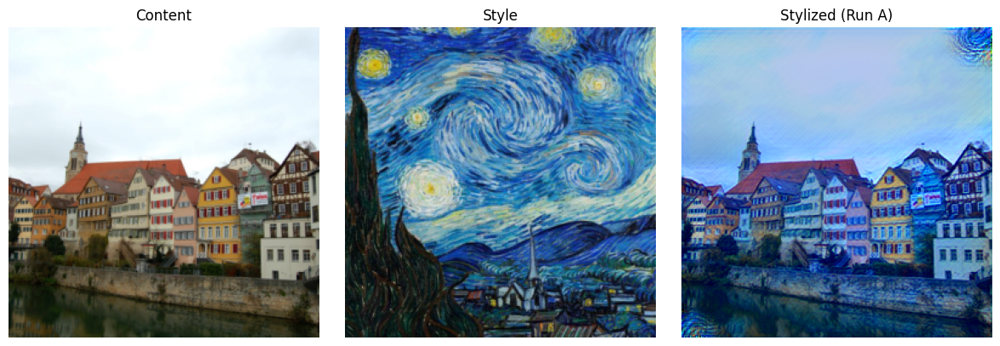


Stylizing with Model B...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c1.0_s100000.0_lr0.001.jpg
Runtime for B: 2.98 seconds


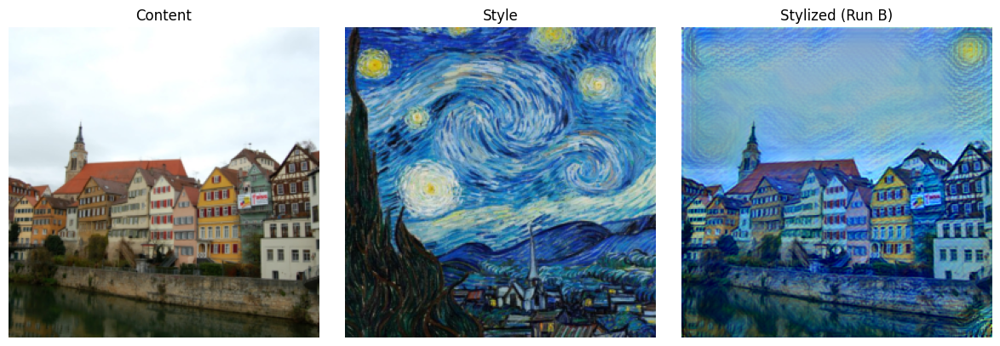


Stylizing with Model C...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c1.0_s200000.0_lr0.001.jpg
Runtime for C: 3.29 seconds


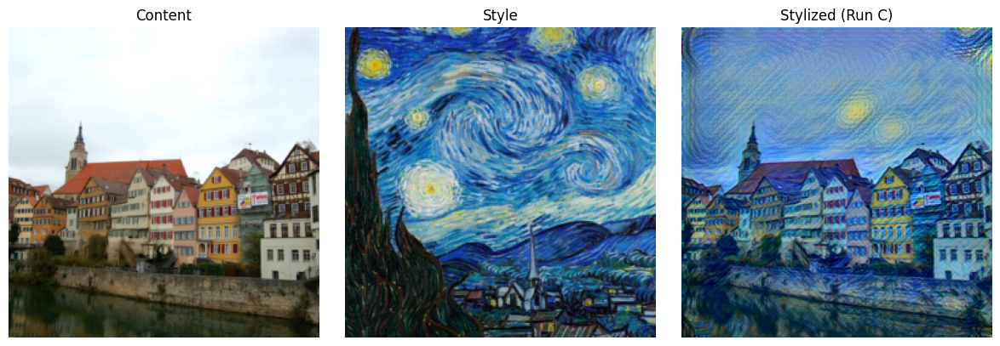


Stylizing with Model D...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c2.0_s50000.0_lr0.001.jpg
Runtime for D: 2.47 seconds


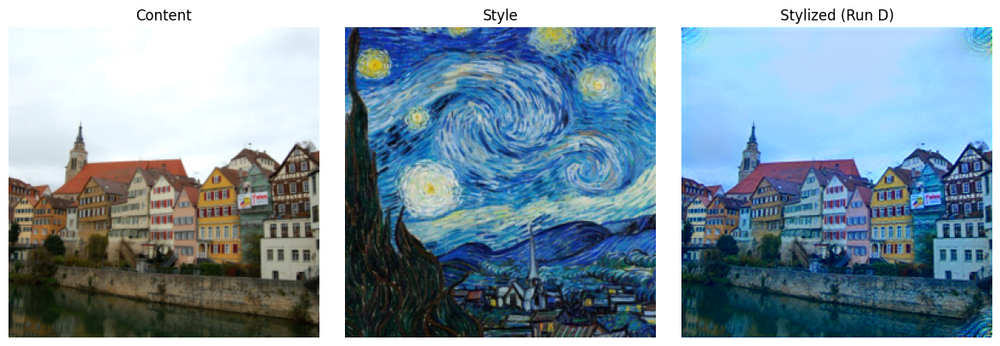


Stylizing with Model E...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c2.0_s100000.0_lr0.001.jpg
Runtime for E: 3.15 seconds


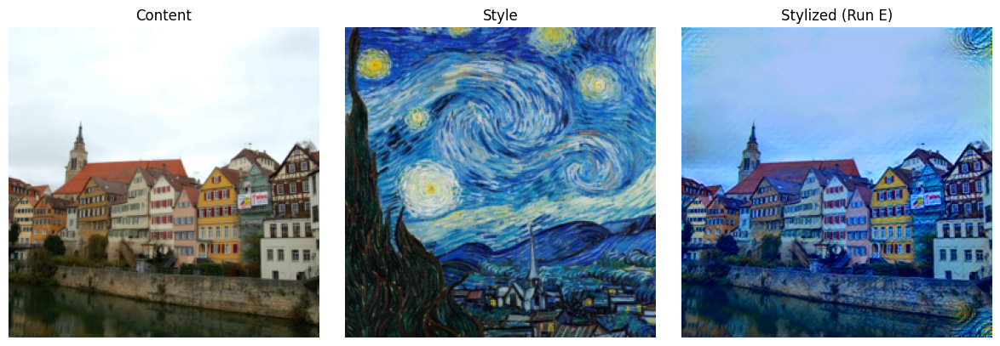


Stylizing with Model F...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c2.0_s200000.0_lr0.001.jpg
Runtime for F: 3.89 seconds


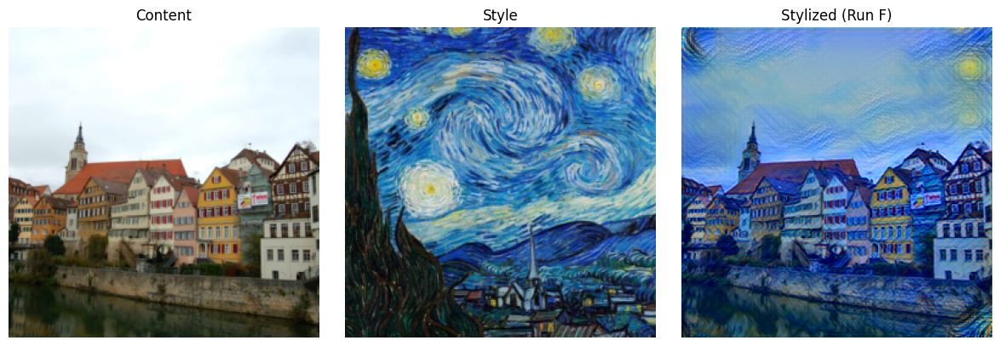


Stylizing with Model G...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c1.0_s50000.0_lr0.001_rmsprop.jpg
Runtime for G: 2.83 seconds


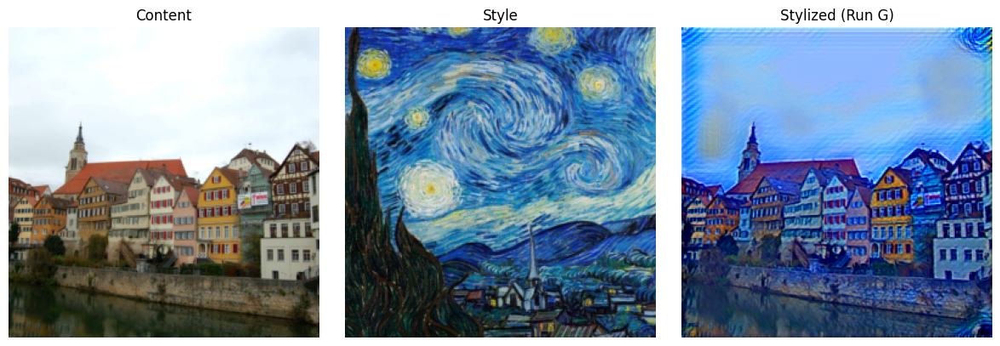


Stylizing with Model H...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c1.0_s100000.0_lr0.001_rmsprop.jpg
Runtime for H: 2.91 seconds


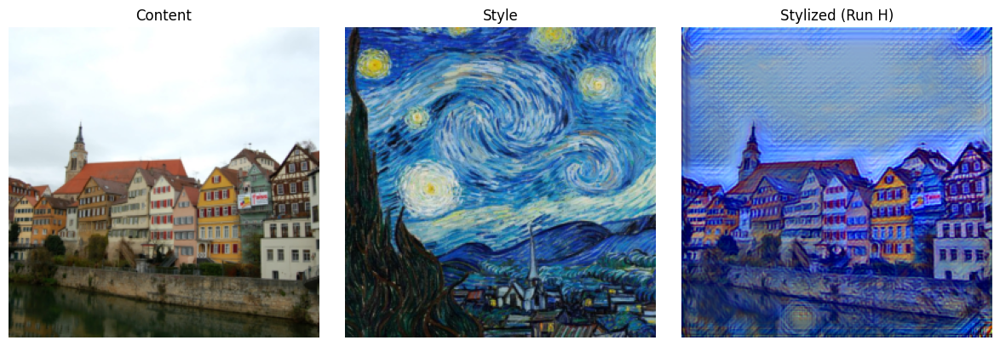


Stylizing with Model I...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c1.0_s200000.0_lr0.001_rmsprop.jpg
Runtime for I: 2.97 seconds


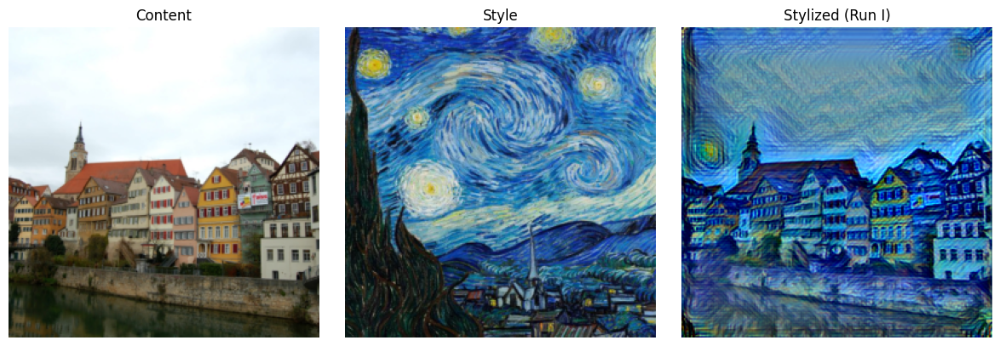


Stylizing with Model J...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c2.0_s50000.0_lr0.001_rmsprop.jpg
Runtime for J: 2.92 seconds


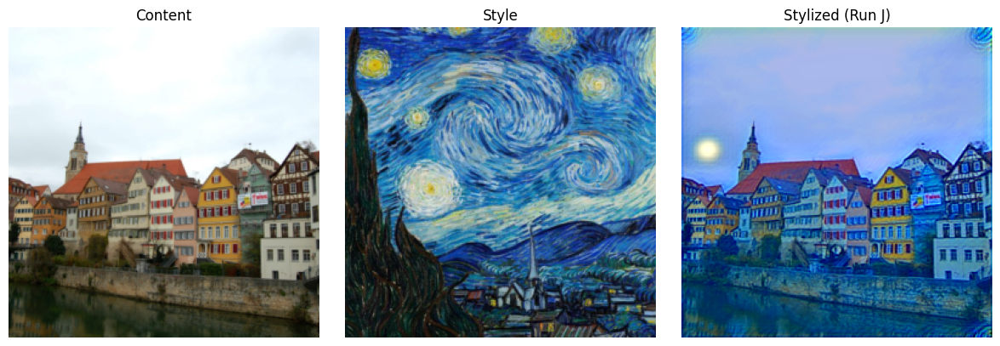


Stylizing with Model K...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c2.0_s100000.0_lr0.001_rmsprop.jpg
Runtime for K: 2.99 seconds


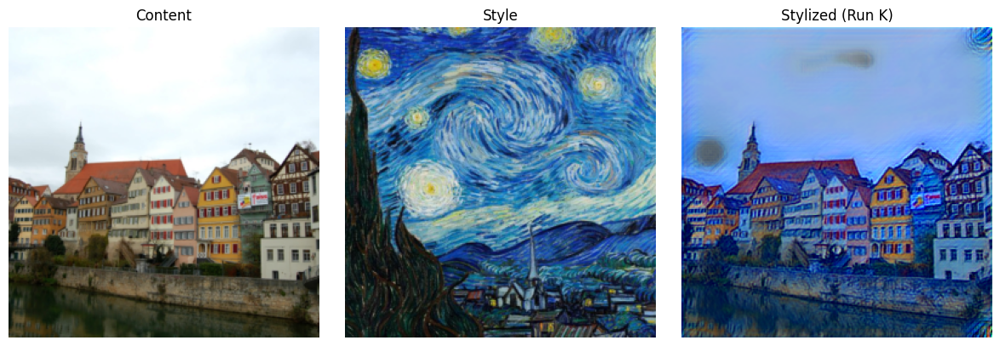


Stylizing with Model L...
Saved: /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs/houses_content_stylized_hyp_c2.0_s200000.0_lr0.001_rmsprop.jpg
Runtime for L: 3.24 seconds


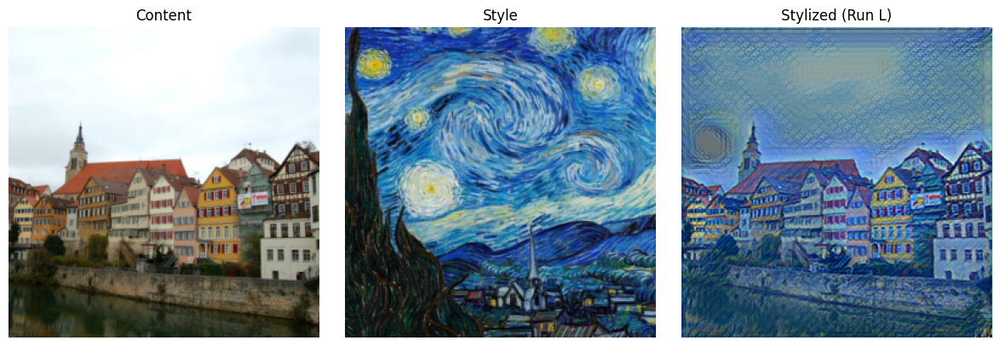

In [ ]:
stylize_image_hparams(
    model_runs=model_runs,
    style_image_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/Van-Gogh-Starry-Night.jpg",
    content_image_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/houses_content.jpg",
    output_dir="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/stylized_hparam_outputs"
)

In [ ]:
# Stylization function
def stylize_image(model_path, style_image_path, content_image_path, output_path=None):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Preprocessing transform
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

    # Load and preprocess content
    content_img = Image.open(content_image_path).convert("RGB")
    content_tensor = transform(content_img).unsqueeze(0).to(device)

    # Load and preprocess style
    style_tensor = None
    if style_image_path:
        style_img = Image.open(style_image_path).convert("RGB")
        style_tensor = transform(style_img).unsqueeze(0).to(device)

    # Load trained model
    model = TransformerNet().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    # Stylize
    with torch.no_grad():
        output = model(content_tensor)

    # Convert all images to numpy
    content_np = deprocess_stylized_image(content_tensor)
    style_np = deprocess_stylized_image(style_tensor) if style_tensor is not None else None
    stylized_np = deprocess_stylized_image(output)

    # Plot all images
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(content_np)
    plt.title("Content")
    plt.axis("off")

    if style_np is not None:
        plt.subplot(1, 3, 2)
        plt.imshow(style_np)
        plt.title("Style")
        plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(stylized_np)
    plt.title("Stylized")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    # Save
    if output_path:
        Image.fromarray(stylized_np).save(output_path)
        print(f"Stylized image saved to {output_path}")

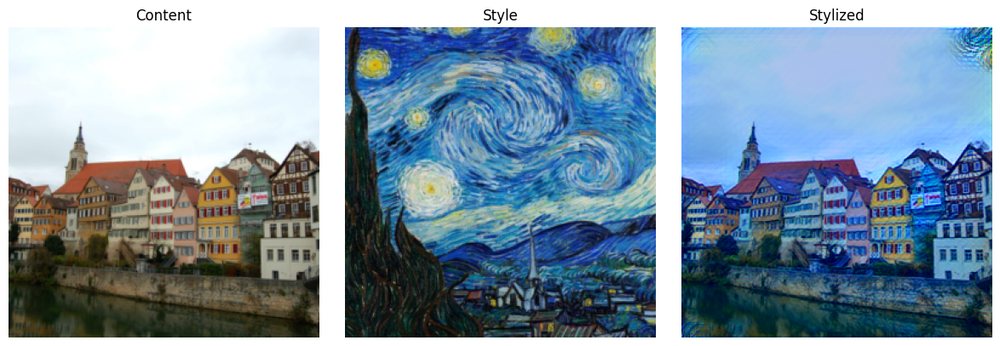

Stylized image saved to /content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/houses_content_stylized_hyp_c1.0_s50000.0_lr0.001.jpg


In [ ]:
stylize_image(
    model_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/starry_pspm_model_hyp_c1.0_s50000.0_lr0.001.pth",
    style_image_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/Van-Gogh-Starry-Night.jpg",
    content_image_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/houses_content.jpg",
    output_path="/content/drive/MyDrive/University of London/Year 3/FINAL PROJECT/Final Project Code/PSPM/houses_content_stylized_hyp_c1.0_s50000.0_lr0.001.jpg")